# Viability-only MLP: does it denoise as `noise_viab` grows?

Trains a plain `ProfileMLP` (same architecture as the sibling notebooks in this folder) on
**viability only** (`target1`, log enrichment `log((lambda2p+eps)/(lambda0p+eps))`) -- no
`F_sel`/`J_sel` regime is studied here, selectivity is simply not used.

Ground truth is the canonical `F_viab`/`J_viab` (`load_F_viab_aav9_mlp`/`load_J_viab_aav9_mlp`),
i.e. whatever is currently exported to `lib/aav9_F_viab_mlp.npy`/`lib/aav9_J_viab_mlp.npy`. As of
2026-08-13 this is the **regularized** naive-retrieval + L2-credibility-shrinkage GT
(`REG_STRENGTH=5`), not the MLP-probed GT the 2026-08-12 runs of `MLP_for_anticorrelated_weights.ipynb`
used (see project memory `no-mlp-ground-truth-directed-evolution` for why the MLP-probed version was
rejected as GT).

**Question.** As `noise_viab` (the per-cell expression noise `E_{s,j} = exp(noise_viab * Z_{s,j})`
in `Protocol.produce_capsids`) grows, the NGS-measured `target1` gets noisier around the true
noiseless `compute_score(F_viab, J_viab)`. Can the MLP still recover that true score -- i.e. does
`pearson(prediction, true_score)` stay clearly above `pearson(noisy_target1, true_score)` -- or does
the model just mirror whatever noisy label it was handed, with no real denoising benefit?

**Design.** ONE fixed pool of `N=20,000` random sequences (same key/convention as the sibling
notebooks), the SAME train/val/test split reused across every noise level -- only `noise_viab`
changes between runs, so any difference in predictive quality is attributable to noise, not to pool
composition. `F_sel`/`J_sel` are passed to `ProtocolV3` only because its constructor requires
*something*; they don't affect `target1` (viability depends solely on `F_viab`/`J_viab` +
`noise_viab`) and are never read below.


## 0. Setup

In [1]:
import os
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
# Must run before the first `import jax` anywhere -- same convention as the sibling notebooks.


In [2]:
import jax
import jax.numpy as jnp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from scipy.stats import spearmanr

from flax import nnx
from typing import Optional
import optax
from tqdm.auto import tqdm

from sequence_classesV1 import *
from analysisV1 import *
from initialize_weights import (
    load_F_viab_aav9_mlp, load_J_viab_aav9_mlp,
    NUM_AMINO_ACIDS, NUM_POSITIONS,
)

print(f"JAX backend: {jax.default_backend()} -- devices: {jax.devices()}")


/home/spark0735/MERLIN_YASSINE/Directed-Evolution-loop/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


JAX backend: gpu -- devices: [CudaDevice(id=0)]


## 1. Ground truth: `F_viab` / `J_viab` (regularized)

Loaded via `load_F_viab_aav9_mlp`/`load_J_viab_aav9_mlp` -- picks up whatever is currently exported
to the `.npy` files, so if those get regenerated again later this cell reflects that automatically.


F_viab shape: (20, 7)   J_viab shape: (7, 7, 20, 20)


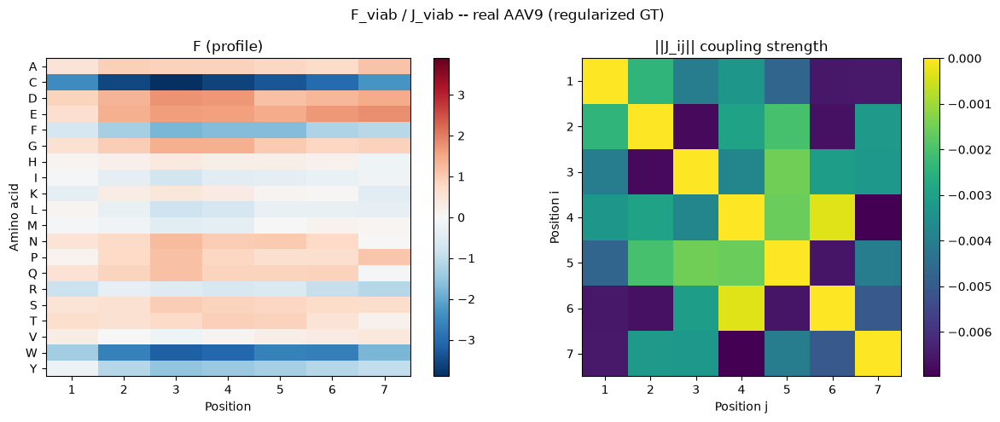

In [3]:
F_viab = load_F_viab_aav9_mlp()
J_viab = load_J_viab_aav9_mlp()

print(f"F_viab shape: {F_viab.shape}   J_viab shape: {J_viab.shape}")
_ = plot_teacher_weights(F_viab, J_viab, title="F_viab / J_viab -- real AAV9 (regularized GT)")
plt.show()


## 2. Fixed sequence pool, true noiseless score, and the `noise_viab` sweep grid

`compute_score_array` gives the TRUE noiseless score for the fixed pool -- the target the MLP is
trying to recover despite the noisy NGS measurement it's actually trained on. `dataset_filename`/
`build_or_load_dataset` are the same caching helpers as the sibling notebooks (identical recipe),
with a dedicated `label="viabdenoise"` so these CSVs never collide with the selectivity-regime
notebooks' cached files.


In [4]:
def dataset_filename(protocol, label):
    def fmt(v):
        return f"{float(v):g}".replace(".", "")

    if protocol.noise_viab == protocol.noise_sel:
        noise_part = f"noise{fmt(protocol.noise_viab)}"
    else:
        noise_part = f"noiseviab{fmt(protocol.noise_viab)}_noisesel{fmt(protocol.noise_sel)}"

    return (f"diversity{protocol.d0}_Tsel{fmt(protocol._T_sel)}"
            f"_Tviab{fmt(protocol._T_viab)}_{noise_part}_{label}.csv")


def build_or_load_dataset(protocol, sequences, log_enr_viab, log_enr_sel, label):
    """(sequence, target1=viability log-enrichment, target2=selectivity log-enrichment)
    dataset for this protocol's parameters -- identical to the sibling notebooks' version."""
    path = dataset_filename(protocol, label)
    if os.path.exists(path):
        print(f"{path} already exists -- loading from disk")
        return pd.read_csv(path)

    seq_strings = ["".join(AA_LABELS[a] for a in row) for row in np.asarray(sequences)]
    df = pd.DataFrame({"sequence": seq_strings, "target1": log_enr_viab, "target2": log_enr_sel})
    df.to_csv(path, index=False)
    print(f"saved {path} ({len(df)} rows)")
    return df


In [5]:
key = jax.random.key(0)
key, k_seq = jax.random.split(key)

N = 50_000
sequences = jax.random.randint(k_seq, shape=(N, NUM_POSITIONS), minval=0, maxval=NUM_AMINO_ACIDS)

def compute_score_array(seq, F, J, L=NUM_POSITIONS):
    """Noiseless ground-truth score -- same formula as Protocol.compute_score, decoupled
    from a Protocol instance so it can be applied directly to the fixed sequence pool."""
    scores = jnp.sum(F[seq, jnp.arange(L)], axis=1)
    for i in range(L):
        for j in range(i + 1, L):
            scores = scores + J[i, j, seq[:, i], seq[:, j]]
    return scores

true_score_all = np.asarray(compute_score_array(sequences, F_viab, J_viab))

X_all = np.eye(NUM_AMINO_ACIDS, dtype=np.float32)[np.asarray(sequences)].reshape(N, -1)

idx_train, idx_test = train_test_split(np.arange(N), test_size=0.5, random_state=0)
X_train_full, X_test = X_all[idx_train], X_all[idx_test]
true_score_test = true_score_all[idx_test]

print(f"sequences: {N:,}   X_train_full: {X_train_full.shape}   X_test: {X_test.shape}")

NOISE_GRID = [0.0, 0.1, 0.25, 0.5, 1.0, 2.0, 4.0, 8.]
print(f"noise_viab sweep: {NOISE_GRID}")


sequences: 50,000   X_train_full: (25000, 140)   X_test: (25000, 140)
noise_viab sweep: [0.0, 0.1, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0]


## 3. Model + training loop

Identical `ProfileMLP` (Linear + BatchNorm + Dropout + gelu, twice, then a scalar linear head) and
`train_profile_mlp` (warmup-cosine-decay AdamW, early stopping on val MSE) as the sibling notebooks
-- no bilinear head, on purpose, same reasoning as `cheated_library_MLP.ipynb`.


In [6]:
def split_train_val(X, y, val_frac=0.15, seed=0):
    rng   = np.random.default_rng(seed)
    idx   = rng.permutation(len(X))
    n_val = int(len(X) * val_frac)
    val_idx, train_idx = idx[:n_val], idx[n_val:]
    return X[train_idx], y[train_idx], X[val_idx], y[val_idx]


class ProfileMLP(nnx.Module):
    """
    MLP over the one-hot encoded per-position sequence (L=7 positions x A=20 amino acids
    -> 140 indicator features) -> scalar score. Identical to the sibling notebooks' ProfileMLP
    (Linear + BatchNorm + Dropout + gelu).
    """

    def __init__(self, input_dim: int, hidden_dims: tuple[int, int] = (256, 128),
                 dropout_rate: float = 0.1, *, rngs: nnx.Rngs):
        h1, h2 = hidden_dims
        self.linear1    = nnx.Linear(input_dim, h1, rngs=rngs)
        self.batchnorm1 = nnx.BatchNorm(h1, use_running_average=False, rngs=rngs)
        self.dropout1   = nnx.Dropout(rate=dropout_rate, rngs=rngs)
        self.linear2    = nnx.Linear(h1, h2, rngs=rngs)
        self.batchnorm2 = nnx.BatchNorm(h2, use_running_average=False, rngs=rngs)
        self.dropout2   = nnx.Dropout(rate=dropout_rate, rngs=rngs)
        self.linear3    = nnx.Linear(h2, 1, rngs=rngs)

    def __call__(self, x: jax.Array, *, train: bool, rngs: Optional[nnx.Rngs] = None) -> jax.Array:
        x = self.linear1(x)
        x = self.batchnorm1(x, use_running_average=not train)
        x = self.dropout1(x, deterministic=not train, rngs=rngs)
        x = nnx.gelu(x)

        x = self.linear2(x)
        x = self.batchnorm2(x, use_running_average=not train)
        x = self.dropout2(x, deterministic=not train, rngs=rngs)
        x = nnx.gelu(x)

        return self.linear3(x).squeeze(-1)


In [7]:
@nnx.jit
def train_step(model, optimizer, x, y, rngs):
    """
    x : (batch, L*A) one-hot encoded per-position amino-acid indicators
    y : (batch,) target log enrichment
    """
    def loss_fn(model, rngs):
        y_pred = model(x, train=True, rngs=rngs)
        return jnp.mean((y_pred - y) ** 2)

    loss, grads = nnx.value_and_grad(loss_fn)(model, rngs)
    optimizer.update(model, grads)
    return loss


@nnx.jit
def eval_step(model, x, y):
    y_pred = model(x, train=False)
    return jnp.mean((y_pred - y) ** 2)


@nnx.jit
def predict_log_enrichment(model, x):
    return model(x, train=False)


@nnx.scan(in_axes=(nnx.Carry, 0, 0), out_axes=(nnx.Carry, 0))
def train_epoch_scan(carry, xb, yb):
    """Fuses one epoch's mini-batch train_step calls into a single compiled nnx.scan
    instead of a Python for-loop issuing one XLA dispatch per batch."""
    model, optimizer, rngs = carry
    loss = train_step(model, optimizer, xb, yb, rngs)
    return (model, optimizer, rngs), loss


In [8]:
def train_profile_mlp(X_train, y_train, X_val, y_val, hidden_dims=(128, 64),
                       dropout_rate=0.1, epochs=300, batch_size=256,
                       peak_lr=1e-3, final_lr=1e-5, weight_decay=0,
                       patience=20, seed=0, verbose=True):
    rngs = nnx.Rngs(seed)
    model = ProfileMLP(input_dim=X_train.shape[1], hidden_dims=hidden_dims,
                        dropout_rate=dropout_rate, rngs=rngs)

    n_train         = X_train.shape[0]
    steps_per_epoch = max(n_train // batch_size, 1)
    total_steps     = steps_per_epoch * epochs

    lr_schedule_fn = optax.warmup_cosine_decay_schedule(
        init_value=0., peak_value=peak_lr,
        warmup_steps=int(total_steps * 0.1),
        decay_steps=int(total_steps * 0.9),
        end_value=final_lr,
    )
    optimizer = nnx.Optimizer(
        model, optax.adamw(learning_rate=lr_schedule_fn, weight_decay=weight_decay), wrt=nnx.Param
    )

    X_train, y_train = jnp.asarray(X_train), jnp.asarray(y_train)
    X_val,   y_val   = jnp.asarray(X_val),   jnp.asarray(y_val)

    shuffle_key = jax.random.key(seed)
    best_val, best_state, bad_epochs = float("inf"), None, 0
    history = {"train_loss": [], "val_loss": []}

    for epoch in tqdm(range(epochs), desc="Training", disable=not verbose):
        shuffle_key, perm_key = jax.random.split(shuffle_key)
        perm      = jax.random.permutation(perm_key, n_train)
        batch_idx = perm[: steps_per_epoch * batch_size].reshape(steps_per_epoch, batch_size)

        (model, optimizer, rngs), step_losses = train_epoch_scan(
            (model, optimizer, rngs), X_train[batch_idx], y_train[batch_idx]
        )
        train_loss = float(jnp.mean(step_losses))
        val_loss   = float(eval_step(model, X_val, y_val))

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)

        if val_loss < best_val - 1e-5:
            best_val, bad_epochs = val_loss, 0
            best_state = nnx.state(model)
        else:
            bad_epochs += 1
            if bad_epochs >= patience:
                if verbose:
                    print(f"Early stopping at epoch {epoch} (best val MSE={best_val:.4f})")
                break

    nnx.update(model, best_state)
    return model, history


## 4. Sweep: simulate + train one `ProfileMLP` per `noise_viab` level

For each `noise_viab`: run `ProtocolV3.N_loop_DE(1)` on the SAME fixed pool to get a fresh
NGS-measured `target1`, train a fresh `ProfileMLP` on it (same train/val split every time), then
compare on the held-out test fold:
- `r_raw` = `pearson(noisy target1, true_score)` -- how corrupted the raw label already is
- `r_model` = `pearson(prediction, true_score)` -- can the model recover the true score anyway
- `r_fit` = `pearson(prediction, noisy target1)` -- ordinary fit quality vs. its own training label
- top-10% precision, same comparison (raw label vs. prediction) against the true-score ranking


In [9]:
results = []
preds_by_noise   = {}
y_noisy_by_noise = {}
hist_by_noise    = {}
models_by_noise  = {}

for nv in NOISE_GRID:
    print(f"\n=== noise_viab = {nv} ===")
    protocol_nv = ProtocolV3(N0=1_000_000_000, N1=500_000_000,
            dilution_factor=10, sequences=sequences, D=1e9,
            F_viab=F_viab, J_viab=J_viab, F_sel=F_viab, J_sel=J_viab,  # F_sel/J_sel unused dummy
            noise_viab=nv, noise_sel=0.5, T_sel=1, T_viab=1,
            )

    _bio_row, ngs_row = protocol_nv.N_loop_DE(1)[0]
    lambda0p, lambda2p, _lambda3p = (np.asarray(x) for x in ngs_row)
    eps = 1.0  # same pseudocount convention as MLP_for_anticorrelated_weights.ipynb section 1
    log_enr_viab_nv = np.log((lambda2p + eps) / (lambda0p + eps))
    log_enr_sel_nv  = np.zeros_like(log_enr_viab_nv)  # unused placeholder -- only target1 matters here

    dataset_nv = build_or_load_dataset(protocol_nv, sequences, log_enr_viab_nv, log_enr_sel_nv,
                                        label="viabdenoise")
    y_all_nv = dataset_nv["target1"].to_numpy()
    y_train_nv, y_test_nv = y_all_nv[idx_train], y_all_nv[idx_test]

    Xtr, ytr, Xva, yva = split_train_val(X_train_full, y_train_nv, val_frac=0.15, seed=0)
    model_nv, hist_nv = train_profile_mlp(Xtr, ytr, Xva, yva, seed=0, verbose=False)

    pred_test_nv = np.asarray(predict_log_enrichment(model_nv, jnp.asarray(X_test)))

    r_raw   = pearson(y_test_nv, true_score_test)      # raw noisy label vs. true score
    r_model = pearson(pred_test_nv, true_score_test)   # prediction vs. true score
    r_fit   = pearson(pred_test_nv, y_test_nv)          # prediction vs. its own training label

    p_raw_10   = precision_at_k(true_score_test, y_test_nv,    k_frac=0.10)
    p_model_10 = precision_at_k(true_score_test, pred_test_nv, k_frac=0.10)

    print(f"  r(raw noisy target1, true score)  = {r_raw:.3f}")
    print(f"  r(MLP prediction,   true score)   = {r_model:.3f}")
    print(f"  r(MLP prediction,   its own label) = {r_fit:.3f}")
    print(f"  top-10% precision  raw / model     = {p_raw_10:.3f} / {p_model_10:.3f}")

    results.append(dict(noise_viab=nv, r_raw=r_raw, r_model=r_model, r_fit=r_fit,
                         p_raw_10=p_raw_10, p_model_10=p_model_10))
    preds_by_noise[nv]   = pred_test_nv
    y_noisy_by_noise[nv] = y_test_nv
    hist_by_noise[nv]    = hist_nv
    models_by_noise[nv]  = model_nv

results_df = pd.DataFrame(results)
results_df



=== noise_viab = 0.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   2%|▎         | 1/40 [00:00<00:31,  1.26it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:04<00:00,  4.62s/it]

Directed evolution rounds: 100%|██████████| 1/1 [00:04<00:00,  4.62s/it]

diversity50000_Tsel1_Tviab1_noiseviab0_noisesel05_viabdenoise.csv already exists -- loading from disk


  r(raw noisy target1, true score)  = 0.982
  r(MLP prediction,   true score)   = 0.985
  r(MLP prediction,   its own label) = 0.971
  top-10% precision  raw / model     = 0.854 / 0.859

=== noise_viab = 0.1 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  88%|████████▊ | 35/40 [00:00<00:00, 347.03it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

diversity50000_Tsel1_Tviab1_noiseviab01_noisesel05_viabdenoise.csv already exists -- loading from disk


  r(raw noisy target1, true score)  = 0.982
  r(MLP prediction,   true score)   = 0.986
  r(MLP prediction,   its own label) = 0.971
  top-10% precision  raw / model     = 0.856 / 0.856

=== noise_viab = 0.25 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles: 100%|██████████| 40/40 [00:00<00:00, 394.35it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  98%|█████████▊| 39/40 [00:00<00:00, 387.67it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

diversity50000_Tsel1_Tviab1_noiseviab025_noisesel05_viabdenoise.csv already exists -- loading from disk


  r(raw noisy target1, true score)  = 0.981
  r(MLP prediction,   true score)   = 0.985
  r(MLP prediction,   its own label) = 0.971
  top-10% precision  raw / model     = 0.857 / 0.857

=== noise_viab = 0.5 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  98%|█████████▊| 39/40 [00:00<00:00, 389.04it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

diversity50000_Tsel1_Tviab1_noise05_viabdenoise.csv already exists -- loading from disk


  r(raw noisy target1, true score)  = 0.980
  r(MLP prediction,   true score)   = 0.985
  r(MLP prediction,   its own label) = 0.969
  top-10% precision  raw / model     = 0.851 / 0.857

=== noise_viab = 1.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

diversity50000_Tsel1_Tviab1_noiseviab1_noisesel05_viabdenoise.csv already exists -- loading from disk


  r(raw noisy target1, true score)  = 0.974
  r(MLP prediction,   true score)   = 0.983
  r(MLP prediction,   its own label) = 0.961
  top-10% precision  raw / model     = 0.822 / 0.845

=== noise_viab = 2.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

diversity50000_Tsel1_Tviab1_noiseviab2_noisesel05_viabdenoise.csv already exists -- loading from disk


  r(raw noisy target1, true score)  = 0.939
  r(MLP prediction,   true score)   = 0.970
  r(MLP prediction,   its own label) = 0.918
  top-10% precision  raw / model     = 0.727 / 0.796

=== noise_viab = 4.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

diversity50000_Tsel1_Tviab1_noiseviab4_noisesel05_viabdenoise.csv already exists -- loading from disk


  r(raw noisy target1, true score)  = 0.811
  r(MLP prediction,   true score)   = 0.934
  r(MLP prediction,   its own label) = 0.766
  top-10% precision  raw / model     = 0.525 / 0.698

=== noise_viab = 8.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles: 100%|██████████| 40/40 [00:00<00:00, 392.12it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  95%|█████████▌| 38/40 [00:00<00:00, 378.99it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

diversity50000_Tsel1_Tviab1_noiseviab8_noisesel05_viabdenoise.csv already exists -- loading from disk


  r(raw noisy target1, true score)  = 0.531
  r(MLP prediction,   true score)   = 0.791
  r(MLP prediction,   its own label) = 0.435
  top-10% precision  raw / model     = 0.205 / 0.406


,noise_viab,r_raw,r_model,r_fit,p_raw_10,p_model_10
0,0.00,0.981694,0.985145,0.971082,0.8544,0.8588
1,0.10,0.981663,0.985534,0.971077,0.8556,0.8560
2,0.25,0.981340,0.985043,0.970637,0.8568,0.8572
3,0.50,0.980181,0.984677,0.969057,0.8508,0.8568
4,1.00,0.974218,0.982659,0.961127,0.8220,0.8452
5,2.00,0.939276,0.970480,0.918060,0.7268,0.7956
6,4.00,0.811008,0.933644,0.765593,0.5252,0.6980
7,8.00,0.531444,0.790667,0.434763,0.2048,0.4056


## 5. Does the MLP denoise? Correlation with the TRUE score vs. `noise_viab`

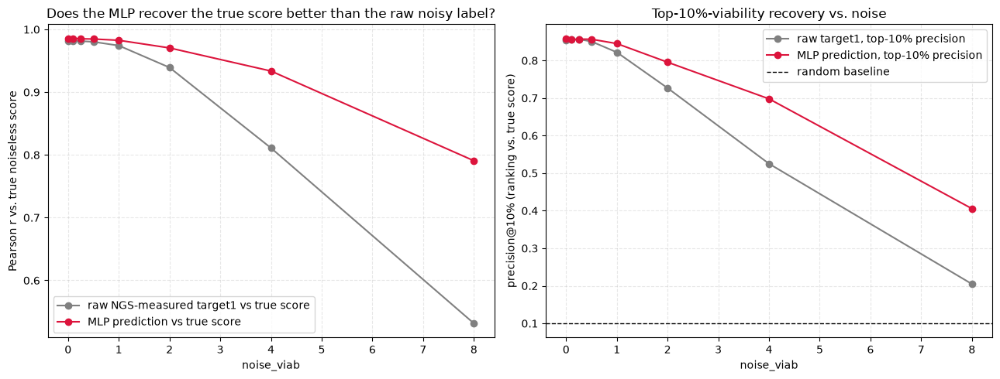

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

ax = axes[0]
ax.plot(results_df["noise_viab"], results_df["r_raw"],   "o-", color="gray",
        label="raw NGS-measured target1 vs true score")
ax.plot(results_df["noise_viab"], results_df["r_model"], "o-", color="crimson",
        label="MLP prediction vs true score")
ax.set_xlabel("noise_viab")
ax.set_ylabel("Pearson r vs. true noiseless score")
ax.set_title("Does the MLP recover the true score better than the raw noisy label?")
ax.legend()
ax.grid(True, linestyle="--", alpha=0.3)

ax = axes[1]
ax.plot(results_df["noise_viab"], results_df["p_raw_10"],   "o-", color="gray",
        label="raw target1, top-10% precision")
ax.plot(results_df["noise_viab"], results_df["p_model_10"], "o-", color="crimson",
        label="MLP prediction, top-10% precision")
ax.axhline(0.10, color="black", lw=1, ls="--", label="random baseline")
ax.set_xlabel("noise_viab")
ax.set_ylabel("precision@10% (ranking vs. true score)")
ax.set_title("Top-10%-viability recovery vs. noise")
ax.legend()
ax.grid(True, linestyle="--", alpha=0.3)

fig.tight_layout()
plt.show()


## 6. Scatter: predicted vs. true score, low / mid / high noise

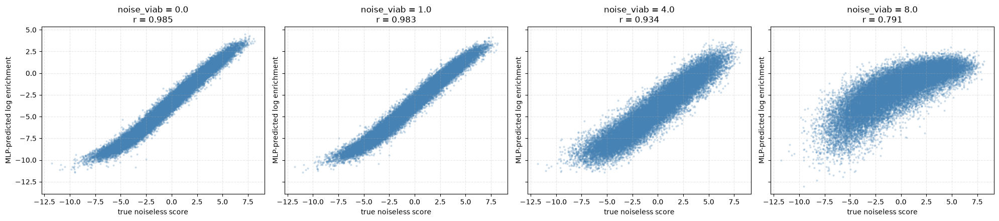

In [11]:
rep_levels = [NOISE_GRID[0], NOISE_GRID[len(NOISE_GRID) // 2], NOISE_GRID[-2], NOISE_GRID[-1]]

fig, axes = plt.subplots(1, len(rep_levels), figsize=(5 * len(rep_levels), 4.5),
                          sharex=True, sharey=True)
for ax, nv in zip(axes, rep_levels):
    r = pearson(preds_by_noise[nv], true_score_test)
    ax.scatter(true_score_test, preds_by_noise[nv], s=4, alpha=0.2, color="steelblue")
    ax.set_xlabel("true noiseless score")
    ax.set_ylabel("MLP-predicted log enrichment")
    ax.set_title(f"noise_viab = {nv}\nr = {r:.3f}")
    ax.grid(True, linestyle="--", alpha=0.3)
fig.tight_layout()
plt.show()


## 7. Top-k recovery at the hardest noise level

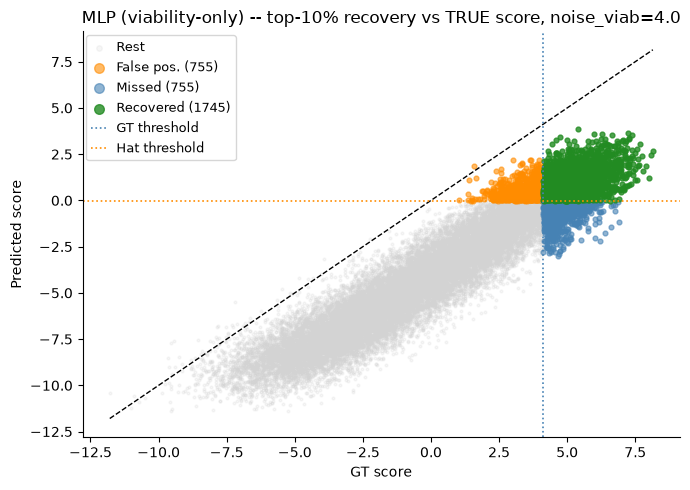

In [12]:
nv_hardest = NOISE_GRID[-2]
fig = plot_topk_recovery(true_score_test, preds_by_noise[nv_hardest], k_frac=0.10,
                          title=f"MLP (viability-only) -- top-10% recovery vs TRUE score, "
                                f"noise_viab={nv_hardest}")
plt.show()


## 8. Where do the TRUE top-500 GT variants land in the MLP's predicted distribution?

The correlation/precision numbers above are computed on the held-out test fold (ordinary random
variants). But the whole point of a viability model is to recognize the rare, high-value
combinations that pairwise `J` epistasis creates -- the actual global optimum, not just "a decent
variant". This section checks that directly, at every noise level.


<div style="background:#eaf2fb; border-left:5px solid #2f6fed; border-radius:4px; padding:10px 16px; margin:10px 0; font-size:0.95em; color:#0a2f5c;">
<b>Which "top 500" / top-K is this?</b><br>
The <b>GLOBAL/THEORETICAL top-500</b>: an exhaustive brute-force scan (<code>brute_force_top_k</code>)
over all <code>20**7</code> &asymp; 1.28 billion possible sequences against the ground-truth
<code>F_viab</code>/<code>J_viab</code>, keeping <code>K_BEST = 500</code> -- same recipe and same K
as <code>cheated_library_MLP.ipynb</code> section 3 / <code>MLP_bilinear_head_anticorrelated.ipynb</code>
section 5. Checked below to confirm none of these 500 sequences leaked into the fixed 20,000-sequence
pool every noise-level model in this notebook was trained/evaluated on. The gray histogram background
in the plot further down is each noise level's own held-out <b>10,000-sequence test population</b>
(<code>preds_by_noise</code>, from section 4) -- not a separate random sample.
</div>


In [13]:
K_BEST = 500

@jax.jit
def _score_chunk(idx, F, J, L=NUM_POSITIONS, A=NUM_AMINO_ACIDS):
    tmp = idx
    digits = []
    for _ in range(L):
        digits.append(tmp % A)
        tmp = tmp // A
    seq = jnp.stack(digits[::-1], axis=1).astype(jnp.int32)
    return seq, compute_score_array(seq, F, J, L)


def brute_force_top_k(F, J, k=50, chunk_size=20_000_000, L=NUM_POSITIONS, A=NUM_AMINO_ACIDS):
    """Exhaustively scores EVERY possible sequence (A**L of them) against the ground-truth F/J
    and keeps a running top-k, in chunks (so the full A**L x L array of sequences is never
    materialized at once). Identical recipe to the sibling notebooks."""
    total = A ** L
    best_scores = jnp.full((k,), -jnp.inf)
    best_seqs   = jnp.zeros((k, L), dtype=jnp.int32)

    for start in tqdm(range(0, total, chunk_size), desc="brute-force scan"):
        end = min(start + chunk_size, total)
        idx = jnp.arange(start, end)
        seq_chunk, scores_chunk = _score_chunk(idx, F, J)

        kk = min(k, scores_chunk.shape[0])
        local_vals, local_idx = jax.lax.top_k(scores_chunk, kk)
        local_seqs = seq_chunk[local_idx]

        cand_scores = jnp.concatenate([best_scores, local_vals])
        cand_seqs   = jnp.concatenate([best_seqs, local_seqs], axis=0)
        best_scores, merge_idx = jax.lax.top_k(cand_scores, k)
        best_seqs = cand_seqs[merge_idx]

    return np.asarray(best_seqs), np.asarray(best_scores)


best_seqs_viab, best_scores_viab = brute_force_top_k(F_viab, J_viab, k=K_BEST)
X_best_viab = np.eye(NUM_AMINO_ACIDS, dtype=np.float32)[best_seqs_viab].reshape(K_BEST, -1)

# Sanity check: none of the TRUE top-500 leaked into the fixed 20,000-sequence pool every
# noise-level model was trained/evaluated on -- same convention as cheated_library_MLP.ipynb.
pool_set = {tuple(row) for row in np.asarray(sequences)}
overlap = sum(tuple(row) in pool_set for row in best_seqs_viab)
print(f"TRUE top-{K_BEST} GT variants -- overlap with the fixed {N:,}-sequence pool: {overlap}")
assert overlap == 0, "TRUE-best variants leaked into the training/test pool"
print(f"TRUE global-optimum viability score: {best_scores_viab[0]:.2f}")


brute-force scan:   0%|          | 0/64 [00:00<?, ?it/s]

brute-force scan:   2%|▏         | 1/64 [00:00<00:56,  1.12it/s]

brute-force scan:   9%|▉         | 6/64 [00:01<00:07,  7.64it/s]

brute-force scan:  17%|█▋        | 11/64 [00:01<00:03, 14.14it/s]

brute-force scan:  25%|██▌       | 16/64 [00:01<00:02, 20.35it/s]

brute-force scan:  33%|███▎      | 21/64 [00:01<00:01, 26.07it/s]

brute-force scan:  41%|████      | 26/64 [00:01<00:01, 30.78it/s]

brute-force scan:  48%|████▊     | 31/64 [00:01<00:00, 34.67it/s]

brute-force scan:  56%|█████▋    | 36/64 [00:01<00:00, 37.77it/s]

brute-force scan:  64%|██████▍   | 41/64 [00:01<00:00, 40.08it/s]

brute-force scan:  72%|███████▏  | 46/64 [00:01<00:00, 41.23it/s]

brute-force scan:  80%|███████▉  | 51/64 [00:02<00:00, 42.37it/s]

brute-force scan:  88%|████████▊ | 56/64 [00:02<00:00, 43.24it/s]

brute-force scan:  95%|█████████▌| 61/64 [00:02<00:00, 44.15it/s]

brute-force scan: 100%|██████████| 64/64 [00:02<00:00, 27.97it/s]

TRUE top-500 GT variants -- overlap with the fixed 50,000-sequence pool: 0
TRUE global-optimum viability score: 9.88


In [14]:
pred_best_by_noise = {
    nv: np.asarray(predict_log_enrichment(models_by_noise[nv], jnp.asarray(X_best_viab)))
    for nv in NOISE_GRID
}

for nv in NOISE_GRID:
    pct = [100 * (preds_by_noise[nv] < v).mean() for v in pred_best_by_noise[nv]]
    print(f"noise_viab={nv:>4}: TRUE top-{K_BEST} median percentile in predicted distribution = "
          f"{np.median(pct):5.1f}   (#1 global-optimum variant -> {pct[0]:5.1f}th pct)")


noise_viab= 0.0: TRUE top-500 median percentile in predicted distribution = 100.0   (#1 global-optimum variant -> 100.0th pct)
noise_viab= 0.1: TRUE top-500 median percentile in predicted distribution = 100.0   (#1 global-optimum variant -> 100.0th pct)
noise_viab=0.25: TRUE top-500 median percentile in predicted distribution = 100.0   (#1 global-optimum variant -> 100.0th pct)
noise_viab= 0.5: TRUE top-500 median percentile in predicted distribution = 100.0   (#1 global-optimum variant -> 100.0th pct)
noise_viab= 1.0: TRUE top-500 median percentile in predicted distribution = 100.0   (#1 global-optimum variant -> 100.0th pct)
noise_viab= 2.0: TRUE top-500 median percentile in predicted distribution = 100.0   (#1 global-optimum variant -> 100.0th pct)
noise_viab= 4.0: TRUE top-500 median percentile in predicted distribution =  99.7   (#1 global-optimum variant -> 100.0th pct)
noise_viab= 8.0: TRUE top-500 median percentile in predicted distribution =  90.1   (#1 global-optimum variant 

In [15]:
N_BIG = 2_000_000
key_big = jax.random.key(999)
sequences_big = jax.random.randint(key_big, shape=(N_BIG, NUM_POSITIONS), minval=0, maxval=NUM_AMINO_ACIDS)
X_big = np.eye(NUM_AMINO_ACIDS, dtype=np.float32)[np.asarray(sequences_big)].reshape(N_BIG, -1)

# Background population for the distribution plots below: a big UNSEEN random sample, scored by
# each model directly (pure inference -- no ProtocolV3/NGS simulation needed, we only need where
# the model's own predicted distribution sits, not a real noisy label to compare against). Much
# closer to the sibling notebooks' 2,000,000-variant `X_big` than the 25,000-sequence held-out
# test fold used elsewhere in this notebook for the r_model/r_raw correlation checks (sections
# 5-7) -- those genuinely need real NGS labels, so they keep using X_test/preds_by_noise as-is.
preds_big_by_noise = {
    nv: np.asarray(predict_log_enrichment(models_by_noise[nv], jnp.asarray(X_big)))
    for nv in NOISE_GRID
}
print(f"X_big: {X_big.shape}")


X_big: (2000000, 140)


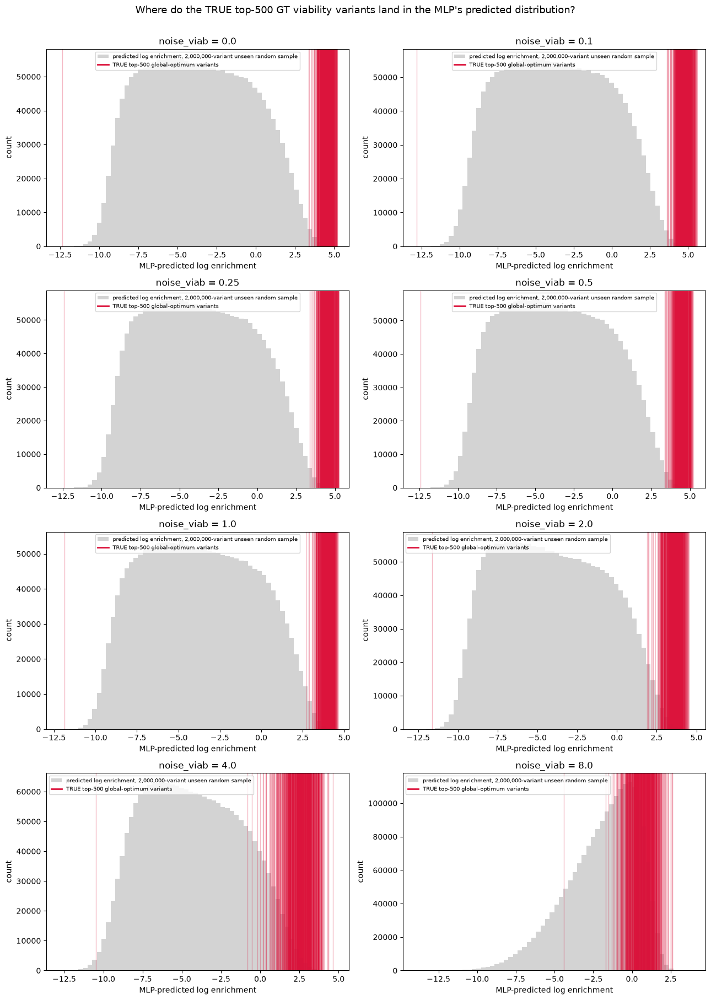

In [16]:
fig, axes = plt.subplots(4, 2, figsize=(13, 18))
axes = axes.flatten()
for ax, nv in zip(axes, NOISE_GRID):
    pred_pop  = preds_big_by_noise[nv]
    pred_best = pred_best_by_noise[nv]
    ax.hist(pred_pop, bins=60, color="lightgray",
            label=f"predicted log enrichment, {len(pred_pop):,}-variant unseen random sample")
    for v in pred_best:
        ax.axvline(v, color="crimson", alpha=0.3, lw=1)
    ax.axvline(pred_best[0], color="crimson", lw=2, label=f"TRUE top-{K_BEST} global-optimum variants")
    ax.set_xlabel("MLP-predicted log enrichment")
    ax.set_ylabel("count")
    ax.set_title(f"noise_viab = {nv}")
    ax.legend(fontsize=7)
for ax in axes[len(NOISE_GRID):]:
    ax.axis("off")
fig.suptitle("Where do the TRUE top-500 GT viability variants land in the MLP's predicted distribution?",
             y=1.005, fontsize=13)
fig.tight_layout()
plt.show()


## 9. Binned calibration: does averaging wash the noise out of the raw label?

Same 20-bin diagnostic as `AAV9_FJ_matrix_top500_check.ipynb` (the naive-`F_GT`/`J_naive`-vs-real-`target`
check), adapted here with the roles filled by this notebook's own variables:
`target` -> `y_noisy_by_noise[nv]` (the raw, noise-corrupted `target1` for the held-out test fold at
that noise level), `gt_score_abs` -> `true_score_test` (this notebook already knows the exact
noiseless score, so no `F_GT`/`J_naive` estimation step is needed -- it's the same fixed
`true_score_test` from section 2 at every noise level, since `X_test`'s sequences never change).

Sequences are ranked and grouped into 20 bins by their own noisy `target1` (exactly like the AAV9
notebook bins by real `target`), then each bin's mean noisy label is plotted against that same bin's
mean TRUE score. If binning recovers something close to `y = x` even where individual points are
scattered, that's direct evidence of the redundancy the MLP is exploiting to denoise (section 5) --
the true signal is there in aggregate, just buried per-point.


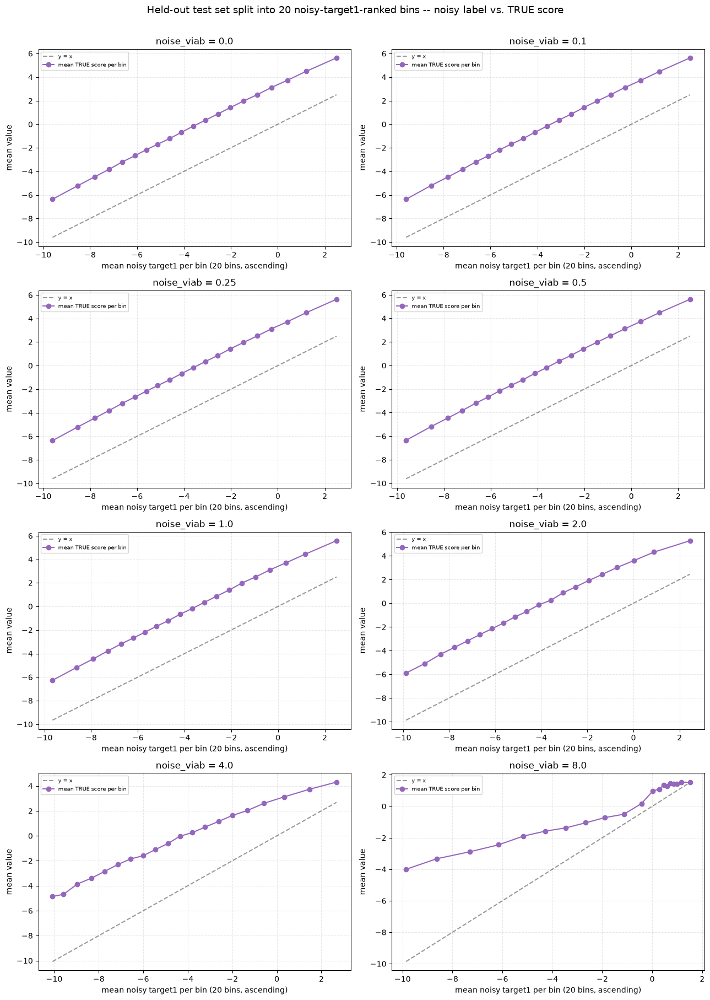

In [17]:
n_bins = 20

fig, axes = plt.subplots(4, 2, figsize=(13, 18))
axes = axes.flatten()
for ax, nv in zip(axes, NOISE_GRID):
    target       = y_noisy_by_noise[nv]
    gt_score_abs = true_score_test

    order      = np.argsort(target)
    bins       = np.array_split(order, n_bins)
    bin_real   = np.array([target[b].mean()       for b in bins])
    bin_score  = np.array([gt_score_abs[b].mean() for b in bins])

    ax.plot(bin_real, bin_real, "k--", alpha=0.4, label="y = x")
    ax.plot(bin_real, bin_score, "o-", color="tab:purple", label="mean TRUE score per bin")
    ax.set_xlabel(f"mean noisy target1 per bin ({n_bins} bins, ascending)")
    ax.set_ylabel("mean value")
    ax.set_title(f"noise_viab = {nv}")
    ax.legend(fontsize=7)
    ax.grid(True, linestyle="--", alpha=0.3)
for ax in axes[len(NOISE_GRID):]:
    ax.axis("off")
fig.suptitle("Held-out test set split into 20 noisy-target1-ranked bins -- noisy label vs. TRUE score",
             y=1.005, fontsize=13)
fig.tight_layout()
plt.show()


## 10. Rank correlation: does the MLP preserve ordering within the extreme tails?

Sections 5-9 look at correlation/calibration against the ordinary test population. This asks a
narrower, more specific question: restricted to the TRUE top-500 (already retrieved in section 8)
and, symmetrically, the TRUE worst-500 -- does the MLP at least get their RELATIVE ordering right,
even if it can't perfectly recover absolute scores? `gt_rank = 1` is the single best (resp. worst)
sequence in that group; `mlp_rank` is where the MLP's own prediction ranks that same sequence
among the same 500-sequence group (not against the wider population).

The worst-500 come from one more exhaustive `20**7` brute-force scan, this time against `-F_viab`/
`-J_viab` (maximizing the negated score == minimizing the real one) -- identical cost to the
top-500 scan in section 8 (a couple of seconds on GPU), and scoring both groups with the
already-trained `models_by_noise` is essentially free.


In [18]:
worst_seqs_viab, _neg_worst_scores = brute_force_top_k(-F_viab, -J_viab, k=K_BEST)
worst_scores_viab = -_neg_worst_scores  # back to the real score scale -- ascending, rank 1 = worst
X_worst_viab = np.eye(NUM_AMINO_ACIDS, dtype=np.float32)[worst_seqs_viab].reshape(K_BEST, -1)

overlap_worst = sum(tuple(row) in pool_set for row in worst_seqs_viab)
print(f"TRUE worst-{K_BEST} GT variants -- overlap with the fixed {N:,}-sequence pool: {overlap_worst}")
assert overlap_worst == 0, "TRUE-worst variants leaked into the training/test pool"
print(f"TRUE global-WORST viability score: {worst_scores_viab[0]:.2f}  "
      f"(TRUE global-BEST: {best_scores_viab[0]:.2f})")


brute-force scan:   0%|          | 0/64 [00:00<?, ?it/s]

brute-force scan:   9%|▉         | 6/64 [00:00<00:01, 51.42it/s]

brute-force scan:  19%|█▉        | 12/64 [00:00<00:01, 47.99it/s]

brute-force scan:  27%|██▋       | 17/64 [00:00<00:01, 46.86it/s]

brute-force scan:  34%|███▍      | 22/64 [00:00<00:00, 46.30it/s]

brute-force scan:  42%|████▏     | 27/64 [00:00<00:00, 46.43it/s]

brute-force scan:  50%|█████     | 32/64 [00:00<00:00, 46.62it/s]

brute-force scan:  58%|█████▊    | 37/64 [00:00<00:00, 45.63it/s]

brute-force scan:  66%|██████▌   | 42/64 [00:00<00:00, 45.90it/s]

brute-force scan:  73%|███████▎  | 47/64 [00:01<00:00, 44.85it/s]

brute-force scan:  81%|████████▏ | 52/64 [00:01<00:00, 45.50it/s]

brute-force scan:  89%|████████▉ | 57/64 [00:01<00:00, 45.31it/s]

brute-force scan:  97%|█████████▋| 62/64 [00:01<00:00, 45.72it/s]

brute-force scan: 100%|██████████| 64/64 [00:01<00:00, 46.08it/s]

TRUE worst-500 GT variants -- overlap with the fixed 50,000-sequence pool: 0
TRUE global-WORST viability score: -15.23  (TRUE global-BEST: 9.88)


In [19]:
pred_worst_by_noise = {
    nv: np.asarray(predict_log_enrichment(models_by_noise[nv], jnp.asarray(X_worst_viab)))
    for nv in NOISE_GRID
}

def mlp_rank(pred, ascending):
    """1-indexed rank of each prediction WITHIN this same group (not vs. the wider population).
    ascending=False -> rank 1 = highest predicted value (used for the top-K_BEST group);
    ascending=True  -> rank 1 = lowest predicted value (used for the worst-K_BEST group)."""
    return pd.Series(pred).rank(ascending=ascending, method="first").to_numpy().astype(int)

gt_rank = np.arange(1, K_BEST + 1)  # both groups already come out of brute_force_top_k pre-sorted

print(f"{'noise_viab':>10}  {'spearman rho (top-' + str(K_BEST) + ')':>24}  "
      f"{'spearman rho (worst-' + str(K_BEST) + ')':>26}")
for nv in NOISE_GRID:
    rho_best  = spearmanr(gt_rank, mlp_rank(pred_best_by_noise[nv],  ascending=False)).statistic
    rho_worst = spearmanr(gt_rank, mlp_rank(pred_worst_by_noise[nv], ascending=True)).statistic
    print(f"{nv:>10}  {rho_best:>24.3f}  {rho_worst:>26.3f}")


noise_viab    spearman rho (top-500)    spearman rho (worst-500)
       0.0                     0.168                       0.338
       0.1                     0.184                       0.357
      0.25                     0.204                       0.337
       0.5                     0.188                       0.326
       1.0                     0.191                       0.227
       2.0                     0.104                       0.211
       4.0                     0.027                       0.061
       8.0                    -0.050                      -0.098


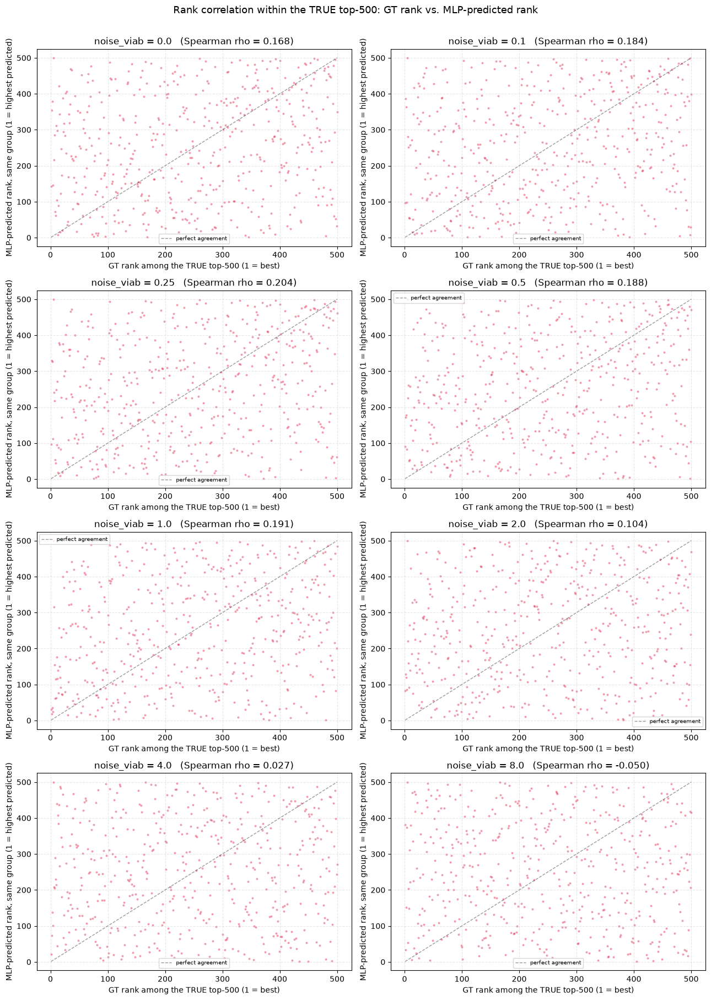

In [20]:
fig, axes = plt.subplots(4, 2, figsize=(13, 18))
axes = axes.flatten()
for ax, nv in zip(axes, NOISE_GRID):
    y_rank = mlp_rank(pred_best_by_noise[nv], ascending=False)
    rho = spearmanr(gt_rank, y_rank).statistic
    ax.scatter(gt_rank, y_rank, s=4, alpha=0.3, color="crimson")
    ax.plot([1, K_BEST], [1, K_BEST], "k--", alpha=0.4, lw=1, label="perfect agreement")
    ax.set_xlabel(f"GT rank among the TRUE top-{K_BEST} (1 = best)")
    ax.set_ylabel("MLP-predicted rank, same group (1 = highest predicted)")
    ax.set_title(f"noise_viab = {nv}   (Spearman rho = {rho:.3f})")
    ax.legend(fontsize=7)
    ax.grid(True, linestyle="--", alpha=0.3)
for ax in axes[len(NOISE_GRID):]:
    ax.axis("off")
fig.suptitle(f"Rank correlation within the TRUE top-{K_BEST}: GT rank vs. MLP-predicted rank",
             y=1.005, fontsize=13)
fig.tight_layout()
plt.show()


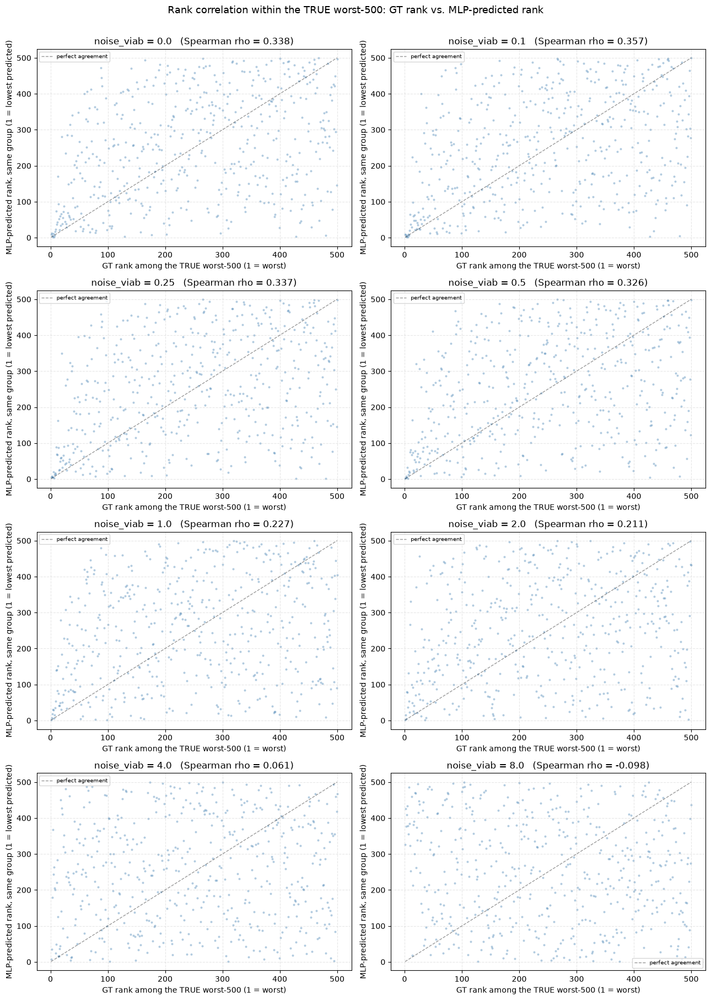

In [21]:
fig, axes = plt.subplots(4, 2, figsize=(13, 18))
axes = axes.flatten()
for ax, nv in zip(axes, NOISE_GRID):
    y_rank = mlp_rank(pred_worst_by_noise[nv], ascending=True)
    rho = spearmanr(gt_rank, y_rank).statistic
    ax.scatter(gt_rank, y_rank, s=4, alpha=0.3, color="steelblue")
    ax.plot([1, K_BEST], [1, K_BEST], "k--", alpha=0.4, lw=1, label="perfect agreement")
    ax.set_xlabel(f"GT rank among the TRUE worst-{K_BEST} (1 = worst)")
    ax.set_ylabel("MLP-predicted rank, same group (1 = lowest predicted)")
    ax.set_title(f"noise_viab = {nv}   (Spearman rho = {rho:.3f})")
    ax.legend(fontsize=7)
    ax.grid(True, linestyle="--", alpha=0.3)
for ax in axes[len(NOISE_GRID):]:
    ax.axis("off")
fig.suptitle(f"Rank correlation within the TRUE worst-{K_BEST}: GT rank vs. MLP-predicted rank",
             y=1.005, fontsize=13)
fig.tight_layout()
plt.show()


## 11. Training on the extremes: does it fix the within-tail ranking?

Section 10 found that the baseline MLP separates the TRUE top-500 (and worst-500) from the bulk of
the population very well (section 8: 100th percentile up to `noise_viab=2.0`), but barely orders
them AMONG THEMSELVES (Spearman rho ~0.15 for the top-500, ~0 for the worst-500) -- it knows "this
group is exceptional" but not "which one in the group is the most exceptional". The natural
question: does training ON these extremes fix that?

Two training variants, both reusing the already brute-forced `best_seqs_viab`/`worst_seqs_viab`
(sections 8/10) and the REALISTIC (NGS-simulated, not noiseless-cheat) injection convention from
`cheated_library_MLP.ipynb` section 5:

- **Model A ("augmented")** -- the SAME fixed 20,000-sequence pool as every other model in this
  notebook, plus the 500 best + 500 worst injected into the training fold only (val/test stay
  exactly as before, so it's directly comparable to the baseline `models_by_noise`).
- **Model B ("designed library")** -- a brand-new 20,000-sequence pool where the 500 best REPLACE
  part of the random pool outright (500 best + 19,500 fresh random, ~2.5% "spiked" composition --
  what a real designed-library experiment would look like), no worst-500 included. Held-out test is
  carved only from its own 19,500 random component (the 500 best always stay in train).

**Scope**: 3 representative noise levels (`0.5`, `2.0`, `8.0` -- low/mid/high, same convention as
section 6) instead of the full 8-level sweep, to keep this tractable. The new "recovery rate" metric
below needs `brute_force_top_k_mlp`: an exhaustive scan of the ENTIRE `20**7` space through each
trained model (not the F/J-only formula) -- ~20x more chunks than section 8's brute force, so
noticeably slower. This section runs 9 such scans (baseline + A + B, x 3 noise levels); running the
whole thing in the background as usual, will report back once it's done.


In [22]:
NOISE_LEVELS_FOCUS = [0.5, 2.0, 4.0]
assert set(NOISE_LEVELS_FOCUS).issubset(set(NOISE_GRID))

K_BEST = 10000  # overrides section 8's K_BEST=500 for this section only -- sections 8-10 above
                # already executed with K_BEST=500 and are unaffected by this; everything below
                # (best/worst-K_BEST sets, gt_rank) is recomputed fresh at the new size.

best_seqs_viab, best_scores_viab = brute_force_top_k(F_viab, J_viab, k=K_BEST)
X_best_viab  = np.eye(NUM_AMINO_ACIDS, dtype=np.float32)[best_seqs_viab].reshape(K_BEST, -1)
overlap_best = sum(tuple(row) in pool_set for row in best_seqs_viab)
assert overlap_best == 0, "TRUE-best variants leaked into the training/test pool"

worst_seqs_viab, _neg_worst_scores = brute_force_top_k(-F_viab, -J_viab, k=K_BEST)
worst_scores_viab = -_neg_worst_scores
X_worst_viab  = np.eye(NUM_AMINO_ACIDS, dtype=np.float32)[worst_seqs_viab].reshape(K_BEST, -1)
overlap_worst = sum(tuple(row) in pool_set for row in worst_seqs_viab)
assert overlap_worst == 0, "TRUE-worst variants leaked into the training/test pool"

gt_rank = np.arange(1, K_BEST + 1)  # re-derive at the new size -- section 10's gt_rank was (500,)

extreme_seqs = np.concatenate([best_seqs_viab, worst_seqs_viab], axis=0)
print(f"extreme_seqs: {extreme_seqs.shape}  ({K_BEST} TRUE-best + {K_BEST} TRUE-worst)")


brute-force scan:   0%|          | 0/64 [00:00<?, ?it/s]

brute-force scan:   2%|▏         | 1/64 [00:00<00:17,  3.52it/s]

brute-force scan:  11%|█         | 7/64 [00:00<00:02, 21.03it/s]

brute-force scan:  19%|█▉        | 12/64 [00:00<00:01, 28.96it/s]

brute-force scan:  27%|██▋       | 17/64 [00:00<00:01, 34.02it/s]

brute-force scan:  34%|███▍      | 22/64 [00:00<00:01, 37.65it/s]

brute-force scan:  42%|████▏     | 27/64 [00:00<00:00, 39.94it/s]

brute-force scan:  50%|█████     | 32/64 [00:00<00:00, 41.41it/s]

brute-force scan:  58%|█████▊    | 37/64 [00:01<00:00, 42.59it/s]

brute-force scan:  66%|██████▌   | 42/64 [00:01<00:00, 43.93it/s]

brute-force scan:  73%|███████▎  | 47/64 [00:01<00:00, 44.77it/s]

brute-force scan:  81%|████████▏ | 52/64 [00:01<00:00, 44.67it/s]

brute-force scan:  89%|████████▉ | 57/64 [00:01<00:00, 44.96it/s]

brute-force scan:  97%|█████████▋| 62/64 [00:01<00:00, 45.03it/s]

brute-force scan: 100%|██████████| 64/64 [00:01<00:00, 38.56it/s]

brute-force scan:   0%|          | 0/64 [00:00<?, ?it/s]

brute-force scan:   9%|▉         | 6/64 [00:00<00:01, 52.77it/s]

brute-force scan:  19%|█▉        | 12/64 [00:00<00:01, 48.07it/s]

brute-force scan:  27%|██▋       | 17/64 [00:00<00:00, 47.21it/s]

brute-force scan:  34%|███▍      | 22/64 [00:00<00:00, 47.24it/s]

brute-force scan:  42%|████▏     | 27/64 [00:00<00:00, 46.17it/s]

brute-force scan:  50%|█████     | 32/64 [00:00<00:00, 46.28it/s]

brute-force scan:  58%|█████▊    | 37/64 [00:00<00:00, 45.89it/s]

brute-force scan:  66%|██████▌   | 42/64 [00:00<00:00, 45.51it/s]

brute-force scan:  73%|███████▎  | 47/64 [00:01<00:00, 45.48it/s]

brute-force scan:  81%|████████▏ | 52/64 [00:01<00:00, 45.10it/s]

brute-force scan:  89%|████████▉ | 57/64 [00:01<00:00, 45.53it/s]

brute-force scan:  97%|█████████▋| 62/64 [00:01<00:00, 45.64it/s]

brute-force scan: 100%|██████████| 64/64 [00:01<00:00, 46.17it/s]

extreme_seqs: (20000, 7)  (10000 TRUE-best + 10000 TRUE-worst)


In [23]:
# Section 8's `pred_best_by_noise` was computed against the OLD K_BEST=500 `X_best_viab` --
# stale now that section 11 redefines X_best_viab at K_BEST=10000. Recompute the baseline
# model's predictions on the NEW X_best_viab, scoped to this section only (kept as a separate
# dict so section 8/10's own results above are left untouched).
pred_best_baseline = {
    nv: np.asarray(predict_log_enrichment(models_by_noise[nv], jnp.asarray(X_best_viab)))
    for nv in NOISE_LEVELS_FOCUS
}


In [24]:
def realistic_labels_for_extremes(nv):
    """Runs the fixed 20,000-sequence pool + the 500 best + 500 worst TOGETHER through a fresh
    ProtocolV3 simulation at this noise_viab, so the injected extremes get a REALISTIC NGS-measured
    log enrichment -- identical recipe to cheated_library_MLP.ipynb section 5. Returns realistic
    labels for JUST the 1000 injected sequences (500 best first, then 500 worst)."""
    seq_aug = jnp.concatenate([sequences, jnp.asarray(extreme_seqs)], axis=0)
    protocol_aug = ProtocolV3(N0=1_000_000_000, N1=500_000_000,
            dilution_factor=10, sequences=seq_aug, D=1e9,
            F_viab=F_viab, J_viab=J_viab, F_sel=F_viab, J_sel=J_viab,
            noise_viab=nv, noise_sel=0.5, T_sel=1, T_viab=1,
            )
    _bio_row, ngs_row = protocol_aug.N_loop_DE(1)[0]
    lambda0p, lambda2p, _lambda3p = (np.asarray(x) for x in ngs_row)
    eps = 1.0
    log_enr_viab_aug = np.log((lambda2p + eps) / (lambda0p + eps))
    n_random = sequences.shape[0]
    return log_enr_viab_aug[n_random:]  # (1000,) -- 500 best labels, then 500 worst labels


In [25]:
key_designed = jax.random.key(123)
n_random_designed = N - K_BEST
sequences_designed_random = jax.random.randint(key_designed, shape=(n_random_designed, NUM_POSITIONS),
                                                minval=0, maxval=NUM_AMINO_ACIDS)
sequences_designed = jnp.concatenate([jnp.asarray(best_seqs_viab), sequences_designed_random], axis=0)

rand_positions = np.arange(K_BEST, N)  # rows K_BEST..N-1 are the "rest randoms"
idx_train_rand, idx_test_designed = train_test_split(rand_positions, test_size=0.5, random_state=0)
idx_train_designed_full = np.concatenate([np.arange(K_BEST), idx_train_rand])  # 500 best always train

X_designed_all         = np.eye(NUM_AMINO_ACIDS, dtype=np.float32)[np.asarray(sequences_designed)].reshape(N, -1)
X_train_designed_full  = X_designed_all[idx_train_designed_full]
X_test_designed         = X_designed_all[idx_test_designed]

print(f"designed library: {K_BEST} TRUE-best + {n_random_designed:,} fresh random = {N:,} total")
print(f"train (incl. the {K_BEST} best): {len(idx_train_designed_full):,}   "
      f"test (random only): {len(idx_test_designed):,}")


designed library: 10000 TRUE-best + 40,000 fresh random = 50,000 total
train (incl. the 10000 best): 30,000   test (random only): 20,000


In [26]:
@jax.jit
def _onehot_chunk(idx, L=NUM_POSITIONS, A=NUM_AMINO_ACIDS):
    tmp = idx
    digits = []
    for _ in range(L):
        digits.append(tmp % A)
        tmp = tmp // A
    seq = jnp.stack(digits[::-1], axis=1).astype(jnp.int32)
    seq_oh = jnp.eye(A, dtype=jnp.float32)[seq].reshape(seq.shape[0], -1)
    return seq, seq_oh


def brute_force_top_k_mlp(model, k=50, chunk_size=1_000_000, L=NUM_POSITIONS, A=NUM_AMINO_ACIDS):
    """Same exhaustive 20**7 scan as brute_force_top_k, but scores every sequence with the TRAINED
    ProfileMLP instead of the ground-truth F/J -- finds the model's own favorite sequences across
    the ENTIRE space, not just a random sample. Identical recipe to
    MLP_for_anticorrelated_weights.ipynb."""
    total = A ** L
    best_scores = jnp.full((k,), -jnp.inf)
    best_seqs   = jnp.zeros((k, L), dtype=jnp.int32)

    for start in tqdm(range(0, total, chunk_size), desc="MLP brute-force scan"):
        end = min(start + chunk_size, total)
        idx = jnp.arange(start, end)
        seq_chunk, seq_oh_chunk = _onehot_chunk(idx)
        scores_chunk = predict_log_enrichment(model, seq_oh_chunk)

        kk = min(k, scores_chunk.shape[0])
        local_vals, local_idx = jax.lax.top_k(scores_chunk, kk)
        local_seqs = seq_chunk[local_idx]

        cand_scores = jnp.concatenate([best_scores, local_vals])
        cand_seqs   = jnp.concatenate([best_seqs, local_seqs], axis=0)
        best_scores, merge_idx = jax.lax.top_k(cand_scores, k)
        best_seqs = cand_seqs[merge_idx]

    return np.asarray(best_seqs), np.asarray(best_scores)


def recovery_rate(model):
    """Fraction of the model's OWN top-K_BEST (found by exhaustively scanning the model over the
    entire 20**7 space) that coincide with the TRUE top-K_BEST (best_seqs_viab, from the GT)."""
    mlp_top_seqs, _ = brute_force_top_k_mlp(model, k=K_BEST)
    gt_set  = {tuple(row) for row in best_seqs_viab}
    overlap = sum(tuple(row) in gt_set for row in mlp_top_seqs)
    return overlap / K_BEST


In [27]:
models_A_by_noise, preds_A_by_noise, pred_best_A_by_noise = {}, {}, {}
models_B_by_noise, preds_B_by_noise, pred_best_B_by_noise = {}, {}, {}
recovery = []

for nv in NOISE_LEVELS_FOCUS:
    print(f"\n=== noise_viab = {nv} ===")

    # --- reload this noise level's already-cached random-pool labels (built + saved in section 4) ---
    protocol_nv = ProtocolV3(N0=1_000_000_000, N1=500_000_000,
            dilution_factor=10, sequences=sequences, D=1e9,
            F_viab=F_viab, J_viab=J_viab, F_sel=F_viab, J_sel=J_viab,
            noise_viab=nv, noise_sel=0.5, T_sel=1, T_viab=1,
            )
    csv_path = dataset_filename(protocol_nv, "viabdenoise")
    assert os.path.exists(csv_path), f"expected section 4 to have already cached {csv_path}"
    dataset_nv = pd.read_csv(csv_path)
    y_all_nv   = dataset_nv["target1"].to_numpy()
    y_train_nv, y_test_nv = y_all_nv[idx_train], y_all_nv[idx_test]
    assert np.allclose(y_test_nv, y_noisy_by_noise[nv]), "cached test labels don't match section 4"

    # --- Model A: augmented -- original train fold + 1000 injected extremes, realistic labels ---
    y_extremes = realistic_labels_for_extremes(nv)
    Xtr_nv, ytr_nv, Xva_nv, yva_nv = split_train_val(X_train_full, y_train_nv, val_frac=0.15, seed=0)
    Xtr_A = np.concatenate([Xtr_nv, X_best_viab, X_worst_viab], axis=0)
    ytr_A = np.concatenate([ytr_nv, y_extremes], axis=0)
    model_A, _ = train_profile_mlp(Xtr_A, ytr_A, Xva_nv, yva_nv, seed=0, verbose=False)

    models_A_by_noise[nv]     = model_A
    preds_A_by_noise[nv]      = np.asarray(predict_log_enrichment(model_A, jnp.asarray(X_test)))
    pred_best_A_by_noise[nv]  = np.asarray(predict_log_enrichment(model_A, jnp.asarray(X_best_viab)))

    # --- Model B: designed library -- 500 best + 19,500 fresh random, single simulation ---
    protocol_designed = ProtocolV3(N0=1_000_000_000, N1=500_000_000,
            dilution_factor=10, sequences=sequences_designed, D=1e9,
            F_viab=F_viab, J_viab=J_viab, F_sel=F_viab, J_sel=J_viab,
            noise_viab=nv, noise_sel=0.5, T_sel=1, T_viab=1,
            )
    _bio_row, ngs_row = protocol_designed.N_loop_DE(1)[0]
    lambda0p_d, lambda2p_d, _lambda3p_d = (np.asarray(x) for x in ngs_row)
    eps = 1.0
    y_all_designed         = np.log((lambda2p_d + eps) / (lambda0p_d + eps))
    y_train_designed_full  = y_all_designed[idx_train_designed_full]
    y_test_designed         = y_all_designed[idx_test_designed]

    Xtr_B, ytr_B, Xva_B, yva_B = split_train_val(X_train_designed_full, y_train_designed_full,
                                                  val_frac=0.15, seed=0)
    model_B, _ = train_profile_mlp(Xtr_B, ytr_B, Xva_B, yva_B, seed=0, verbose=False)

    models_B_by_noise[nv]    = model_B
    preds_B_by_noise[nv]     = np.asarray(predict_log_enrichment(model_B, jnp.asarray(X_test_designed)))
    pred_best_B_by_noise[nv] = np.asarray(predict_log_enrichment(model_B, jnp.asarray(X_best_viab)))

    # --- recovery rate: how many of each model's OWN top-500 (exhaustive scan) are the TRUE top-500 ---
    rec_baseline = recovery_rate(models_by_noise[nv])
    rec_A        = recovery_rate(model_A)
    rec_B        = recovery_rate(model_B)
    print(f"  recovery rate (baseline / augmented A / designed B): "
          f"{rec_baseline:.1%} / {rec_A:.1%} / {rec_B:.1%}")
    recovery.append(dict(noise_viab=nv, baseline=rec_baseline, augmented_A=rec_A, designed_B=rec_B))

recovery_df = pd.DataFrame(recovery)
recovery_df



=== noise_viab = 0.5 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   2%|▎         | 1/40 [00:00<00:27,  1.44it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:05<00:00,  5.12s/it]

Directed evolution rounds: 100%|██████████| 1/1 [00:05<00:00,  5.12s/it]

Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  95%|█████████▌| 38/40 [00:00<00:00, 372.29it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  98%|█████████▊| 39/40 [00:00<00:00, 385.16it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   0%|          | 1/1280 [00:03<1:17:05,  3.62s/it]

MLP brute-force scan:   0%|          | 6/1280 [00:03<09:50,  2.16it/s]  

MLP brute-force scan:   1%|          | 12/1280 [00:03<04:09,  5.09it/s]

MLP brute-force scan:   1%|▏         | 18/1280 [00:03<02:24,  8.75it/s]

MLP brute-force scan:   2%|▏         | 24/1280 [00:04<01:35, 13.09it/s]

MLP brute-force scan:   2%|▏         | 30/1280 [00:04<01:09, 17.93it/s]

MLP brute-force scan:   3%|▎         | 36/1280 [00:04<00:53, 23.33it/s]

MLP brute-force scan:   3%|▎         | 42/1280 [00:04<00:43, 28.47it/s]

MLP brute-force scan:   4%|▍         | 48/1280 [00:04<00:36, 33.45it/s]

MLP brute-force scan:   4%|▍         | 54/1280 [00:04<00:32, 37.57it/s]

MLP brute-force scan:   5%|▍         | 60/1280 [00:04<00:29, 41.43it/s]

MLP brute-force scan:   5%|▌         | 66/1280 [00:04<00:27, 44.07it/s]

MLP brute-force scan:   6%|▌         | 72/1280 [00:04<00:25, 47.02it/s]

MLP brute-force scan:   6%|▌         | 78/1280 [00:05<00:24, 48.87it/s]

MLP brute-force scan:   7%|▋         | 84/1280 [00:05<00:23, 50.31it/s]

MLP brute-force scan:   7%|▋         | 90/1280 [00:05<00:23, 51.65it/s]

MLP brute-force scan:   8%|▊         | 96/1280 [00:05<00:23, 51.40it/s]

MLP brute-force scan:   8%|▊         | 102/1280 [00:05<00:22, 52.23it/s]

MLP brute-force scan:   8%|▊         | 108/1280 [00:05<00:22, 51.46it/s]

MLP brute-force scan:   9%|▉         | 114/1280 [00:05<00:22, 52.63it/s]

MLP brute-force scan:   9%|▉         | 120/1280 [00:05<00:21, 52.83it/s]

MLP brute-force scan:  10%|▉         | 126/1280 [00:05<00:21, 52.86it/s]

MLP brute-force scan:  10%|█         | 132/1280 [00:06<00:21, 53.03it/s]

MLP brute-force scan:  11%|█         | 138/1280 [00:06<00:21, 53.60it/s]

MLP brute-force scan:  11%|█▏        | 144/1280 [00:06<00:21, 53.52it/s]

MLP brute-force scan:  12%|█▏        | 150/1280 [00:06<00:21, 53.11it/s]

MLP brute-force scan:  12%|█▏        | 156/1280 [00:06<00:21, 53.22it/s]

MLP brute-force scan:  13%|█▎        | 162/1280 [00:06<00:21, 52.64it/s]

MLP brute-force scan:  13%|█▎        | 168/1280 [00:06<00:21, 52.91it/s]

MLP brute-force scan:  14%|█▎        | 174/1280 [00:06<00:20, 53.05it/s]

MLP brute-force scan:  14%|█▍        | 180/1280 [00:06<00:20, 53.12it/s]

MLP brute-force scan:  15%|█▍        | 186/1280 [00:07<00:20, 53.47it/s]

MLP brute-force scan:  15%|█▌        | 192/1280 [00:07<00:20, 53.80it/s]

MLP brute-force scan:  15%|█▌        | 198/1280 [00:07<00:20, 53.51it/s]

MLP brute-force scan:  16%|█▌        | 204/1280 [00:07<00:20, 52.72it/s]

MLP brute-force scan:  16%|█▋        | 210/1280 [00:07<00:20, 52.82it/s]

MLP brute-force scan:  17%|█▋        | 216/1280 [00:07<00:20, 52.60it/s]

MLP brute-force scan:  17%|█▋        | 222/1280 [00:07<00:20, 52.36it/s]

MLP brute-force scan:  18%|█▊        | 228/1280 [00:07<00:19, 52.62it/s]

MLP brute-force scan:  18%|█▊        | 234/1280 [00:08<00:19, 53.28it/s]

MLP brute-force scan:  19%|█▉        | 240/1280 [00:08<00:19, 52.79it/s]

MLP brute-force scan:  19%|█▉        | 246/1280 [00:08<00:19, 53.14it/s]

MLP brute-force scan:  20%|█▉        | 252/1280 [00:08<00:19, 53.14it/s]

MLP brute-force scan:  20%|██        | 258/1280 [00:08<00:19, 52.86it/s]

MLP brute-force scan:  21%|██        | 264/1280 [00:08<00:19, 52.51it/s]

MLP brute-force scan:  21%|██        | 270/1280 [00:08<00:19, 52.39it/s]

MLP brute-force scan:  22%|██▏       | 276/1280 [00:08<00:19, 52.47it/s]

MLP brute-force scan:  22%|██▏       | 282/1280 [00:08<00:18, 52.92it/s]

MLP brute-force scan:  22%|██▎       | 288/1280 [00:09<00:18, 53.40it/s]

MLP brute-force scan:  23%|██▎       | 294/1280 [00:09<00:18, 53.60it/s]

MLP brute-force scan:  23%|██▎       | 300/1280 [00:09<00:18, 53.50it/s]

MLP brute-force scan:  24%|██▍       | 306/1280 [00:09<00:18, 52.89it/s]

MLP brute-force scan:  24%|██▍       | 312/1280 [00:09<00:18, 52.77it/s]

MLP brute-force scan:  25%|██▍       | 318/1280 [00:09<00:18, 52.60it/s]

MLP brute-force scan:  25%|██▌       | 324/1280 [00:09<00:18, 52.89it/s]

MLP brute-force scan:  26%|██▌       | 330/1280 [00:09<00:17, 53.03it/s]

MLP brute-force scan:  26%|██▋       | 336/1280 [00:09<00:17, 53.16it/s]

MLP brute-force scan:  27%|██▋       | 342/1280 [00:10<00:17, 53.33it/s]

MLP brute-force scan:  27%|██▋       | 348/1280 [00:10<00:17, 52.93it/s]

MLP brute-force scan:  28%|██▊       | 354/1280 [00:10<00:17, 53.10it/s]

MLP brute-force scan:  28%|██▊       | 360/1280 [00:10<00:17, 52.80it/s]

MLP brute-force scan:  29%|██▊       | 366/1280 [00:10<00:17, 52.79it/s]

MLP brute-force scan:  29%|██▉       | 372/1280 [00:10<00:17, 52.62it/s]

MLP brute-force scan:  30%|██▉       | 378/1280 [00:10<00:17, 52.58it/s]

MLP brute-force scan:  30%|███       | 384/1280 [00:10<00:16, 52.97it/s]

MLP brute-force scan:  30%|███       | 390/1280 [00:10<00:16, 53.50it/s]

MLP brute-force scan:  31%|███       | 396/1280 [00:11<00:16, 53.26it/s]

MLP brute-force scan:  31%|███▏      | 402/1280 [00:11<00:16, 53.79it/s]

MLP brute-force scan:  32%|███▏      | 408/1280 [00:11<00:16, 53.48it/s]

MLP brute-force scan:  32%|███▏      | 414/1280 [00:11<00:16, 52.93it/s]

MLP brute-force scan:  33%|███▎      | 420/1280 [00:11<00:16, 53.17it/s]

MLP brute-force scan:  33%|███▎      | 426/1280 [00:11<00:16, 52.45it/s]

MLP brute-force scan:  34%|███▍      | 432/1280 [00:11<00:16, 52.92it/s]

MLP brute-force scan:  34%|███▍      | 438/1280 [00:11<00:15, 52.71it/s]

MLP brute-force scan:  35%|███▍      | 444/1280 [00:11<00:15, 52.74it/s]

MLP brute-force scan:  35%|███▌      | 450/1280 [00:12<00:15, 53.57it/s]

MLP brute-force scan:  36%|███▌      | 456/1280 [00:12<00:15, 53.53it/s]

MLP brute-force scan:  36%|███▌      | 462/1280 [00:12<00:15, 53.56it/s]

MLP brute-force scan:  37%|███▋      | 468/1280 [00:12<00:15, 53.32it/s]

MLP brute-force scan:  37%|███▋      | 474/1280 [00:12<00:15, 53.46it/s]

MLP brute-force scan:  38%|███▊      | 480/1280 [00:12<00:15, 52.27it/s]

MLP brute-force scan:  38%|███▊      | 486/1280 [00:12<00:15, 52.66it/s]

MLP brute-force scan:  38%|███▊      | 492/1280 [00:12<00:14, 52.99it/s]

MLP brute-force scan:  39%|███▉      | 498/1280 [00:12<00:14, 53.88it/s]

MLP brute-force scan:  39%|███▉      | 504/1280 [00:13<00:14, 53.61it/s]

MLP brute-force scan:  40%|███▉      | 510/1280 [00:13<00:14, 53.80it/s]

MLP brute-force scan:  40%|████      | 516/1280 [00:13<00:14, 53.88it/s]

MLP brute-force scan:  41%|████      | 522/1280 [00:13<00:14, 52.81it/s]

MLP brute-force scan:  41%|████▏     | 528/1280 [00:13<00:14, 53.31it/s]

MLP brute-force scan:  42%|████▏     | 534/1280 [00:13<00:14, 52.39it/s]

MLP brute-force scan:  42%|████▏     | 540/1280 [00:13<00:13, 53.03it/s]

MLP brute-force scan:  43%|████▎     | 546/1280 [00:13<00:13, 53.01it/s]

MLP brute-force scan:  43%|████▎     | 552/1280 [00:14<00:13, 53.21it/s]

MLP brute-force scan:  44%|████▎     | 558/1280 [00:14<00:13, 53.43it/s]

MLP brute-force scan:  44%|████▍     | 564/1280 [00:14<00:13, 54.12it/s]

MLP brute-force scan:  45%|████▍     | 570/1280 [00:14<00:13, 53.85it/s]

MLP brute-force scan:  45%|████▌     | 576/1280 [00:14<00:13, 53.14it/s]

MLP brute-force scan:  45%|████▌     | 582/1280 [00:14<00:13, 53.26it/s]

MLP brute-force scan:  46%|████▌     | 588/1280 [00:14<00:13, 52.68it/s]

MLP brute-force scan:  46%|████▋     | 594/1280 [00:14<00:12, 52.98it/s]

MLP brute-force scan:  47%|████▋     | 600/1280 [00:14<00:12, 53.40it/s]

MLP brute-force scan:  47%|████▋     | 606/1280 [00:15<00:12, 53.46it/s]

MLP brute-force scan:  48%|████▊     | 612/1280 [00:15<00:12, 53.34it/s]

MLP brute-force scan:  48%|████▊     | 618/1280 [00:15<00:12, 53.18it/s]

MLP brute-force scan:  49%|████▉     | 624/1280 [00:15<00:12, 53.62it/s]

MLP brute-force scan:  49%|████▉     | 630/1280 [00:15<00:12, 53.19it/s]

MLP brute-force scan:  50%|████▉     | 636/1280 [00:15<00:12, 52.91it/s]

MLP brute-force scan:  50%|█████     | 642/1280 [00:15<00:12, 52.75it/s]

MLP brute-force scan:  51%|█████     | 648/1280 [00:15<00:11, 52.91it/s]

MLP brute-force scan:  51%|█████     | 654/1280 [00:15<00:11, 52.90it/s]

MLP brute-force scan:  52%|█████▏    | 660/1280 [00:16<00:11, 52.84it/s]

MLP brute-force scan:  52%|█████▏    | 666/1280 [00:16<00:11, 53.08it/s]

MLP brute-force scan:  52%|█████▎    | 672/1280 [00:16<00:11, 53.90it/s]

MLP brute-force scan:  53%|█████▎    | 678/1280 [00:16<00:11, 52.80it/s]

MLP brute-force scan:  53%|█████▎    | 684/1280 [00:16<00:11, 53.05it/s]

MLP brute-force scan:  54%|█████▍    | 690/1280 [00:16<00:11, 52.14it/s]

MLP brute-force scan:  54%|█████▍    | 696/1280 [00:16<00:11, 52.78it/s]

MLP brute-force scan:  55%|█████▍    | 702/1280 [00:16<00:10, 52.88it/s]

MLP brute-force scan:  55%|█████▌    | 708/1280 [00:16<00:10, 52.77it/s]

MLP brute-force scan:  56%|█████▌    | 714/1280 [00:17<00:10, 53.46it/s]

MLP brute-force scan:  56%|█████▋    | 720/1280 [00:17<00:10, 53.52it/s]

MLP brute-force scan:  57%|█████▋    | 726/1280 [00:17<00:10, 53.37it/s]

MLP brute-force scan:  57%|█████▋    | 732/1280 [00:17<00:10, 52.96it/s]

MLP brute-force scan:  58%|█████▊    | 738/1280 [00:17<00:10, 53.17it/s]

MLP brute-force scan:  58%|█████▊    | 744/1280 [00:17<00:10, 52.78it/s]

MLP brute-force scan:  59%|█████▊    | 750/1280 [00:17<00:10, 52.56it/s]

MLP brute-force scan:  59%|█████▉    | 756/1280 [00:17<00:09, 52.63it/s]

MLP brute-force scan:  60%|█████▉    | 762/1280 [00:17<00:09, 53.07it/s]

MLP brute-force scan:  60%|██████    | 768/1280 [00:18<00:09, 52.79it/s]

MLP brute-force scan:  60%|██████    | 774/1280 [00:18<00:09, 53.32it/s]

MLP brute-force scan:  61%|██████    | 780/1280 [00:18<00:09, 53.86it/s]

MLP brute-force scan:  61%|██████▏   | 786/1280 [00:18<00:09, 52.61it/s]

MLP brute-force scan:  62%|██████▏   | 792/1280 [00:18<00:09, 53.44it/s]

MLP brute-force scan:  62%|██████▏   | 798/1280 [00:18<00:09, 51.99it/s]

MLP brute-force scan:  63%|██████▎   | 804/1280 [00:18<00:09, 52.83it/s]

MLP brute-force scan:  63%|██████▎   | 810/1280 [00:18<00:08, 53.28it/s]

MLP brute-force scan:  64%|██████▍   | 816/1280 [00:18<00:08, 52.79it/s]

MLP brute-force scan:  64%|██████▍   | 822/1280 [00:19<00:08, 53.13it/s]

MLP brute-force scan:  65%|██████▍   | 828/1280 [00:19<00:08, 53.56it/s]

MLP brute-force scan:  65%|██████▌   | 834/1280 [00:19<00:08, 53.71it/s]

MLP brute-force scan:  66%|██████▌   | 840/1280 [00:19<00:08, 52.89it/s]

MLP brute-force scan:  66%|██████▌   | 846/1280 [00:19<00:08, 53.20it/s]

MLP brute-force scan:  67%|██████▋   | 852/1280 [00:19<00:08, 52.73it/s]

MLP brute-force scan:  67%|██████▋   | 858/1280 [00:19<00:07, 53.18it/s]

MLP brute-force scan:  68%|██████▊   | 864/1280 [00:19<00:07, 53.32it/s]

MLP brute-force scan:  68%|██████▊   | 870/1280 [00:19<00:07, 53.22it/s]

MLP brute-force scan:  68%|██████▊   | 876/1280 [00:20<00:07, 53.70it/s]

MLP brute-force scan:  69%|██████▉   | 882/1280 [00:20<00:07, 53.09it/s]

MLP brute-force scan:  69%|██████▉   | 888/1280 [00:20<00:07, 53.89it/s]

MLP brute-force scan:  70%|██████▉   | 894/1280 [00:20<00:07, 53.08it/s]

MLP brute-force scan:  70%|███████   | 900/1280 [00:20<00:07, 53.39it/s]

MLP brute-force scan:  71%|███████   | 906/1280 [00:20<00:07, 52.60it/s]

MLP brute-force scan:  71%|███████▏  | 912/1280 [00:20<00:06, 53.01it/s]

MLP brute-force scan:  72%|███████▏  | 918/1280 [00:20<00:06, 53.44it/s]

MLP brute-force scan:  72%|███████▏  | 924/1280 [00:21<00:06, 53.71it/s]

MLP brute-force scan:  73%|███████▎  | 930/1280 [00:21<00:06, 53.21it/s]

MLP brute-force scan:  73%|███████▎  | 936/1280 [00:21<00:06, 53.70it/s]

MLP brute-force scan:  74%|███████▎  | 942/1280 [00:21<00:06, 53.90it/s]

MLP brute-force scan:  74%|███████▍  | 948/1280 [00:21<00:06, 52.62it/s]

MLP brute-force scan:  75%|███████▍  | 954/1280 [00:21<00:06, 53.20it/s]

MLP brute-force scan:  75%|███████▌  | 960/1280 [00:21<00:06, 52.59it/s]

MLP brute-force scan:  75%|███████▌  | 966/1280 [00:21<00:05, 53.31it/s]

MLP brute-force scan:  76%|███████▌  | 972/1280 [00:21<00:05, 52.85it/s]

MLP brute-force scan:  76%|███████▋  | 978/1280 [00:22<00:05, 53.81it/s]

MLP brute-force scan:  77%|███████▋  | 984/1280 [00:22<00:05, 53.67it/s]

MLP brute-force scan:  77%|███████▋  | 990/1280 [00:22<00:05, 52.99it/s]

MLP brute-force scan:  78%|███████▊  | 996/1280 [00:22<00:05, 53.23it/s]

MLP brute-force scan:  78%|███████▊  | 1002/1280 [00:22<00:05, 52.92it/s]

MLP brute-force scan:  79%|███████▉  | 1008/1280 [00:22<00:05, 52.86it/s]

MLP brute-force scan:  79%|███████▉  | 1014/1280 [00:22<00:05, 52.59it/s]

MLP brute-force scan:  80%|███████▉  | 1020/1280 [00:22<00:04, 53.04it/s]

MLP brute-force scan:  80%|████████  | 1026/1280 [00:22<00:04, 52.66it/s]

MLP brute-force scan:  81%|████████  | 1032/1280 [00:23<00:04, 52.92it/s]

MLP brute-force scan:  81%|████████  | 1038/1280 [00:23<00:04, 53.46it/s]

MLP brute-force scan:  82%|████████▏ | 1044/1280 [00:23<00:04, 52.91it/s]

MLP brute-force scan:  82%|████████▏ | 1050/1280 [00:23<00:04, 53.14it/s]

MLP brute-force scan:  82%|████████▎ | 1056/1280 [00:23<00:04, 52.83it/s]

MLP brute-force scan:  83%|████████▎ | 1062/1280 [00:23<00:04, 52.54it/s]

MLP brute-force scan:  83%|████████▎ | 1068/1280 [00:23<00:04, 52.64it/s]

MLP brute-force scan:  84%|████████▍ | 1074/1280 [00:23<00:03, 52.37it/s]

MLP brute-force scan:  84%|████████▍ | 1080/1280 [00:23<00:03, 53.09it/s]

MLP brute-force scan:  85%|████████▍ | 1086/1280 [00:24<00:03, 53.36it/s]

MLP brute-force scan:  85%|████████▌ | 1092/1280 [00:24<00:03, 53.65it/s]

MLP brute-force scan:  86%|████████▌ | 1098/1280 [00:24<00:03, 53.05it/s]

MLP brute-force scan:  86%|████████▋ | 1104/1280 [00:24<00:03, 53.15it/s]

MLP brute-force scan:  87%|████████▋ | 1110/1280 [00:24<00:03, 52.81it/s]

MLP brute-force scan:  87%|████████▋ | 1116/1280 [00:24<00:03, 52.93it/s]

MLP brute-force scan:  88%|████████▊ | 1122/1280 [00:24<00:02, 52.77it/s]

MLP brute-force scan:  88%|████████▊ | 1128/1280 [00:24<00:02, 52.53it/s]

MLP brute-force scan:  89%|████████▊ | 1134/1280 [00:24<00:02, 53.85it/s]

MLP brute-force scan:  89%|████████▉ | 1140/1280 [00:25<00:02, 53.73it/s]

MLP brute-force scan:  90%|████████▉ | 1146/1280 [00:25<00:02, 53.37it/s]

MLP brute-force scan:  90%|█████████ | 1152/1280 [00:25<00:02, 53.95it/s]

MLP brute-force scan:  90%|█████████ | 1158/1280 [00:25<00:02, 52.36it/s]

MLP brute-force scan:  91%|█████████ | 1164/1280 [00:25<00:02, 53.13it/s]

MLP brute-force scan:  91%|█████████▏| 1170/1280 [00:25<00:02, 52.80it/s]

MLP brute-force scan:  92%|█████████▏| 1176/1280 [00:25<00:01, 53.24it/s]

MLP brute-force scan:  92%|█████████▏| 1182/1280 [00:25<00:01, 52.72it/s]

MLP brute-force scan:  93%|█████████▎| 1188/1280 [00:25<00:01, 53.55it/s]

MLP brute-force scan:  93%|█████████▎| 1194/1280 [00:26<00:01, 53.07it/s]

MLP brute-force scan:  94%|█████████▍| 1200/1280 [00:26<00:01, 53.74it/s]

MLP brute-force scan:  94%|█████████▍| 1206/1280 [00:26<00:01, 53.77it/s]

MLP brute-force scan:  95%|█████████▍| 1212/1280 [00:26<00:01, 52.22it/s]

MLP brute-force scan:  95%|█████████▌| 1218/1280 [00:26<00:01, 53.29it/s]

MLP brute-force scan:  96%|█████████▌| 1224/1280 [00:26<00:01, 52.85it/s]

MLP brute-force scan:  96%|█████████▌| 1230/1280 [00:26<00:00, 52.36it/s]

MLP brute-force scan:  97%|█████████▋| 1236/1280 [00:26<00:00, 53.42it/s]

MLP brute-force scan:  97%|█████████▋| 1242/1280 [00:26<00:00, 53.85it/s]

MLP brute-force scan:  98%|█████████▊| 1248/1280 [00:27<00:00, 53.71it/s]

MLP brute-force scan:  98%|█████████▊| 1254/1280 [00:27<00:00, 53.45it/s]

MLP brute-force scan:  98%|█████████▊| 1260/1280 [00:27<00:00, 53.95it/s]

MLP brute-force scan:  99%|█████████▉| 1266/1280 [00:27<00:00, 52.74it/s]

MLP brute-force scan:  99%|█████████▉| 1272/1280 [00:27<00:00, 53.08it/s]

MLP brute-force scan: 100%|█████████▉| 1278/1280 [00:27<00:00, 52.49it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:27<00:00, 46.18it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   0%|          | 6/1280 [00:00<00:21, 59.67it/s]

MLP brute-force scan:   1%|          | 12/1280 [00:00<00:22, 55.68it/s]

MLP brute-force scan:   1%|▏         | 18/1280 [00:00<00:22, 55.16it/s]

MLP brute-force scan:   2%|▏         | 24/1280 [00:00<00:23, 54.09it/s]

MLP brute-force scan:   2%|▏         | 30/1280 [00:00<00:23, 53.70it/s]

MLP brute-force scan:   3%|▎         | 36/1280 [00:00<00:23, 53.14it/s]

MLP brute-force scan:   3%|▎         | 42/1280 [00:00<00:23, 53.32it/s]

MLP brute-force scan:   4%|▍         | 48/1280 [00:00<00:23, 52.37it/s]

MLP brute-force scan:   4%|▍         | 54/1280 [00:01<00:23, 52.85it/s]

MLP brute-force scan:   5%|▍         | 60/1280 [00:01<00:23, 52.56it/s]

MLP brute-force scan:   5%|▌         | 66/1280 [00:01<00:22, 53.36it/s]

MLP brute-force scan:   6%|▌         | 72/1280 [00:01<00:22, 53.42it/s]

MLP brute-force scan:   6%|▌         | 78/1280 [00:01<00:22, 53.24it/s]

MLP brute-force scan:   7%|▋         | 84/1280 [00:01<00:22, 53.42it/s]

MLP brute-force scan:   7%|▋         | 90/1280 [00:01<00:22, 52.73it/s]

MLP brute-force scan:   8%|▊         | 96/1280 [00:01<00:22, 52.71it/s]

MLP brute-force scan:   8%|▊         | 102/1280 [00:01<00:22, 52.40it/s]

MLP brute-force scan:   8%|▊         | 108/1280 [00:02<00:22, 53.05it/s]

MLP brute-force scan:   9%|▉         | 114/1280 [00:02<00:21, 53.09it/s]

MLP brute-force scan:   9%|▉         | 120/1280 [00:02<00:21, 52.90it/s]

MLP brute-force scan:  10%|▉         | 126/1280 [00:02<00:21, 53.66it/s]

MLP brute-force scan:  10%|█         | 132/1280 [00:02<00:21, 53.07it/s]

MLP brute-force scan:  11%|█         | 138/1280 [00:02<00:21, 53.85it/s]

MLP brute-force scan:  11%|█▏        | 144/1280 [00:02<00:21, 53.09it/s]

MLP brute-force scan:  12%|█▏        | 150/1280 [00:02<00:21, 53.08it/s]

MLP brute-force scan:  12%|█▏        | 156/1280 [00:02<00:21, 52.10it/s]

MLP brute-force scan:  13%|█▎        | 162/1280 [00:03<00:21, 52.86it/s]

MLP brute-force scan:  13%|█▎        | 168/1280 [00:03<00:20, 53.03it/s]

MLP brute-force scan:  14%|█▎        | 174/1280 [00:03<00:20, 52.82it/s]

MLP brute-force scan:  14%|█▍        | 180/1280 [00:03<00:20, 53.53it/s]

MLP brute-force scan:  15%|█▍        | 186/1280 [00:03<00:20, 53.67it/s]

MLP brute-force scan:  15%|█▌        | 192/1280 [00:03<00:20, 53.29it/s]

MLP brute-force scan:  15%|█▌        | 198/1280 [00:03<00:20, 53.07it/s]

MLP brute-force scan:  16%|█▌        | 204/1280 [00:03<00:20, 52.81it/s]

MLP brute-force scan:  16%|█▋        | 210/1280 [00:03<00:20, 52.62it/s]

MLP brute-force scan:  17%|█▋        | 216/1280 [00:04<00:20, 53.07it/s]

MLP brute-force scan:  17%|█▋        | 222/1280 [00:04<00:19, 53.21it/s]

MLP brute-force scan:  18%|█▊        | 228/1280 [00:04<00:19, 52.71it/s]

MLP brute-force scan:  18%|█▊        | 234/1280 [00:04<00:19, 53.13it/s]

MLP brute-force scan:  19%|█▉        | 240/1280 [00:04<00:19, 53.70it/s]

MLP brute-force scan:  19%|█▉        | 246/1280 [00:04<00:19, 53.19it/s]

MLP brute-force scan:  20%|█▉        | 252/1280 [00:04<00:19, 53.43it/s]

MLP brute-force scan:  20%|██        | 258/1280 [00:04<00:19, 52.46it/s]

MLP brute-force scan:  21%|██        | 264/1280 [00:04<00:19, 53.11it/s]

MLP brute-force scan:  21%|██        | 270/1280 [00:05<00:19, 52.92it/s]

MLP brute-force scan:  22%|██▏       | 276/1280 [00:05<00:18, 53.60it/s]

MLP brute-force scan:  22%|██▏       | 282/1280 [00:05<00:18, 53.77it/s]

MLP brute-force scan:  22%|██▎       | 288/1280 [00:05<00:18, 53.06it/s]

MLP brute-force scan:  23%|██▎       | 294/1280 [00:05<00:18, 53.34it/s]

MLP brute-force scan:  23%|██▎       | 300/1280 [00:05<00:18, 53.26it/s]

MLP brute-force scan:  24%|██▍       | 306/1280 [00:05<00:18, 53.13it/s]

MLP brute-force scan:  24%|██▍       | 312/1280 [00:05<00:18, 52.79it/s]

MLP brute-force scan:  25%|██▍       | 318/1280 [00:05<00:18, 53.02it/s]

MLP brute-force scan:  25%|██▌       | 324/1280 [00:06<00:18, 52.75it/s]

MLP brute-force scan:  26%|██▌       | 330/1280 [00:06<00:17, 52.94it/s]

MLP brute-force scan:  26%|██▋       | 336/1280 [00:06<00:17, 53.21it/s]

MLP brute-force scan:  27%|██▋       | 342/1280 [00:06<00:17, 53.67it/s]

MLP brute-force scan:  27%|██▋       | 348/1280 [00:06<00:17, 53.53it/s]

MLP brute-force scan:  28%|██▊       | 354/1280 [00:06<00:17, 52.78it/s]

MLP brute-force scan:  28%|██▊       | 360/1280 [00:06<00:17, 53.01it/s]

MLP brute-force scan:  29%|██▊       | 366/1280 [00:06<00:17, 52.39it/s]

MLP brute-force scan:  29%|██▉       | 372/1280 [00:07<00:17, 52.63it/s]

MLP brute-force scan:  30%|██▉       | 378/1280 [00:07<00:17, 52.89it/s]

MLP brute-force scan:  30%|███       | 384/1280 [00:07<00:16, 52.97it/s]

MLP brute-force scan:  30%|███       | 390/1280 [00:07<00:16, 52.84it/s]

MLP brute-force scan:  31%|███       | 396/1280 [00:07<00:16, 53.21it/s]

MLP brute-force scan:  31%|███▏      | 402/1280 [00:07<00:16, 53.15it/s]

MLP brute-force scan:  32%|███▏      | 408/1280 [00:07<00:16, 52.65it/s]

MLP brute-force scan:  32%|███▏      | 414/1280 [00:07<00:16, 52.80it/s]

MLP brute-force scan:  33%|███▎      | 420/1280 [00:07<00:16, 52.45it/s]

MLP brute-force scan:  33%|███▎      | 426/1280 [00:08<00:16, 52.65it/s]

MLP brute-force scan:  34%|███▍      | 432/1280 [00:08<00:16, 52.91it/s]

MLP brute-force scan:  34%|███▍      | 438/1280 [00:08<00:16, 52.56it/s]

MLP brute-force scan:  35%|███▍      | 444/1280 [00:08<00:15, 52.97it/s]

MLP brute-force scan:  35%|███▌      | 450/1280 [00:08<00:15, 53.03it/s]

MLP brute-force scan:  36%|███▌      | 456/1280 [00:08<00:15, 53.26it/s]

MLP brute-force scan:  36%|███▌      | 462/1280 [00:08<00:15, 52.93it/s]

MLP brute-force scan:  37%|███▋      | 468/1280 [00:08<00:15, 52.79it/s]

MLP brute-force scan:  37%|███▋      | 474/1280 [00:08<00:15, 51.73it/s]

MLP brute-force scan:  38%|███▊      | 480/1280 [00:09<00:15, 52.21it/s]

MLP brute-force scan:  38%|███▊      | 486/1280 [00:09<00:15, 52.71it/s]

MLP brute-force scan:  38%|███▊      | 492/1280 [00:09<00:14, 53.32it/s]

MLP brute-force scan:  39%|███▉      | 498/1280 [00:09<00:14, 53.48it/s]

MLP brute-force scan:  39%|███▉      | 504/1280 [00:09<00:14, 53.17it/s]

MLP brute-force scan:  40%|███▉      | 510/1280 [00:09<00:14, 53.24it/s]

MLP brute-force scan:  40%|████      | 516/1280 [00:09<00:14, 52.70it/s]

MLP brute-force scan:  41%|████      | 522/1280 [00:09<00:14, 52.15it/s]

MLP brute-force scan:  41%|████▏     | 528/1280 [00:09<00:14, 52.19it/s]

MLP brute-force scan:  42%|████▏     | 534/1280 [00:10<00:14, 52.52it/s]

MLP brute-force scan:  42%|████▏     | 540/1280 [00:10<00:13, 53.15it/s]

MLP brute-force scan:  43%|████▎     | 546/1280 [00:10<00:13, 53.29it/s]

MLP brute-force scan:  43%|████▎     | 552/1280 [00:10<00:13, 53.24it/s]

MLP brute-force scan:  44%|████▎     | 558/1280 [00:10<00:13, 53.07it/s]

MLP brute-force scan:  44%|████▍     | 564/1280 [00:10<00:13, 53.02it/s]

MLP brute-force scan:  45%|████▍     | 570/1280 [00:10<00:13, 52.40it/s]

MLP brute-force scan:  45%|████▌     | 576/1280 [00:10<00:13, 52.61it/s]

MLP brute-force scan:  45%|████▌     | 582/1280 [00:10<00:13, 52.34it/s]

MLP brute-force scan:  46%|████▌     | 588/1280 [00:11<00:13, 52.47it/s]

MLP brute-force scan:  46%|████▋     | 594/1280 [00:11<00:12, 53.28it/s]

MLP brute-force scan:  47%|████▋     | 600/1280 [00:11<00:12, 52.97it/s]

MLP brute-force scan:  47%|████▋     | 606/1280 [00:11<00:12, 53.67it/s]

MLP brute-force scan:  48%|████▊     | 612/1280 [00:11<00:12, 53.17it/s]

MLP brute-force scan:  48%|████▊     | 618/1280 [00:11<00:12, 53.07it/s]

MLP brute-force scan:  49%|████▉     | 624/1280 [00:11<00:12, 53.08it/s]

MLP brute-force scan:  49%|████▉     | 630/1280 [00:11<00:12, 52.71it/s]

MLP brute-force scan:  50%|████▉     | 636/1280 [00:11<00:12, 52.90it/s]

MLP brute-force scan:  50%|█████     | 642/1280 [00:12<00:11, 53.24it/s]

MLP brute-force scan:  51%|█████     | 648/1280 [00:12<00:11, 53.01it/s]

MLP brute-force scan:  51%|█████     | 654/1280 [00:12<00:11, 53.59it/s]

MLP brute-force scan:  52%|█████▏    | 660/1280 [00:12<00:11, 52.93it/s]

MLP brute-force scan:  52%|█████▏    | 666/1280 [00:12<00:11, 53.88it/s]

MLP brute-force scan:  52%|█████▎    | 672/1280 [00:12<00:11, 53.04it/s]

MLP brute-force scan:  53%|█████▎    | 678/1280 [00:12<00:11, 53.28it/s]

MLP brute-force scan:  53%|█████▎    | 684/1280 [00:12<00:11, 52.61it/s]

MLP brute-force scan:  54%|█████▍    | 690/1280 [00:13<00:11, 52.66it/s]

MLP brute-force scan:  54%|█████▍    | 696/1280 [00:13<00:11, 52.86it/s]

MLP brute-force scan:  55%|█████▍    | 702/1280 [00:13<00:10, 53.29it/s]

MLP brute-force scan:  55%|█████▌    | 708/1280 [00:13<00:10, 53.46it/s]

MLP brute-force scan:  56%|█████▌    | 714/1280 [00:13<00:10, 53.53it/s]

MLP brute-force scan:  56%|█████▋    | 720/1280 [00:13<00:10, 53.51it/s]

MLP brute-force scan:  57%|█████▋    | 726/1280 [00:13<00:10, 52.58it/s]

MLP brute-force scan:  57%|█████▋    | 732/1280 [00:13<00:10, 53.15it/s]

MLP brute-force scan:  58%|█████▊    | 738/1280 [00:13<00:10, 52.55it/s]

MLP brute-force scan:  58%|█████▊    | 744/1280 [00:14<00:10, 52.48it/s]

MLP brute-force scan:  59%|█████▊    | 750/1280 [00:14<00:10, 52.96it/s]

MLP brute-force scan:  59%|█████▉    | 756/1280 [00:14<00:09, 53.11it/s]

MLP brute-force scan:  60%|█████▉    | 762/1280 [00:14<00:09, 53.83it/s]

MLP brute-force scan:  60%|██████    | 768/1280 [00:14<00:09, 53.81it/s]

MLP brute-force scan:  60%|██████    | 774/1280 [00:14<00:09, 53.60it/s]

MLP brute-force scan:  61%|██████    | 780/1280 [00:14<00:09, 52.96it/s]

MLP brute-force scan:  61%|██████▏   | 786/1280 [00:14<00:09, 52.89it/s]

MLP brute-force scan:  62%|██████▏   | 792/1280 [00:14<00:09, 52.34it/s]

MLP brute-force scan:  62%|██████▏   | 798/1280 [00:15<00:09, 52.14it/s]

MLP brute-force scan:  63%|██████▎   | 804/1280 [00:15<00:09, 52.47it/s]

MLP brute-force scan:  63%|██████▎   | 810/1280 [00:15<00:08, 53.23it/s]

MLP brute-force scan:  64%|██████▍   | 816/1280 [00:15<00:08, 53.14it/s]

MLP brute-force scan:  64%|██████▍   | 822/1280 [00:15<00:08, 53.72it/s]

MLP brute-force scan:  65%|██████▍   | 828/1280 [00:15<00:08, 53.07it/s]

MLP brute-force scan:  65%|██████▌   | 834/1280 [00:15<00:08, 52.47it/s]

MLP brute-force scan:  66%|██████▌   | 840/1280 [00:15<00:08, 52.31it/s]

MLP brute-force scan:  66%|██████▌   | 846/1280 [00:15<00:08, 52.44it/s]

MLP brute-force scan:  67%|██████▋   | 852/1280 [00:16<00:08, 52.27it/s]

MLP brute-force scan:  67%|██████▋   | 858/1280 [00:16<00:07, 53.09it/s]

MLP brute-force scan:  68%|██████▊   | 864/1280 [00:16<00:07, 53.04it/s]

MLP brute-force scan:  68%|██████▊   | 870/1280 [00:16<00:07, 53.14it/s]

MLP brute-force scan:  68%|██████▊   | 876/1280 [00:16<00:07, 53.48it/s]

MLP brute-force scan:  69%|██████▉   | 882/1280 [00:16<00:07, 53.06it/s]

MLP brute-force scan:  69%|██████▉   | 888/1280 [00:16<00:07, 53.00it/s]

MLP brute-force scan:  70%|██████▉   | 894/1280 [00:16<00:07, 52.51it/s]

MLP brute-force scan:  70%|███████   | 900/1280 [00:16<00:07, 52.33it/s]

MLP brute-force scan:  71%|███████   | 906/1280 [00:17<00:07, 52.91it/s]

MLP brute-force scan:  71%|███████▏  | 912/1280 [00:17<00:06, 53.47it/s]

MLP brute-force scan:  72%|███████▏  | 918/1280 [00:17<00:06, 52.92it/s]

MLP brute-force scan:  72%|███████▏  | 924/1280 [00:17<00:06, 53.56it/s]

MLP brute-force scan:  73%|███████▎  | 930/1280 [00:17<00:06, 53.07it/s]

MLP brute-force scan:  73%|███████▎  | 936/1280 [00:17<00:06, 53.08it/s]

MLP brute-force scan:  74%|███████▎  | 942/1280 [00:17<00:06, 52.97it/s]

MLP brute-force scan:  74%|███████▍  | 948/1280 [00:17<00:06, 52.12it/s]

MLP brute-force scan:  75%|███████▍  | 954/1280 [00:17<00:06, 52.37it/s]

MLP brute-force scan:  75%|███████▌  | 960/1280 [00:18<00:06, 53.15it/s]

MLP brute-force scan:  75%|███████▌  | 966/1280 [00:18<00:05, 53.09it/s]

MLP brute-force scan:  76%|███████▌  | 972/1280 [00:18<00:05, 53.41it/s]

MLP brute-force scan:  76%|███████▋  | 978/1280 [00:18<00:05, 53.58it/s]

MLP brute-force scan:  77%|███████▋  | 984/1280 [00:18<00:05, 53.35it/s]

MLP brute-force scan:  77%|███████▋  | 990/1280 [00:18<00:05, 52.72it/s]

MLP brute-force scan:  78%|███████▊  | 996/1280 [00:18<00:05, 53.34it/s]

MLP brute-force scan:  78%|███████▊  | 1002/1280 [00:18<00:05, 52.53it/s]

MLP brute-force scan:  79%|███████▉  | 1008/1280 [00:19<00:05, 52.44it/s]

MLP brute-force scan:  79%|███████▉  | 1014/1280 [00:19<00:05, 52.53it/s]

MLP brute-force scan:  80%|███████▉  | 1020/1280 [00:19<00:04, 52.91it/s]

MLP brute-force scan:  80%|████████  | 1026/1280 [00:19<00:04, 52.97it/s]

MLP brute-force scan:  81%|████████  | 1032/1280 [00:19<00:04, 53.07it/s]

MLP brute-force scan:  81%|████████  | 1038/1280 [00:19<00:04, 53.38it/s]

MLP brute-force scan:  82%|████████▏ | 1044/1280 [00:19<00:04, 52.33it/s]

MLP brute-force scan:  82%|████████▏ | 1050/1280 [00:19<00:04, 52.71it/s]

MLP brute-force scan:  82%|████████▎ | 1056/1280 [00:19<00:04, 52.18it/s]

MLP brute-force scan:  83%|████████▎ | 1062/1280 [00:20<00:04, 53.11it/s]

MLP brute-force scan:  83%|████████▎ | 1068/1280 [00:20<00:03, 53.30it/s]

MLP brute-force scan:  84%|████████▍ | 1074/1280 [00:20<00:03, 53.51it/s]

MLP brute-force scan:  84%|████████▍ | 1080/1280 [00:20<00:03, 53.60it/s]

MLP brute-force scan:  85%|████████▍ | 1086/1280 [00:20<00:03, 53.07it/s]

MLP brute-force scan:  85%|████████▌ | 1092/1280 [00:20<00:03, 53.19it/s]

MLP brute-force scan:  86%|████████▌ | 1098/1280 [00:20<00:03, 52.34it/s]

MLP brute-force scan:  86%|████████▋ | 1104/1280 [00:20<00:03, 52.77it/s]

MLP brute-force scan:  87%|████████▋ | 1110/1280 [00:20<00:03, 52.63it/s]

MLP brute-force scan:  87%|████████▋ | 1116/1280 [00:21<00:03, 52.63it/s]

MLP brute-force scan:  88%|████████▊ | 1122/1280 [00:21<00:02, 52.87it/s]

MLP brute-force scan:  88%|████████▊ | 1128/1280 [00:21<00:02, 53.09it/s]

MLP brute-force scan:  89%|████████▊ | 1134/1280 [00:21<00:02, 53.32it/s]

MLP brute-force scan:  89%|████████▉ | 1140/1280 [00:21<00:02, 53.12it/s]

MLP brute-force scan:  90%|████████▉ | 1146/1280 [00:21<00:02, 52.72it/s]

MLP brute-force scan:  90%|█████████ | 1152/1280 [00:21<00:02, 52.51it/s]

MLP brute-force scan:  90%|█████████ | 1158/1280 [00:21<00:02, 52.41it/s]

MLP brute-force scan:  91%|█████████ | 1164/1280 [00:21<00:02, 52.39it/s]

MLP brute-force scan:  91%|█████████▏| 1170/1280 [00:22<00:02, 52.78it/s]

MLP brute-force scan:  92%|█████████▏| 1176/1280 [00:22<00:01, 52.51it/s]

MLP brute-force scan:  92%|█████████▏| 1182/1280 [00:22<00:01, 53.00it/s]

MLP brute-force scan:  93%|█████████▎| 1188/1280 [00:22<00:01, 52.85it/s]

MLP brute-force scan:  93%|█████████▎| 1194/1280 [00:22<00:01, 53.25it/s]

MLP brute-force scan:  94%|█████████▍| 1200/1280 [00:22<00:01, 52.71it/s]

MLP brute-force scan:  94%|█████████▍| 1206/1280 [00:22<00:01, 53.04it/s]

MLP brute-force scan:  95%|█████████▍| 1212/1280 [00:22<00:01, 52.55it/s]

MLP brute-force scan:  95%|█████████▌| 1218/1280 [00:22<00:01, 52.82it/s]

MLP brute-force scan:  96%|█████████▌| 1224/1280 [00:23<00:01, 52.93it/s]

MLP brute-force scan:  96%|█████████▌| 1230/1280 [00:23<00:00, 52.41it/s]

MLP brute-force scan:  97%|█████████▋| 1236/1280 [00:23<00:00, 53.33it/s]

MLP brute-force scan:  97%|█████████▋| 1242/1280 [00:23<00:00, 53.45it/s]

MLP brute-force scan:  98%|█████████▊| 1248/1280 [00:23<00:00, 53.46it/s]

MLP brute-force scan:  98%|█████████▊| 1254/1280 [00:23<00:00, 52.77it/s]

MLP brute-force scan:  98%|█████████▊| 1260/1280 [00:23<00:00, 52.93it/s]

MLP brute-force scan:  99%|█████████▉| 1266/1280 [00:23<00:00, 52.46it/s]

MLP brute-force scan:  99%|█████████▉| 1272/1280 [00:24<00:00, 52.21it/s]

MLP brute-force scan: 100%|█████████▉| 1278/1280 [00:24<00:00, 52.58it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 52.99it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   0%|          | 6/1280 [00:00<00:21, 59.24it/s]

MLP brute-force scan:   1%|          | 12/1280 [00:00<00:22, 56.62it/s]

MLP brute-force scan:   1%|▏         | 18/1280 [00:00<00:23, 54.78it/s]

MLP brute-force scan:   2%|▏         | 24/1280 [00:00<00:23, 53.90it/s]

MLP brute-force scan:   2%|▏         | 30/1280 [00:00<00:23, 53.76it/s]

MLP brute-force scan:   3%|▎         | 36/1280 [00:00<00:23, 52.78it/s]

MLP brute-force scan:   3%|▎         | 42/1280 [00:00<00:23, 52.68it/s]

MLP brute-force scan:   4%|▍         | 48/1280 [00:00<00:23, 52.90it/s]

MLP brute-force scan:   4%|▍         | 54/1280 [00:01<00:22, 53.32it/s]

MLP brute-force scan:   5%|▍         | 60/1280 [00:01<00:22, 53.59it/s]

MLP brute-force scan:   5%|▌         | 66/1280 [00:01<00:22, 53.73it/s]

MLP brute-force scan:   6%|▌         | 72/1280 [00:01<00:22, 53.69it/s]

MLP brute-force scan:   6%|▌         | 78/1280 [00:01<00:22, 53.12it/s]

MLP brute-force scan:   7%|▋         | 84/1280 [00:01<00:22, 53.48it/s]

MLP brute-force scan:   7%|▋         | 90/1280 [00:01<00:22, 52.80it/s]

MLP brute-force scan:   8%|▊         | 96/1280 [00:01<00:22, 52.95it/s]

MLP brute-force scan:   8%|▊         | 102/1280 [00:01<00:22, 52.81it/s]

MLP brute-force scan:   8%|▊         | 108/1280 [00:02<00:21, 53.63it/s]

MLP brute-force scan:   9%|▉         | 114/1280 [00:02<00:21, 53.64it/s]

MLP brute-force scan:   9%|▉         | 120/1280 [00:02<00:21, 53.66it/s]

MLP brute-force scan:  10%|▉         | 126/1280 [00:02<00:21, 53.68it/s]

MLP brute-force scan:  10%|█         | 132/1280 [00:02<00:21, 53.06it/s]

MLP brute-force scan:  11%|█         | 138/1280 [00:02<00:21, 52.95it/s]

MLP brute-force scan:  11%|█▏        | 144/1280 [00:02<00:21, 52.62it/s]

MLP brute-force scan:  12%|█▏        | 150/1280 [00:02<00:21, 52.77it/s]

MLP brute-force scan:  12%|█▏        | 156/1280 [00:02<00:21, 52.99it/s]

MLP brute-force scan:  13%|█▎        | 162/1280 [00:03<00:20, 53.49it/s]

MLP brute-force scan:  13%|█▎        | 168/1280 [00:03<00:20, 53.34it/s]

MLP brute-force scan:  14%|█▎        | 174/1280 [00:03<00:20, 53.36it/s]

MLP brute-force scan:  14%|█▍        | 180/1280 [00:03<00:20, 53.79it/s]

MLP brute-force scan:  15%|█▍        | 186/1280 [00:03<00:20, 52.31it/s]

MLP brute-force scan:  15%|█▌        | 192/1280 [00:03<00:20, 53.63it/s]

MLP brute-force scan:  15%|█▌        | 198/1280 [00:03<00:20, 52.35it/s]

MLP brute-force scan:  16%|█▌        | 204/1280 [00:03<00:20, 52.71it/s]

MLP brute-force scan:  16%|█▋        | 210/1280 [00:03<00:20, 52.81it/s]

MLP brute-force scan:  17%|█▋        | 216/1280 [00:04<00:19, 53.24it/s]

MLP brute-force scan:  17%|█▋        | 222/1280 [00:04<00:19, 53.90it/s]

MLP brute-force scan:  18%|█▊        | 228/1280 [00:04<00:19, 53.83it/s]

MLP brute-force scan:  18%|█▊        | 234/1280 [00:04<00:19, 53.73it/s]

MLP brute-force scan:  19%|█▉        | 240/1280 [00:04<00:19, 52.76it/s]

MLP brute-force scan:  19%|█▉        | 246/1280 [00:04<00:19, 53.03it/s]

MLP brute-force scan:  20%|█▉        | 252/1280 [00:04<00:19, 52.81it/s]

MLP brute-force scan:  20%|██        | 258/1280 [00:04<00:19, 52.29it/s]

MLP brute-force scan:  21%|██        | 264/1280 [00:04<00:19, 53.30it/s]

MLP brute-force scan:  21%|██        | 270/1280 [00:05<00:19, 53.02it/s]

MLP brute-force scan:  22%|██▏       | 276/1280 [00:05<00:18, 53.77it/s]

MLP brute-force scan:  22%|██▏       | 282/1280 [00:05<00:18, 52.95it/s]

MLP brute-force scan:  22%|██▎       | 288/1280 [00:05<00:18, 53.77it/s]

MLP brute-force scan:  23%|██▎       | 294/1280 [00:05<00:18, 53.28it/s]

MLP brute-force scan:  23%|██▎       | 300/1280 [00:05<00:18, 53.01it/s]

MLP brute-force scan:  24%|██▍       | 306/1280 [00:05<00:18, 52.95it/s]

MLP brute-force scan:  24%|██▍       | 312/1280 [00:05<00:18, 52.88it/s]

MLP brute-force scan:  25%|██▍       | 318/1280 [00:05<00:18, 53.29it/s]

MLP brute-force scan:  25%|██▌       | 324/1280 [00:06<00:17, 53.26it/s]

MLP brute-force scan:  26%|██▌       | 330/1280 [00:06<00:17, 53.67it/s]

MLP brute-force scan:  26%|██▋       | 336/1280 [00:06<00:17, 53.85it/s]

MLP brute-force scan:  27%|██▋       | 342/1280 [00:06<00:17, 53.24it/s]

MLP brute-force scan:  27%|██▋       | 348/1280 [00:06<00:17, 53.10it/s]

MLP brute-force scan:  28%|██▊       | 354/1280 [00:06<00:17, 52.94it/s]

MLP brute-force scan:  28%|██▊       | 360/1280 [00:06<00:17, 52.49it/s]

MLP brute-force scan:  29%|██▊       | 366/1280 [00:06<00:17, 53.00it/s]

MLP brute-force scan:  29%|██▉       | 372/1280 [00:06<00:17, 52.59it/s]

MLP brute-force scan:  30%|██▉       | 378/1280 [00:07<00:17, 52.81it/s]

MLP brute-force scan:  30%|███       | 384/1280 [00:07<00:16, 53.05it/s]

MLP brute-force scan:  30%|███       | 390/1280 [00:07<00:16, 53.38it/s]

MLP brute-force scan:  31%|███       | 396/1280 [00:07<00:16, 53.04it/s]

MLP brute-force scan:  31%|███▏      | 402/1280 [00:07<00:16, 53.07it/s]

MLP brute-force scan:  32%|███▏      | 408/1280 [00:07<00:16, 52.49it/s]

MLP brute-force scan:  32%|███▏      | 414/1280 [00:07<00:16, 52.29it/s]

MLP brute-force scan:  33%|███▎      | 420/1280 [00:07<00:16, 52.68it/s]

MLP brute-force scan:  33%|███▎      | 426/1280 [00:08<00:16, 52.55it/s]

MLP brute-force scan:  34%|███▍      | 432/1280 [00:08<00:15, 53.10it/s]

MLP brute-force scan:  34%|███▍      | 438/1280 [00:08<00:15, 52.83it/s]

MLP brute-force scan:  35%|███▍      | 444/1280 [00:08<00:15, 52.90it/s]

MLP brute-force scan:  35%|███▌      | 450/1280 [00:08<00:15, 52.75it/s]

MLP brute-force scan:  36%|███▌      | 456/1280 [00:08<00:15, 52.85it/s]

MLP brute-force scan:  36%|███▌      | 462/1280 [00:08<00:15, 52.21it/s]

MLP brute-force scan:  37%|███▋      | 468/1280 [00:08<00:15, 52.11it/s]

MLP brute-force scan:  37%|███▋      | 474/1280 [00:08<00:15, 52.64it/s]

MLP brute-force scan:  38%|███▊      | 480/1280 [00:09<00:15, 52.78it/s]

MLP brute-force scan:  38%|███▊      | 486/1280 [00:09<00:15, 52.93it/s]

MLP brute-force scan:  38%|███▊      | 492/1280 [00:09<00:14, 53.79it/s]

MLP brute-force scan:  39%|███▉      | 498/1280 [00:09<00:14, 53.72it/s]

MLP brute-force scan:  39%|███▉      | 504/1280 [00:09<00:14, 52.77it/s]

MLP brute-force scan:  40%|███▉      | 510/1280 [00:09<00:14, 53.04it/s]

MLP brute-force scan:  40%|████      | 516/1280 [00:09<00:14, 51.58it/s]

MLP brute-force scan:  41%|████      | 522/1280 [00:09<00:14, 52.56it/s]

MLP brute-force scan:  41%|████▏     | 528/1280 [00:09<00:14, 52.86it/s]

MLP brute-force scan:  42%|████▏     | 534/1280 [00:10<00:14, 52.60it/s]

MLP brute-force scan:  42%|████▏     | 540/1280 [00:10<00:13, 53.42it/s]

MLP brute-force scan:  43%|████▎     | 546/1280 [00:10<00:13, 52.94it/s]

MLP brute-force scan:  43%|████▎     | 552/1280 [00:10<00:13, 53.54it/s]

MLP brute-force scan:  44%|████▎     | 558/1280 [00:10<00:13, 52.34it/s]

MLP brute-force scan:  44%|████▍     | 564/1280 [00:10<00:13, 52.74it/s]

MLP brute-force scan:  45%|████▍     | 570/1280 [00:10<00:13, 51.82it/s]

MLP brute-force scan:  45%|████▌     | 576/1280 [00:10<00:13, 53.00it/s]

MLP brute-force scan:  45%|████▌     | 582/1280 [00:10<00:13, 52.81it/s]

MLP brute-force scan:  46%|████▌     | 588/1280 [00:11<00:13, 53.08it/s]

MLP brute-force scan:  46%|████▋     | 594/1280 [00:11<00:12, 53.24it/s]

MLP brute-force scan:  47%|████▋     | 600/1280 [00:11<00:12, 53.26it/s]

MLP brute-force scan:  47%|████▋     | 606/1280 [00:11<00:12, 53.19it/s]

MLP brute-force scan:  48%|████▊     | 612/1280 [00:11<00:12, 52.44it/s]

MLP brute-force scan:  48%|████▊     | 618/1280 [00:11<00:12, 52.66it/s]

MLP brute-force scan:  49%|████▉     | 624/1280 [00:11<00:12, 52.60it/s]

MLP brute-force scan:  49%|████▉     | 630/1280 [00:11<00:12, 52.98it/s]

MLP brute-force scan:  50%|████▉     | 636/1280 [00:11<00:12, 53.27it/s]

MLP brute-force scan:  50%|█████     | 642/1280 [00:12<00:11, 53.59it/s]

MLP brute-force scan:  51%|█████     | 648/1280 [00:12<00:11, 53.09it/s]

MLP brute-force scan:  51%|█████     | 654/1280 [00:12<00:11, 53.77it/s]

MLP brute-force scan:  52%|█████▏    | 660/1280 [00:12<00:11, 52.72it/s]

MLP brute-force scan:  52%|█████▏    | 666/1280 [00:12<00:11, 53.35it/s]

MLP brute-force scan:  52%|█████▎    | 672/1280 [00:12<00:11, 52.48it/s]

MLP brute-force scan:  53%|█████▎    | 678/1280 [00:12<00:11, 52.88it/s]

MLP brute-force scan:  53%|█████▎    | 684/1280 [00:12<00:11, 53.18it/s]

MLP brute-force scan:  54%|█████▍    | 690/1280 [00:12<00:11, 53.53it/s]

MLP brute-force scan:  54%|█████▍    | 696/1280 [00:13<00:10, 53.27it/s]

MLP brute-force scan:  55%|█████▍    | 702/1280 [00:13<00:10, 53.28it/s]

MLP brute-force scan:  55%|█████▌    | 708/1280 [00:13<00:10, 53.67it/s]

MLP brute-force scan:  56%|█████▌    | 714/1280 [00:13<00:10, 52.91it/s]

MLP brute-force scan:  56%|█████▋    | 720/1280 [00:13<00:10, 53.17it/s]

MLP brute-force scan:  57%|█████▋    | 726/1280 [00:13<00:10, 52.41it/s]

MLP brute-force scan:  57%|█████▋    | 732/1280 [00:13<00:10, 52.70it/s]

MLP brute-force scan:  58%|█████▊    | 738/1280 [00:13<00:10, 53.11it/s]

MLP brute-force scan:  58%|█████▊    | 744/1280 [00:14<00:10, 53.51it/s]

MLP brute-force scan:  59%|█████▊    | 750/1280 [00:14<00:09, 53.22it/s]

MLP brute-force scan:  59%|█████▉    | 756/1280 [00:14<00:09, 53.62it/s]

MLP brute-force scan:  60%|█████▉    | 762/1280 [00:14<00:09, 53.34it/s]

MLP brute-force scan:  60%|██████    | 768/1280 [00:14<00:09, 52.74it/s]

MLP brute-force scan:  60%|██████    | 774/1280 [00:14<00:09, 52.80it/s]

MLP brute-force scan:  61%|██████    | 780/1280 [00:14<00:09, 52.84it/s]

MLP brute-force scan:  61%|██████▏   | 786/1280 [00:14<00:09, 52.84it/s]

MLP brute-force scan:  62%|██████▏   | 792/1280 [00:14<00:09, 53.10it/s]

MLP brute-force scan:  62%|██████▏   | 798/1280 [00:15<00:09, 53.32it/s]

MLP brute-force scan:  63%|██████▎   | 804/1280 [00:15<00:08, 53.22it/s]

MLP brute-force scan:  63%|██████▎   | 810/1280 [00:15<00:08, 53.51it/s]

MLP brute-force scan:  64%|██████▍   | 816/1280 [00:15<00:08, 53.38it/s]

MLP brute-force scan:  64%|██████▍   | 822/1280 [00:15<00:08, 52.87it/s]

MLP brute-force scan:  65%|██████▍   | 828/1280 [00:15<00:08, 52.64it/s]

MLP brute-force scan:  65%|██████▌   | 834/1280 [00:15<00:08, 52.36it/s]

MLP brute-force scan:  66%|██████▌   | 840/1280 [00:15<00:08, 52.53it/s]

MLP brute-force scan:  66%|██████▌   | 846/1280 [00:15<00:08, 52.49it/s]

MLP brute-force scan:  67%|██████▋   | 852/1280 [00:16<00:08, 52.73it/s]

MLP brute-force scan:  67%|██████▋   | 858/1280 [00:16<00:08, 52.53it/s]

MLP brute-force scan:  68%|██████▊   | 864/1280 [00:16<00:07, 53.03it/s]

MLP brute-force scan:  68%|██████▊   | 870/1280 [00:16<00:07, 53.25it/s]

MLP brute-force scan:  68%|██████▊   | 876/1280 [00:16<00:07, 52.76it/s]

MLP brute-force scan:  69%|██████▉   | 882/1280 [00:16<00:07, 52.41it/s]

MLP brute-force scan:  69%|██████▉   | 888/1280 [00:16<00:07, 52.41it/s]

MLP brute-force scan:  70%|██████▉   | 894/1280 [00:16<00:07, 52.28it/s]

MLP brute-force scan:  70%|███████   | 900/1280 [00:16<00:07, 52.96it/s]

MLP brute-force scan:  71%|███████   | 906/1280 [00:17<00:07, 53.02it/s]

MLP brute-force scan:  71%|███████▏  | 912/1280 [00:17<00:06, 52.64it/s]

MLP brute-force scan:  72%|███████▏  | 918/1280 [00:17<00:06, 53.48it/s]

MLP brute-force scan:  72%|███████▏  | 924/1280 [00:17<00:06, 53.19it/s]

MLP brute-force scan:  73%|███████▎  | 930/1280 [00:17<00:06, 53.02it/s]

MLP brute-force scan:  73%|███████▎  | 936/1280 [00:17<00:06, 52.55it/s]

MLP brute-force scan:  74%|███████▎  | 942/1280 [00:17<00:06, 52.64it/s]

MLP brute-force scan:  74%|███████▍  | 948/1280 [00:17<00:06, 52.89it/s]

MLP brute-force scan:  75%|███████▍  | 954/1280 [00:17<00:06, 52.57it/s]

MLP brute-force scan:  75%|███████▌  | 960/1280 [00:18<00:05, 53.36it/s]

MLP brute-force scan:  75%|███████▌  | 966/1280 [00:18<00:05, 53.44it/s]

MLP brute-force scan:  76%|███████▌  | 972/1280 [00:18<00:05, 53.13it/s]

MLP brute-force scan:  76%|███████▋  | 978/1280 [00:18<00:05, 52.56it/s]

MLP brute-force scan:  77%|███████▋  | 984/1280 [00:18<00:05, 52.46it/s]

MLP brute-force scan:  77%|███████▋  | 990/1280 [00:18<00:05, 52.32it/s]

MLP brute-force scan:  78%|███████▊  | 996/1280 [00:18<00:05, 52.77it/s]

MLP brute-force scan:  78%|███████▊  | 1002/1280 [00:18<00:05, 52.44it/s]

MLP brute-force scan:  79%|███████▉  | 1008/1280 [00:19<00:05, 53.34it/s]

MLP brute-force scan:  79%|███████▉  | 1014/1280 [00:19<00:04, 53.33it/s]

MLP brute-force scan:  80%|███████▉  | 1020/1280 [00:19<00:04, 53.43it/s]

MLP brute-force scan:  80%|████████  | 1026/1280 [00:19<00:04, 53.64it/s]

MLP brute-force scan:  81%|████████  | 1032/1280 [00:19<00:04, 53.36it/s]

MLP brute-force scan:  81%|████████  | 1038/1280 [00:19<00:04, 52.84it/s]

MLP brute-force scan:  82%|████████▏ | 1044/1280 [00:19<00:04, 52.84it/s]

MLP brute-force scan:  82%|████████▏ | 1050/1280 [00:19<00:04, 52.45it/s]

MLP brute-force scan:  82%|████████▎ | 1056/1280 [00:19<00:04, 52.83it/s]

MLP brute-force scan:  83%|████████▎ | 1062/1280 [00:20<00:04, 53.20it/s]

MLP brute-force scan:  83%|████████▎ | 1068/1280 [00:20<00:03, 53.74it/s]

MLP brute-force scan:  84%|████████▍ | 1074/1280 [00:20<00:03, 54.04it/s]

MLP brute-force scan:  84%|████████▍ | 1080/1280 [00:20<00:03, 53.54it/s]

MLP brute-force scan:  85%|████████▍ | 1086/1280 [00:20<00:03, 53.28it/s]

MLP brute-force scan:  85%|████████▌ | 1092/1280 [00:20<00:03, 53.34it/s]

MLP brute-force scan:  86%|████████▌ | 1098/1280 [00:20<00:03, 52.78it/s]

MLP brute-force scan:  86%|████████▋ | 1104/1280 [00:20<00:03, 52.12it/s]

MLP brute-force scan:  87%|████████▋ | 1110/1280 [00:20<00:03, 53.08it/s]

MLP brute-force scan:  87%|████████▋ | 1116/1280 [00:21<00:03, 53.28it/s]

MLP brute-force scan:  88%|████████▊ | 1122/1280 [00:21<00:02, 53.96it/s]

MLP brute-force scan:  88%|████████▊ | 1128/1280 [00:21<00:02, 53.77it/s]

MLP brute-force scan:  89%|████████▊ | 1134/1280 [00:21<00:02, 53.50it/s]

MLP brute-force scan:  89%|████████▉ | 1140/1280 [00:21<00:02, 52.73it/s]

MLP brute-force scan:  90%|████████▉ | 1146/1280 [00:21<00:02, 52.95it/s]

MLP brute-force scan:  90%|█████████ | 1152/1280 [00:21<00:02, 52.20it/s]

MLP brute-force scan:  90%|█████████ | 1158/1280 [00:21<00:02, 52.56it/s]

MLP brute-force scan:  91%|█████████ | 1164/1280 [00:21<00:02, 53.24it/s]

MLP brute-force scan:  91%|█████████▏| 1170/1280 [00:22<00:02, 52.87it/s]

MLP brute-force scan:  92%|█████████▏| 1176/1280 [00:22<00:01, 53.82it/s]

MLP brute-force scan:  92%|█████████▏| 1182/1280 [00:22<00:01, 53.47it/s]

MLP brute-force scan:  93%|█████████▎| 1188/1280 [00:22<00:01, 53.21it/s]

MLP brute-force scan:  93%|█████████▎| 1194/1280 [00:22<00:01, 52.37it/s]

MLP brute-force scan:  94%|█████████▍| 1200/1280 [00:22<00:01, 52.31it/s]

MLP brute-force scan:  94%|█████████▍| 1206/1280 [00:22<00:01, 52.50it/s]

MLP brute-force scan:  95%|█████████▍| 1212/1280 [00:22<00:01, 52.93it/s]

MLP brute-force scan:  95%|█████████▌| 1218/1280 [00:22<00:01, 52.94it/s]

MLP brute-force scan:  96%|█████████▌| 1224/1280 [00:23<00:01, 52.98it/s]

MLP brute-force scan:  96%|█████████▌| 1230/1280 [00:23<00:00, 53.15it/s]

MLP brute-force scan:  97%|█████████▋| 1236/1280 [00:23<00:00, 53.07it/s]

MLP brute-force scan:  97%|█████████▋| 1242/1280 [00:23<00:00, 53.14it/s]

MLP brute-force scan:  98%|█████████▊| 1248/1280 [00:23<00:00, 52.26it/s]

MLP brute-force scan:  98%|█████████▊| 1254/1280 [00:23<00:00, 52.98it/s]

MLP brute-force scan:  98%|█████████▊| 1260/1280 [00:23<00:00, 52.56it/s]

MLP brute-force scan:  99%|█████████▉| 1266/1280 [00:23<00:00, 52.88it/s]

MLP brute-force scan:  99%|█████████▉| 1272/1280 [00:23<00:00, 52.82it/s]

MLP brute-force scan: 100%|█████████▉| 1278/1280 [00:24<00:00, 53.28it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 53.03it/s]

  recovery rate (baseline / augmented A / designed B): 7.7% / 0.0% / 43.6%

=== noise_viab = 2.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   0%|          | 6/1280 [00:00<00:21, 59.10it/s]

MLP brute-force scan:   1%|          | 12/1280 [00:00<00:22, 55.65it/s]

MLP brute-force scan:   1%|▏         | 18/1280 [00:00<00:23, 53.16it/s]

MLP brute-force scan:   2%|▏         | 24/1280 [00:00<00:23, 53.34it/s]

MLP brute-force scan:   2%|▏         | 30/1280 [00:00<00:23, 53.46it/s]

MLP brute-force scan:   3%|▎         | 36/1280 [00:00<00:22, 54.39it/s]

MLP brute-force scan:   3%|▎         | 42/1280 [00:00<00:23, 53.64it/s]

MLP brute-force scan:   4%|▍         | 48/1280 [00:00<00:22, 54.21it/s]

MLP brute-force scan:   4%|▍         | 54/1280 [00:01<00:23, 53.15it/s]

MLP brute-force scan:   5%|▍         | 60/1280 [00:01<00:23, 52.95it/s]

MLP brute-force scan:   5%|▌         | 66/1280 [00:01<00:23, 52.73it/s]

MLP brute-force scan:   6%|▌         | 72/1280 [00:01<00:23, 52.52it/s]

MLP brute-force scan:   6%|▌         | 78/1280 [00:01<00:22, 52.89it/s]

MLP brute-force scan:   7%|▋         | 84/1280 [00:01<00:22, 53.14it/s]

MLP brute-force scan:   7%|▋         | 90/1280 [00:01<00:22, 53.55it/s]

MLP brute-force scan:   8%|▊         | 96/1280 [00:01<00:22, 53.76it/s]

MLP brute-force scan:   8%|▊         | 102/1280 [00:01<00:22, 53.31it/s]

MLP brute-force scan:   8%|▊         | 108/1280 [00:02<00:22, 53.27it/s]

MLP brute-force scan:   9%|▉         | 114/1280 [00:02<00:21, 53.46it/s]

MLP brute-force scan:   9%|▉         | 120/1280 [00:02<00:22, 52.72it/s]

MLP brute-force scan:  10%|▉         | 126/1280 [00:02<00:21, 52.74it/s]

MLP brute-force scan:  10%|█         | 132/1280 [00:02<00:21, 52.73it/s]

MLP brute-force scan:  11%|█         | 138/1280 [00:02<00:21, 53.11it/s]

MLP brute-force scan:  11%|█▏        | 144/1280 [00:02<00:21, 53.36it/s]

MLP brute-force scan:  12%|█▏        | 150/1280 [00:02<00:21, 53.12it/s]

MLP brute-force scan:  12%|█▏        | 156/1280 [00:02<00:21, 53.07it/s]

MLP brute-force scan:  13%|█▎        | 162/1280 [00:03<00:21, 52.90it/s]

MLP brute-force scan:  13%|█▎        | 168/1280 [00:03<00:20, 52.97it/s]

MLP brute-force scan:  14%|█▎        | 174/1280 [00:03<00:21, 52.18it/s]

MLP brute-force scan:  14%|█▍        | 180/1280 [00:03<00:21, 52.20it/s]

MLP brute-force scan:  15%|█▍        | 186/1280 [00:03<00:20, 52.71it/s]

MLP brute-force scan:  15%|█▌        | 192/1280 [00:03<00:20, 53.37it/s]

MLP brute-force scan:  15%|█▌        | 198/1280 [00:03<00:20, 53.10it/s]

MLP brute-force scan:  16%|█▌        | 204/1280 [00:03<00:20, 53.38it/s]

MLP brute-force scan:  16%|█▋        | 210/1280 [00:03<00:19, 53.59it/s]

MLP brute-force scan:  17%|█▋        | 216/1280 [00:04<00:20, 52.20it/s]

MLP brute-force scan:  17%|█▋        | 222/1280 [00:04<00:19, 53.21it/s]

MLP brute-force scan:  18%|█▊        | 228/1280 [00:04<00:20, 52.37it/s]

MLP brute-force scan:  18%|█▊        | 234/1280 [00:04<00:19, 52.46it/s]

MLP brute-force scan:  19%|█▉        | 240/1280 [00:04<00:19, 52.48it/s]

MLP brute-force scan:  19%|█▉        | 246/1280 [00:04<00:19, 53.26it/s]

MLP brute-force scan:  20%|█▉        | 252/1280 [00:04<00:19, 53.24it/s]

MLP brute-force scan:  20%|██        | 258/1280 [00:04<00:19, 52.71it/s]

MLP brute-force scan:  21%|██        | 264/1280 [00:04<00:18, 53.74it/s]

MLP brute-force scan:  21%|██        | 270/1280 [00:05<00:19, 52.50it/s]

MLP brute-force scan:  22%|██▏       | 276/1280 [00:05<00:18, 52.85it/s]

MLP brute-force scan:  22%|██▏       | 282/1280 [00:05<00:19, 52.35it/s]

MLP brute-force scan:  22%|██▎       | 288/1280 [00:05<00:18, 52.77it/s]

MLP brute-force scan:  23%|██▎       | 294/1280 [00:05<00:18, 52.71it/s]

MLP brute-force scan:  23%|██▎       | 300/1280 [00:05<00:18, 53.66it/s]

MLP brute-force scan:  24%|██▍       | 306/1280 [00:05<00:18, 53.47it/s]

MLP brute-force scan:  24%|██▍       | 312/1280 [00:05<00:18, 53.06it/s]

MLP brute-force scan:  25%|██▍       | 318/1280 [00:05<00:18, 53.44it/s]

MLP brute-force scan:  25%|██▌       | 324/1280 [00:06<00:18, 52.55it/s]

MLP brute-force scan:  26%|██▌       | 330/1280 [00:06<00:17, 52.97it/s]

MLP brute-force scan:  26%|██▋       | 336/1280 [00:06<00:17, 52.94it/s]

MLP brute-force scan:  27%|██▋       | 342/1280 [00:06<00:17, 53.03it/s]

MLP brute-force scan:  27%|██▋       | 348/1280 [00:06<00:17, 53.16it/s]

MLP brute-force scan:  28%|██▊       | 354/1280 [00:06<00:17, 52.74it/s]

MLP brute-force scan:  28%|██▊       | 360/1280 [00:06<00:17, 53.02it/s]

MLP brute-force scan:  29%|██▊       | 366/1280 [00:06<00:17, 52.89it/s]

MLP brute-force scan:  29%|██▉       | 372/1280 [00:07<00:17, 52.42it/s]

MLP brute-force scan:  30%|██▉       | 378/1280 [00:07<00:17, 52.20it/s]

MLP brute-force scan:  30%|███       | 384/1280 [00:07<00:17, 52.32it/s]

MLP brute-force scan:  30%|███       | 390/1280 [00:07<00:16, 52.61it/s]

MLP brute-force scan:  31%|███       | 396/1280 [00:07<00:16, 53.16it/s]

MLP brute-force scan:  31%|███▏      | 402/1280 [00:07<00:16, 53.09it/s]

MLP brute-force scan:  32%|███▏      | 408/1280 [00:07<00:16, 53.65it/s]

MLP brute-force scan:  32%|███▏      | 414/1280 [00:07<00:16, 53.30it/s]

MLP brute-force scan:  33%|███▎      | 420/1280 [00:07<00:16, 53.34it/s]

MLP brute-force scan:  33%|███▎      | 426/1280 [00:08<00:16, 53.06it/s]

MLP brute-force scan:  34%|███▍      | 432/1280 [00:08<00:15, 53.12it/s]

MLP brute-force scan:  34%|███▍      | 438/1280 [00:08<00:15, 52.78it/s]

MLP brute-force scan:  35%|███▍      | 444/1280 [00:08<00:15, 52.69it/s]

MLP brute-force scan:  35%|███▌      | 450/1280 [00:08<00:15, 53.09it/s]

MLP brute-force scan:  36%|███▌      | 456/1280 [00:08<00:15, 52.95it/s]

MLP brute-force scan:  36%|███▌      | 462/1280 [00:08<00:15, 53.27it/s]

MLP brute-force scan:  37%|███▋      | 468/1280 [00:08<00:15, 52.93it/s]

MLP brute-force scan:  37%|███▋      | 474/1280 [00:08<00:14, 53.76it/s]

MLP brute-force scan:  38%|███▊      | 480/1280 [00:09<00:15, 52.87it/s]

MLP brute-force scan:  38%|███▊      | 486/1280 [00:09<00:14, 53.28it/s]

MLP brute-force scan:  38%|███▊      | 492/1280 [00:09<00:14, 52.75it/s]

MLP brute-force scan:  39%|███▉      | 498/1280 [00:09<00:14, 52.51it/s]

MLP brute-force scan:  39%|███▉      | 504/1280 [00:09<00:14, 53.23it/s]

MLP brute-force scan:  40%|███▉      | 510/1280 [00:09<00:14, 53.35it/s]

MLP brute-force scan:  40%|████      | 516/1280 [00:09<00:14, 53.49it/s]

MLP brute-force scan:  41%|████      | 522/1280 [00:09<00:14, 53.37it/s]

MLP brute-force scan:  41%|████▏     | 528/1280 [00:09<00:14, 53.09it/s]

MLP brute-force scan:  42%|████▏     | 534/1280 [00:10<00:14, 52.58it/s]

MLP brute-force scan:  42%|████▏     | 540/1280 [00:10<00:14, 52.51it/s]

MLP brute-force scan:  43%|████▎     | 546/1280 [00:10<00:14, 51.64it/s]

MLP brute-force scan:  43%|████▎     | 552/1280 [00:10<00:13, 52.58it/s]

MLP brute-force scan:  44%|████▎     | 558/1280 [00:10<00:13, 53.16it/s]

MLP brute-force scan:  44%|████▍     | 564/1280 [00:10<00:13, 53.50it/s]

MLP brute-force scan:  45%|████▍     | 570/1280 [00:10<00:13, 53.67it/s]

MLP brute-force scan:  45%|████▌     | 576/1280 [00:10<00:13, 52.79it/s]

MLP brute-force scan:  45%|████▌     | 582/1280 [00:10<00:13, 53.32it/s]

MLP brute-force scan:  46%|████▌     | 588/1280 [00:11<00:13, 52.67it/s]

MLP brute-force scan:  46%|████▋     | 594/1280 [00:11<00:13, 52.52it/s]

MLP brute-force scan:  47%|████▋     | 600/1280 [00:11<00:13, 51.80it/s]

MLP brute-force scan:  47%|████▋     | 606/1280 [00:11<00:12, 52.72it/s]

MLP brute-force scan:  48%|████▊     | 612/1280 [00:11<00:12, 52.79it/s]

MLP brute-force scan:  48%|████▊     | 618/1280 [00:11<00:12, 53.02it/s]

MLP brute-force scan:  49%|████▉     | 624/1280 [00:11<00:12, 52.52it/s]

MLP brute-force scan:  49%|████▉     | 630/1280 [00:11<00:12, 52.67it/s]

MLP brute-force scan:  50%|████▉     | 636/1280 [00:11<00:12, 52.77it/s]

MLP brute-force scan:  50%|█████     | 642/1280 [00:12<00:12, 52.63it/s]

MLP brute-force scan:  51%|█████     | 648/1280 [00:12<00:12, 52.26it/s]

MLP brute-force scan:  51%|█████     | 654/1280 [00:12<00:11, 52.43it/s]

MLP brute-force scan:  52%|█████▏    | 660/1280 [00:12<00:11, 52.40it/s]

MLP brute-force scan:  52%|█████▏    | 666/1280 [00:12<00:11, 52.90it/s]

MLP brute-force scan:  52%|█████▎    | 672/1280 [00:12<00:11, 52.88it/s]

MLP brute-force scan:  53%|█████▎    | 678/1280 [00:12<00:11, 52.93it/s]

MLP brute-force scan:  53%|█████▎    | 684/1280 [00:12<00:11, 52.76it/s]

MLP brute-force scan:  54%|█████▍    | 690/1280 [00:13<00:11, 53.29it/s]

MLP brute-force scan:  54%|█████▍    | 696/1280 [00:13<00:10, 53.20it/s]

MLP brute-force scan:  55%|█████▍    | 702/1280 [00:13<00:10, 52.81it/s]

MLP brute-force scan:  55%|█████▌    | 708/1280 [00:13<00:10, 52.55it/s]

MLP brute-force scan:  56%|█████▌    | 714/1280 [00:13<00:10, 52.71it/s]

MLP brute-force scan:  56%|█████▋    | 720/1280 [00:13<00:10, 53.14it/s]

MLP brute-force scan:  57%|█████▋    | 726/1280 [00:13<00:10, 53.16it/s]

MLP brute-force scan:  57%|█████▋    | 732/1280 [00:13<00:10, 52.92it/s]

MLP brute-force scan:  58%|█████▊    | 738/1280 [00:13<00:10, 53.04it/s]

MLP brute-force scan:  58%|█████▊    | 744/1280 [00:14<00:10, 52.84it/s]

MLP brute-force scan:  59%|█████▊    | 750/1280 [00:14<00:09, 53.13it/s]

MLP brute-force scan:  59%|█████▉    | 756/1280 [00:14<00:10, 52.13it/s]

MLP brute-force scan:  60%|█████▉    | 762/1280 [00:14<00:09, 52.75it/s]

MLP brute-force scan:  60%|██████    | 768/1280 [00:14<00:09, 52.40it/s]

MLP brute-force scan:  60%|██████    | 774/1280 [00:14<00:09, 53.05it/s]

MLP brute-force scan:  61%|██████    | 780/1280 [00:14<00:09, 53.52it/s]

MLP brute-force scan:  61%|██████▏   | 786/1280 [00:14<00:09, 53.52it/s]

MLP brute-force scan:  62%|██████▏   | 792/1280 [00:14<00:09, 53.64it/s]

MLP brute-force scan:  62%|██████▏   | 798/1280 [00:15<00:09, 52.63it/s]

MLP brute-force scan:  63%|██████▎   | 804/1280 [00:15<00:08, 53.19it/s]

MLP brute-force scan:  63%|██████▎   | 810/1280 [00:15<00:08, 52.56it/s]

MLP brute-force scan:  64%|██████▍   | 816/1280 [00:15<00:08, 52.70it/s]

MLP brute-force scan:  64%|██████▍   | 822/1280 [00:15<00:08, 52.66it/s]

MLP brute-force scan:  65%|██████▍   | 828/1280 [00:15<00:08, 52.72it/s]

MLP brute-force scan:  65%|██████▌   | 834/1280 [00:15<00:08, 53.20it/s]

MLP brute-force scan:  66%|██████▌   | 840/1280 [00:15<00:08, 52.85it/s]

MLP brute-force scan:  66%|██████▌   | 846/1280 [00:15<00:08, 53.71it/s]

MLP brute-force scan:  67%|██████▋   | 852/1280 [00:16<00:08, 53.04it/s]

MLP brute-force scan:  67%|██████▋   | 858/1280 [00:16<00:08, 52.65it/s]

MLP brute-force scan:  68%|██████▊   | 864/1280 [00:16<00:08, 51.80it/s]

MLP brute-force scan:  68%|██████▊   | 870/1280 [00:16<00:07, 52.95it/s]

MLP brute-force scan:  68%|██████▊   | 876/1280 [00:16<00:07, 53.20it/s]

MLP brute-force scan:  69%|██████▉   | 882/1280 [00:16<00:07, 53.21it/s]

MLP brute-force scan:  69%|██████▉   | 888/1280 [00:16<00:07, 52.87it/s]

MLP brute-force scan:  70%|██████▉   | 894/1280 [00:16<00:07, 53.23it/s]

MLP brute-force scan:  70%|███████   | 900/1280 [00:16<00:07, 52.77it/s]

MLP brute-force scan:  71%|███████   | 906/1280 [00:17<00:07, 52.83it/s]

MLP brute-force scan:  71%|███████▏  | 912/1280 [00:17<00:06, 52.67it/s]

MLP brute-force scan:  72%|███████▏  | 918/1280 [00:17<00:06, 51.98it/s]

MLP brute-force scan:  72%|███████▏  | 924/1280 [00:17<00:06, 52.64it/s]

MLP brute-force scan:  73%|███████▎  | 930/1280 [00:17<00:06, 52.47it/s]

MLP brute-force scan:  73%|███████▎  | 936/1280 [00:17<00:06, 52.86it/s]

MLP brute-force scan:  74%|███████▎  | 942/1280 [00:17<00:06, 53.49it/s]

MLP brute-force scan:  74%|███████▍  | 948/1280 [00:17<00:06, 52.87it/s]

MLP brute-force scan:  75%|███████▍  | 954/1280 [00:18<00:06, 52.89it/s]

MLP brute-force scan:  75%|███████▌  | 960/1280 [00:18<00:06, 52.44it/s]

MLP brute-force scan:  75%|███████▌  | 966/1280 [00:18<00:06, 51.97it/s]

MLP brute-force scan:  76%|███████▌  | 972/1280 [00:18<00:05, 52.73it/s]

MLP brute-force scan:  76%|███████▋  | 978/1280 [00:18<00:05, 52.68it/s]

MLP brute-force scan:  77%|███████▋  | 984/1280 [00:18<00:05, 52.67it/s]

MLP brute-force scan:  77%|███████▋  | 990/1280 [00:18<00:05, 53.20it/s]

MLP brute-force scan:  78%|███████▊  | 996/1280 [00:18<00:05, 52.94it/s]

MLP brute-force scan:  78%|███████▊  | 1002/1280 [00:18<00:05, 53.12it/s]

MLP brute-force scan:  79%|███████▉  | 1008/1280 [00:19<00:05, 53.03it/s]

MLP brute-force scan:  79%|███████▉  | 1014/1280 [00:19<00:04, 53.30it/s]

MLP brute-force scan:  80%|███████▉  | 1020/1280 [00:19<00:04, 52.44it/s]

MLP brute-force scan:  80%|████████  | 1026/1280 [00:19<00:04, 52.12it/s]

MLP brute-force scan:  81%|████████  | 1032/1280 [00:19<00:04, 52.66it/s]

MLP brute-force scan:  81%|████████  | 1038/1280 [00:19<00:04, 52.94it/s]

MLP brute-force scan:  82%|████████▏ | 1044/1280 [00:19<00:04, 53.27it/s]

MLP brute-force scan:  82%|████████▏ | 1050/1280 [00:19<00:04, 52.78it/s]

MLP brute-force scan:  82%|████████▎ | 1056/1280 [00:19<00:04, 53.15it/s]

MLP brute-force scan:  83%|████████▎ | 1062/1280 [00:20<00:04, 52.91it/s]

MLP brute-force scan:  83%|████████▎ | 1068/1280 [00:20<00:03, 53.10it/s]

MLP brute-force scan:  84%|████████▍ | 1074/1280 [00:20<00:03, 51.90it/s]

MLP brute-force scan:  84%|████████▍ | 1080/1280 [00:20<00:03, 52.50it/s]

MLP brute-force scan:  85%|████████▍ | 1086/1280 [00:20<00:03, 52.49it/s]

MLP brute-force scan:  85%|████████▌ | 1092/1280 [00:20<00:03, 52.98it/s]

MLP brute-force scan:  86%|████████▌ | 1098/1280 [00:20<00:03, 52.85it/s]

MLP brute-force scan:  86%|████████▋ | 1104/1280 [00:20<00:03, 53.78it/s]

MLP brute-force scan:  87%|████████▋ | 1110/1280 [00:20<00:03, 53.10it/s]

MLP brute-force scan:  87%|████████▋ | 1116/1280 [00:21<00:03, 52.46it/s]

MLP brute-force scan:  88%|████████▊ | 1122/1280 [00:21<00:02, 52.91it/s]

MLP brute-force scan:  88%|████████▊ | 1128/1280 [00:21<00:02, 52.41it/s]

MLP brute-force scan:  89%|████████▊ | 1134/1280 [00:21<00:02, 52.47it/s]

MLP brute-force scan:  89%|████████▉ | 1140/1280 [00:21<00:02, 52.58it/s]

MLP brute-force scan:  90%|████████▉ | 1146/1280 [00:21<00:02, 52.84it/s]

MLP brute-force scan:  90%|█████████ | 1152/1280 [00:21<00:02, 53.01it/s]

MLP brute-force scan:  90%|█████████ | 1158/1280 [00:21<00:02, 53.35it/s]

MLP brute-force scan:  91%|█████████ | 1164/1280 [00:21<00:02, 53.09it/s]

MLP brute-force scan:  91%|█████████▏| 1170/1280 [00:22<00:02, 52.58it/s]

MLP brute-force scan:  92%|█████████▏| 1176/1280 [00:22<00:01, 52.45it/s]

MLP brute-force scan:  92%|█████████▏| 1182/1280 [00:22<00:01, 52.28it/s]

MLP brute-force scan:  93%|█████████▎| 1188/1280 [00:22<00:01, 52.24it/s]

MLP brute-force scan:  93%|█████████▎| 1194/1280 [00:22<00:01, 52.74it/s]

MLP brute-force scan:  94%|█████████▍| 1200/1280 [00:22<00:01, 53.11it/s]

MLP brute-force scan:  94%|█████████▍| 1206/1280 [00:22<00:01, 53.11it/s]

MLP brute-force scan:  95%|█████████▍| 1212/1280 [00:22<00:01, 53.21it/s]

MLP brute-force scan:  95%|█████████▌| 1218/1280 [00:23<00:01, 52.90it/s]

MLP brute-force scan:  96%|█████████▌| 1224/1280 [00:23<00:01, 53.04it/s]

MLP brute-force scan:  96%|█████████▌| 1230/1280 [00:23<00:00, 52.65it/s]

MLP brute-force scan:  97%|█████████▋| 1236/1280 [00:23<00:00, 52.04it/s]

MLP brute-force scan:  97%|█████████▋| 1242/1280 [00:23<00:00, 52.58it/s]

MLP brute-force scan:  98%|█████████▊| 1248/1280 [00:23<00:00, 53.06it/s]

MLP brute-force scan:  98%|█████████▊| 1254/1280 [00:23<00:00, 53.49it/s]

MLP brute-force scan:  98%|█████████▊| 1260/1280 [00:23<00:00, 53.61it/s]

MLP brute-force scan:  99%|█████████▉| 1266/1280 [00:23<00:00, 53.03it/s]

MLP brute-force scan:  99%|█████████▉| 1272/1280 [00:24<00:00, 52.89it/s]

MLP brute-force scan: 100%|█████████▉| 1278/1280 [00:24<00:00, 52.74it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 52.92it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   1%|          | 7/1280 [00:00<00:21, 59.13it/s]

MLP brute-force scan:   1%|          | 13/1280 [00:00<00:22, 55.54it/s]

MLP brute-force scan:   1%|▏         | 19/1280 [00:00<00:23, 54.11it/s]

MLP brute-force scan:   2%|▏         | 25/1280 [00:00<00:23, 53.75it/s]

MLP brute-force scan:   2%|▏         | 31/1280 [00:00<00:22, 54.36it/s]

MLP brute-force scan:   3%|▎         | 37/1280 [00:00<00:23, 53.99it/s]

MLP brute-force scan:   3%|▎         | 43/1280 [00:00<00:23, 52.85it/s]

MLP brute-force scan:   4%|▍         | 49/1280 [00:00<00:23, 52.90it/s]

MLP brute-force scan:   4%|▍         | 55/1280 [00:01<00:23, 52.36it/s]

MLP brute-force scan:   5%|▍         | 61/1280 [00:01<00:23, 52.74it/s]

MLP brute-force scan:   5%|▌         | 67/1280 [00:01<00:22, 53.07it/s]

MLP brute-force scan:   6%|▌         | 73/1280 [00:01<00:22, 53.50it/s]

MLP brute-force scan:   6%|▌         | 79/1280 [00:01<00:22, 53.59it/s]

MLP brute-force scan:   7%|▋         | 85/1280 [00:01<00:22, 53.39it/s]

MLP brute-force scan:   7%|▋         | 91/1280 [00:01<00:22, 53.22it/s]

MLP brute-force scan:   8%|▊         | 97/1280 [00:01<00:22, 53.13it/s]

MLP brute-force scan:   8%|▊         | 103/1280 [00:01<00:22, 52.97it/s]

MLP brute-force scan:   9%|▊         | 109/1280 [00:02<00:22, 52.75it/s]

MLP brute-force scan:   9%|▉         | 115/1280 [00:02<00:22, 52.87it/s]

MLP brute-force scan:   9%|▉         | 121/1280 [00:02<00:22, 52.67it/s]

MLP brute-force scan:  10%|▉         | 127/1280 [00:02<00:21, 52.97it/s]

MLP brute-force scan:  10%|█         | 133/1280 [00:02<00:21, 53.45it/s]

MLP brute-force scan:  11%|█         | 139/1280 [00:02<00:21, 53.65it/s]

MLP brute-force scan:  11%|█▏        | 145/1280 [00:02<00:21, 53.61it/s]

MLP brute-force scan:  12%|█▏        | 151/1280 [00:02<00:21, 52.55it/s]

MLP brute-force scan:  12%|█▏        | 157/1280 [00:02<00:21, 53.45it/s]

MLP brute-force scan:  13%|█▎        | 163/1280 [00:03<00:21, 52.60it/s]

MLP brute-force scan:  13%|█▎        | 169/1280 [00:03<00:21, 52.80it/s]

MLP brute-force scan:  14%|█▎        | 175/1280 [00:03<00:20, 53.16it/s]

MLP brute-force scan:  14%|█▍        | 181/1280 [00:03<00:20, 52.95it/s]

MLP brute-force scan:  15%|█▍        | 187/1280 [00:03<00:20, 53.49it/s]

MLP brute-force scan:  15%|█▌        | 193/1280 [00:03<00:20, 53.65it/s]

MLP brute-force scan:  16%|█▌        | 199/1280 [00:03<00:20, 53.54it/s]

MLP brute-force scan:  16%|█▌        | 205/1280 [00:03<00:20, 52.48it/s]

MLP brute-force scan:  16%|█▋        | 211/1280 [00:03<00:20, 53.12it/s]

MLP brute-force scan:  17%|█▋        | 217/1280 [00:04<00:20, 52.41it/s]

MLP brute-force scan:  17%|█▋        | 223/1280 [00:04<00:20, 52.13it/s]

MLP brute-force scan:  18%|█▊        | 229/1280 [00:04<00:19, 52.68it/s]

MLP brute-force scan:  18%|█▊        | 235/1280 [00:04<00:19, 53.08it/s]

MLP brute-force scan:  19%|█▉        | 241/1280 [00:04<00:19, 52.64it/s]

MLP brute-force scan:  19%|█▉        | 247/1280 [00:04<00:19, 53.12it/s]

MLP brute-force scan:  20%|█▉        | 253/1280 [00:04<00:19, 53.54it/s]

MLP brute-force scan:  20%|██        | 259/1280 [00:04<00:19, 52.60it/s]

MLP brute-force scan:  21%|██        | 265/1280 [00:04<00:19, 53.03it/s]

MLP brute-force scan:  21%|██        | 271/1280 [00:05<00:19, 52.46it/s]

MLP brute-force scan:  22%|██▏       | 277/1280 [00:05<00:18, 52.79it/s]

MLP brute-force scan:  22%|██▏       | 283/1280 [00:05<00:19, 52.37it/s]

MLP brute-force scan:  23%|██▎       | 289/1280 [00:05<00:18, 52.80it/s]

MLP brute-force scan:  23%|██▎       | 295/1280 [00:05<00:18, 53.47it/s]

MLP brute-force scan:  24%|██▎       | 301/1280 [00:05<00:18, 53.25it/s]

MLP brute-force scan:  24%|██▍       | 307/1280 [00:05<00:18, 53.22it/s]

MLP brute-force scan:  24%|██▍       | 313/1280 [00:05<00:18, 52.83it/s]

MLP brute-force scan:  25%|██▍       | 319/1280 [00:06<00:18, 52.40it/s]

MLP brute-force scan:  25%|██▌       | 325/1280 [00:06<00:18, 52.13it/s]

MLP brute-force scan:  26%|██▌       | 331/1280 [00:06<00:18, 52.46it/s]

MLP brute-force scan:  26%|██▋       | 337/1280 [00:06<00:17, 52.83it/s]

MLP brute-force scan:  27%|██▋       | 343/1280 [00:06<00:17, 52.97it/s]

MLP brute-force scan:  27%|██▋       | 349/1280 [00:06<00:17, 52.95it/s]

MLP brute-force scan:  28%|██▊       | 355/1280 [00:06<00:17, 52.67it/s]

MLP brute-force scan:  28%|██▊       | 361/1280 [00:06<00:17, 53.11it/s]

MLP brute-force scan:  29%|██▊       | 367/1280 [00:06<00:17, 52.76it/s]

MLP brute-force scan:  29%|██▉       | 373/1280 [00:07<00:17, 52.78it/s]

MLP brute-force scan:  30%|██▉       | 379/1280 [00:07<00:17, 52.49it/s]

MLP brute-force scan:  30%|███       | 385/1280 [00:07<00:16, 53.01it/s]

MLP brute-force scan:  31%|███       | 391/1280 [00:07<00:16, 53.03it/s]

MLP brute-force scan:  31%|███       | 397/1280 [00:07<00:16, 53.38it/s]

MLP brute-force scan:  31%|███▏      | 403/1280 [00:07<00:16, 52.85it/s]

MLP brute-force scan:  32%|███▏      | 409/1280 [00:07<00:16, 53.63it/s]

MLP brute-force scan:  32%|███▏      | 415/1280 [00:07<00:16, 52.75it/s]

MLP brute-force scan:  33%|███▎      | 421/1280 [00:07<00:16, 52.84it/s]

MLP brute-force scan:  33%|███▎      | 427/1280 [00:08<00:16, 52.28it/s]

MLP brute-force scan:  34%|███▍      | 433/1280 [00:08<00:16, 52.53it/s]

MLP brute-force scan:  34%|███▍      | 439/1280 [00:08<00:16, 52.45it/s]

MLP brute-force scan:  35%|███▍      | 445/1280 [00:08<00:15, 53.32it/s]

MLP brute-force scan:  35%|███▌      | 451/1280 [00:08<00:15, 52.69it/s]

MLP brute-force scan:  36%|███▌      | 457/1280 [00:08<00:15, 53.54it/s]

MLP brute-force scan:  36%|███▌      | 463/1280 [00:08<00:15, 53.26it/s]

MLP brute-force scan:  37%|███▋      | 469/1280 [00:08<00:15, 52.61it/s]

MLP brute-force scan:  37%|███▋      | 475/1280 [00:08<00:15, 52.85it/s]

MLP brute-force scan:  38%|███▊      | 481/1280 [00:09<00:15, 52.12it/s]

MLP brute-force scan:  38%|███▊      | 487/1280 [00:09<00:15, 52.64it/s]

MLP brute-force scan:  39%|███▊      | 493/1280 [00:09<00:14, 52.92it/s]

MLP brute-force scan:  39%|███▉      | 499/1280 [00:09<00:14, 53.45it/s]

MLP brute-force scan:  39%|███▉      | 505/1280 [00:09<00:14, 53.15it/s]

MLP brute-force scan:  40%|███▉      | 511/1280 [00:09<00:14, 53.79it/s]

MLP brute-force scan:  40%|████      | 517/1280 [00:09<00:14, 53.51it/s]

MLP brute-force scan:  41%|████      | 523/1280 [00:09<00:14, 52.95it/s]

MLP brute-force scan:  41%|████▏     | 529/1280 [00:09<00:14, 53.09it/s]

MLP brute-force scan:  42%|████▏     | 535/1280 [00:10<00:14, 52.74it/s]

MLP brute-force scan:  42%|████▏     | 541/1280 [00:10<00:14, 52.66it/s]

MLP brute-force scan:  43%|████▎     | 547/1280 [00:10<00:13, 52.62it/s]

MLP brute-force scan:  43%|████▎     | 553/1280 [00:10<00:13, 53.20it/s]

MLP brute-force scan:  44%|████▎     | 559/1280 [00:10<00:13, 53.11it/s]

MLP brute-force scan:  44%|████▍     | 565/1280 [00:10<00:13, 52.97it/s]

MLP brute-force scan:  45%|████▍     | 571/1280 [00:10<00:13, 52.99it/s]

MLP brute-force scan:  45%|████▌     | 577/1280 [00:10<00:13, 52.82it/s]

MLP brute-force scan:  46%|████▌     | 583/1280 [00:10<00:13, 52.60it/s]

MLP brute-force scan:  46%|████▌     | 589/1280 [00:11<00:13, 52.82it/s]

MLP brute-force scan:  46%|████▋     | 595/1280 [00:11<00:12, 52.70it/s]

MLP brute-force scan:  47%|████▋     | 601/1280 [00:11<00:12, 53.20it/s]

MLP brute-force scan:  47%|████▋     | 607/1280 [00:11<00:12, 52.76it/s]

MLP brute-force scan:  48%|████▊     | 613/1280 [00:11<00:12, 53.33it/s]

MLP brute-force scan:  48%|████▊     | 619/1280 [00:11<00:12, 53.10it/s]

MLP brute-force scan:  49%|████▉     | 625/1280 [00:11<00:12, 53.03it/s]

MLP brute-force scan:  49%|████▉     | 631/1280 [00:11<00:12, 52.88it/s]

MLP brute-force scan:  50%|████▉     | 637/1280 [00:12<00:12, 52.80it/s]

MLP brute-force scan:  50%|█████     | 643/1280 [00:12<00:12, 52.55it/s]

MLP brute-force scan:  51%|█████     | 649/1280 [00:12<00:11, 52.82it/s]

MLP brute-force scan:  51%|█████     | 655/1280 [00:12<00:11, 53.60it/s]

MLP brute-force scan:  52%|█████▏    | 661/1280 [00:12<00:11, 53.68it/s]

MLP brute-force scan:  52%|█████▏    | 667/1280 [00:12<00:11, 53.21it/s]

MLP brute-force scan:  53%|█████▎    | 673/1280 [00:12<00:11, 52.86it/s]

MLP brute-force scan:  53%|█████▎    | 679/1280 [00:12<00:11, 53.04it/s]

MLP brute-force scan:  54%|█████▎    | 685/1280 [00:12<00:11, 52.81it/s]

MLP brute-force scan:  54%|█████▍    | 691/1280 [00:13<00:11, 52.65it/s]

MLP brute-force scan:  54%|█████▍    | 697/1280 [00:13<00:11, 52.40it/s]

MLP brute-force scan:  55%|█████▍    | 703/1280 [00:13<00:10, 52.77it/s]

MLP brute-force scan:  55%|█████▌    | 709/1280 [00:13<00:10, 53.58it/s]

MLP brute-force scan:  56%|█████▌    | 715/1280 [00:13<00:10, 53.29it/s]

MLP brute-force scan:  56%|█████▋    | 721/1280 [00:13<00:10, 53.15it/s]

MLP brute-force scan:  57%|█████▋    | 727/1280 [00:13<00:10, 53.36it/s]

MLP brute-force scan:  57%|█████▋    | 733/1280 [00:13<00:10, 52.68it/s]

MLP brute-force scan:  58%|█████▊    | 739/1280 [00:13<00:10, 52.66it/s]

MLP brute-force scan:  58%|█████▊    | 745/1280 [00:14<00:10, 52.21it/s]

MLP brute-force scan:  59%|█████▊    | 751/1280 [00:14<00:10, 52.36it/s]

MLP brute-force scan:  59%|█████▉    | 757/1280 [00:14<00:09, 52.48it/s]

MLP brute-force scan:  60%|█████▉    | 763/1280 [00:14<00:09, 52.76it/s]

MLP brute-force scan:  60%|██████    | 769/1280 [00:14<00:09, 53.08it/s]

MLP brute-force scan:  61%|██████    | 775/1280 [00:14<00:09, 53.52it/s]

MLP brute-force scan:  61%|██████    | 781/1280 [00:14<00:09, 53.01it/s]

MLP brute-force scan:  61%|██████▏   | 787/1280 [00:14<00:09, 52.74it/s]

MLP brute-force scan:  62%|██████▏   | 793/1280 [00:14<00:09, 52.86it/s]

MLP brute-force scan:  62%|██████▏   | 799/1280 [00:15<00:09, 52.12it/s]

MLP brute-force scan:  63%|██████▎   | 805/1280 [00:15<00:09, 52.64it/s]

MLP brute-force scan:  63%|██████▎   | 811/1280 [00:15<00:08, 52.52it/s]

MLP brute-force scan:  64%|██████▍   | 817/1280 [00:15<00:08, 52.81it/s]

MLP brute-force scan:  64%|██████▍   | 823/1280 [00:15<00:08, 53.26it/s]

MLP brute-force scan:  65%|██████▍   | 829/1280 [00:15<00:08, 53.03it/s]

MLP brute-force scan:  65%|██████▌   | 835/1280 [00:15<00:08, 52.78it/s]

MLP brute-force scan:  66%|██████▌   | 841/1280 [00:15<00:08, 53.03it/s]

MLP brute-force scan:  66%|██████▌   | 847/1280 [00:15<00:08, 52.73it/s]

MLP brute-force scan:  67%|██████▋   | 853/1280 [00:16<00:08, 52.01it/s]

MLP brute-force scan:  67%|██████▋   | 859/1280 [00:16<00:07, 52.72it/s]

MLP brute-force scan:  68%|██████▊   | 865/1280 [00:16<00:07, 52.30it/s]

MLP brute-force scan:  68%|██████▊   | 871/1280 [00:16<00:07, 53.02it/s]

MLP brute-force scan:  69%|██████▊   | 877/1280 [00:16<00:07, 53.55it/s]

MLP brute-force scan:  69%|██████▉   | 883/1280 [00:16<00:07, 53.01it/s]

MLP brute-force scan:  69%|██████▉   | 889/1280 [00:16<00:07, 52.72it/s]

MLP brute-force scan:  70%|██████▉   | 895/1280 [00:16<00:07, 53.01it/s]

MLP brute-force scan:  70%|███████   | 901/1280 [00:17<00:07, 52.37it/s]

MLP brute-force scan:  71%|███████   | 907/1280 [00:17<00:07, 52.48it/s]

MLP brute-force scan:  71%|███████▏  | 913/1280 [00:17<00:06, 52.71it/s]

MLP brute-force scan:  72%|███████▏  | 919/1280 [00:17<00:06, 52.91it/s]

MLP brute-force scan:  72%|███████▏  | 925/1280 [00:17<00:06, 53.53it/s]

MLP brute-force scan:  73%|███████▎  | 931/1280 [00:17<00:06, 53.19it/s]

MLP brute-force scan:  73%|███████▎  | 937/1280 [00:17<00:06, 53.59it/s]

MLP brute-force scan:  74%|███████▎  | 943/1280 [00:17<00:06, 52.99it/s]

MLP brute-force scan:  74%|███████▍  | 949/1280 [00:17<00:06, 52.88it/s]

MLP brute-force scan:  75%|███████▍  | 955/1280 [00:18<00:06, 52.33it/s]

MLP brute-force scan:  75%|███████▌  | 961/1280 [00:18<00:06, 52.54it/s]

MLP brute-force scan:  76%|███████▌  | 967/1280 [00:18<00:05, 52.83it/s]

MLP brute-force scan:  76%|███████▌  | 973/1280 [00:18<00:05, 53.54it/s]

MLP brute-force scan:  76%|███████▋  | 979/1280 [00:18<00:05, 53.34it/s]

MLP brute-force scan:  77%|███████▋  | 985/1280 [00:18<00:05, 53.33it/s]

MLP brute-force scan:  77%|███████▋  | 991/1280 [00:18<00:05, 53.43it/s]

MLP brute-force scan:  78%|███████▊  | 997/1280 [00:18<00:05, 52.76it/s]

MLP brute-force scan:  78%|███████▊  | 1003/1280 [00:18<00:05, 53.35it/s]

MLP brute-force scan:  79%|███████▉  | 1009/1280 [00:19<00:05, 52.80it/s]

MLP brute-force scan:  79%|███████▉  | 1015/1280 [00:19<00:05, 52.84it/s]

MLP brute-force scan:  80%|███████▉  | 1021/1280 [00:19<00:04, 52.77it/s]

MLP brute-force scan:  80%|████████  | 1027/1280 [00:19<00:04, 53.25it/s]

MLP brute-force scan:  81%|████████  | 1033/1280 [00:19<00:04, 53.53it/s]

MLP brute-force scan:  81%|████████  | 1039/1280 [00:19<00:04, 53.61it/s]

MLP brute-force scan:  82%|████████▏ | 1045/1280 [00:19<00:04, 53.20it/s]

MLP brute-force scan:  82%|████████▏ | 1051/1280 [00:19<00:04, 53.12it/s]

MLP brute-force scan:  83%|████████▎ | 1057/1280 [00:19<00:04, 53.02it/s]

MLP brute-force scan:  83%|████████▎ | 1063/1280 [00:20<00:04, 52.51it/s]

MLP brute-force scan:  84%|████████▎ | 1069/1280 [00:20<00:04, 52.24it/s]

MLP brute-force scan:  84%|████████▍ | 1075/1280 [00:20<00:03, 53.11it/s]

MLP brute-force scan:  84%|████████▍ | 1081/1280 [00:20<00:03, 53.55it/s]

MLP brute-force scan:  85%|████████▍ | 1087/1280 [00:20<00:03, 53.58it/s]

MLP brute-force scan:  85%|████████▌ | 1093/1280 [00:20<00:03, 53.28it/s]

MLP brute-force scan:  86%|████████▌ | 1099/1280 [00:20<00:03, 53.25it/s]

MLP brute-force scan:  86%|████████▋ | 1105/1280 [00:20<00:03, 53.00it/s]

MLP brute-force scan:  87%|████████▋ | 1111/1280 [00:20<00:03, 52.96it/s]

MLP brute-force scan:  87%|████████▋ | 1117/1280 [00:21<00:03, 52.25it/s]

MLP brute-force scan:  88%|████████▊ | 1123/1280 [00:21<00:02, 52.58it/s]

MLP brute-force scan:  88%|████████▊ | 1129/1280 [00:21<00:02, 53.32it/s]

MLP brute-force scan:  89%|████████▊ | 1135/1280 [00:21<00:02, 53.19it/s]

MLP brute-force scan:  89%|████████▉ | 1141/1280 [00:21<00:02, 53.38it/s]

MLP brute-force scan:  90%|████████▉ | 1147/1280 [00:21<00:02, 53.88it/s]

MLP brute-force scan:  90%|█████████ | 1153/1280 [00:21<00:02, 53.04it/s]

MLP brute-force scan:  91%|█████████ | 1159/1280 [00:21<00:02, 52.60it/s]

MLP brute-force scan:  91%|█████████ | 1165/1280 [00:21<00:02, 52.81it/s]

MLP brute-force scan:  91%|█████████▏| 1171/1280 [00:22<00:02, 52.21it/s]

MLP brute-force scan:  92%|█████████▏| 1177/1280 [00:22<00:01, 53.33it/s]

MLP brute-force scan:  92%|█████████▏| 1183/1280 [00:22<00:01, 53.17it/s]

MLP brute-force scan:  93%|█████████▎| 1189/1280 [00:22<00:01, 52.90it/s]

MLP brute-force scan:  93%|█████████▎| 1195/1280 [00:22<00:01, 53.95it/s]

MLP brute-force scan:  94%|█████████▍| 1201/1280 [00:22<00:01, 53.66it/s]

MLP brute-force scan:  94%|█████████▍| 1207/1280 [00:22<00:01, 52.78it/s]

MLP brute-force scan:  95%|█████████▍| 1213/1280 [00:22<00:01, 53.05it/s]

MLP brute-force scan:  95%|█████████▌| 1219/1280 [00:23<00:01, 52.58it/s]

MLP brute-force scan:  96%|█████████▌| 1225/1280 [00:23<00:01, 52.84it/s]

MLP brute-force scan:  96%|█████████▌| 1231/1280 [00:23<00:00, 53.18it/s]

MLP brute-force scan:  97%|█████████▋| 1237/1280 [00:23<00:00, 53.37it/s]

MLP brute-force scan:  97%|█████████▋| 1243/1280 [00:23<00:00, 52.53it/s]

MLP brute-force scan:  98%|█████████▊| 1249/1280 [00:23<00:00, 53.44it/s]

MLP brute-force scan:  98%|█████████▊| 1255/1280 [00:23<00:00, 53.20it/s]

MLP brute-force scan:  99%|█████████▊| 1261/1280 [00:23<00:00, 52.96it/s]

MLP brute-force scan:  99%|█████████▉| 1267/1280 [00:23<00:00, 53.22it/s]

MLP brute-force scan:  99%|█████████▉| 1273/1280 [00:24<00:00, 52.59it/s]

MLP brute-force scan: 100%|█████████▉| 1279/1280 [00:24<00:00, 52.90it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 52.98it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   1%|          | 7/1280 [00:00<00:22, 57.43it/s]

MLP brute-force scan:   1%|          | 13/1280 [00:00<00:22, 55.14it/s]

MLP brute-force scan:   1%|▏         | 19/1280 [00:00<00:23, 54.61it/s]

MLP brute-force scan:   2%|▏         | 25/1280 [00:00<00:23, 53.90it/s]

MLP brute-force scan:   2%|▏         | 31/1280 [00:00<00:23, 53.35it/s]

MLP brute-force scan:   3%|▎         | 37/1280 [00:00<00:23, 52.88it/s]

MLP brute-force scan:   3%|▎         | 43/1280 [00:00<00:23, 52.62it/s]

MLP brute-force scan:   4%|▍         | 49/1280 [00:00<00:23, 52.65it/s]

MLP brute-force scan:   4%|▍         | 55/1280 [00:01<00:23, 52.71it/s]

MLP brute-force scan:   5%|▍         | 61/1280 [00:01<00:23, 52.55it/s]

MLP brute-force scan:   5%|▌         | 67/1280 [00:01<00:22, 52.91it/s]

MLP brute-force scan:   6%|▌         | 73/1280 [00:01<00:22, 53.08it/s]

MLP brute-force scan:   6%|▌         | 79/1280 [00:01<00:22, 53.00it/s]

MLP brute-force scan:   7%|▋         | 85/1280 [00:01<00:22, 52.45it/s]

MLP brute-force scan:   7%|▋         | 91/1280 [00:01<00:22, 52.49it/s]

MLP brute-force scan:   8%|▊         | 97/1280 [00:01<00:22, 52.57it/s]

MLP brute-force scan:   8%|▊         | 103/1280 [00:01<00:22, 52.03it/s]

MLP brute-force scan:   9%|▊         | 109/1280 [00:02<00:22, 52.92it/s]

MLP brute-force scan:   9%|▉         | 115/1280 [00:02<00:22, 52.80it/s]

MLP brute-force scan:   9%|▉         | 121/1280 [00:02<00:21, 52.89it/s]

MLP brute-force scan:  10%|▉         | 127/1280 [00:02<00:21, 53.18it/s]

MLP brute-force scan:  10%|█         | 133/1280 [00:02<00:21, 53.74it/s]

MLP brute-force scan:  11%|█         | 139/1280 [00:02<00:21, 52.93it/s]

MLP brute-force scan:  11%|█▏        | 145/1280 [00:02<00:21, 52.97it/s]

MLP brute-force scan:  12%|█▏        | 151/1280 [00:02<00:21, 52.27it/s]

MLP brute-force scan:  12%|█▏        | 157/1280 [00:02<00:21, 52.14it/s]

MLP brute-force scan:  13%|█▎        | 163/1280 [00:03<00:21, 52.67it/s]

MLP brute-force scan:  13%|█▎        | 169/1280 [00:03<00:21, 52.53it/s]

MLP brute-force scan:  14%|█▎        | 175/1280 [00:03<00:20, 53.12it/s]

MLP brute-force scan:  14%|█▍        | 181/1280 [00:03<00:20, 53.30it/s]

MLP brute-force scan:  15%|█▍        | 187/1280 [00:03<00:20, 53.38it/s]

MLP brute-force scan:  15%|█▌        | 193/1280 [00:03<00:20, 52.32it/s]

MLP brute-force scan:  16%|█▌        | 199/1280 [00:03<00:20, 53.19it/s]

MLP brute-force scan:  16%|█▌        | 205/1280 [00:03<00:20, 52.55it/s]

MLP brute-force scan:  16%|█▋        | 211/1280 [00:03<00:20, 52.81it/s]

MLP brute-force scan:  17%|█▋        | 217/1280 [00:04<00:20, 52.81it/s]

MLP brute-force scan:  17%|█▋        | 223/1280 [00:04<00:19, 53.25it/s]

MLP brute-force scan:  18%|█▊        | 229/1280 [00:04<00:19, 53.51it/s]

MLP brute-force scan:  18%|█▊        | 235/1280 [00:04<00:19, 53.30it/s]

MLP brute-force scan:  19%|█▉        | 241/1280 [00:04<00:19, 53.52it/s]

MLP brute-force scan:  19%|█▉        | 247/1280 [00:04<00:19, 52.14it/s]

MLP brute-force scan:  20%|█▉        | 253/1280 [00:04<00:19, 52.78it/s]

MLP brute-force scan:  20%|██        | 259/1280 [00:04<00:19, 52.52it/s]

MLP brute-force scan:  21%|██        | 265/1280 [00:05<00:19, 53.29it/s]

MLP brute-force scan:  21%|██        | 271/1280 [00:05<00:18, 53.26it/s]

MLP brute-force scan:  22%|██▏       | 277/1280 [00:05<00:18, 53.66it/s]

MLP brute-force scan:  22%|██▏       | 283/1280 [00:05<00:18, 53.45it/s]

MLP brute-force scan:  23%|██▎       | 289/1280 [00:05<00:18, 53.75it/s]

MLP brute-force scan:  23%|██▎       | 295/1280 [00:05<00:18, 53.10it/s]

MLP brute-force scan:  24%|██▎       | 301/1280 [00:05<00:18, 52.51it/s]

MLP brute-force scan:  24%|██▍       | 307/1280 [00:05<00:18, 52.79it/s]

MLP brute-force scan:  24%|██▍       | 313/1280 [00:05<00:18, 52.31it/s]

MLP brute-force scan:  25%|██▍       | 319/1280 [00:06<00:18, 53.20it/s]

MLP brute-force scan:  25%|██▌       | 325/1280 [00:06<00:17, 53.42it/s]

MLP brute-force scan:  26%|██▌       | 331/1280 [00:06<00:17, 53.63it/s]

MLP brute-force scan:  26%|██▋       | 337/1280 [00:06<00:17, 53.48it/s]

MLP brute-force scan:  27%|██▋       | 343/1280 [00:06<00:17, 53.24it/s]

MLP brute-force scan:  27%|██▋       | 349/1280 [00:06<00:17, 52.75it/s]

MLP brute-force scan:  28%|██▊       | 355/1280 [00:06<00:17, 53.41it/s]

MLP brute-force scan:  28%|██▊       | 361/1280 [00:06<00:17, 52.66it/s]

MLP brute-force scan:  29%|██▊       | 367/1280 [00:06<00:17, 52.57it/s]

MLP brute-force scan:  29%|██▉       | 373/1280 [00:07<00:17, 52.87it/s]

MLP brute-force scan:  30%|██▉       | 379/1280 [00:07<00:16, 53.07it/s]

MLP brute-force scan:  30%|███       | 385/1280 [00:07<00:16, 53.49it/s]

MLP brute-force scan:  31%|███       | 391/1280 [00:07<00:16, 53.62it/s]

MLP brute-force scan:  31%|███       | 397/1280 [00:07<00:16, 53.73it/s]

MLP brute-force scan:  31%|███▏      | 403/1280 [00:07<00:16, 52.92it/s]

MLP brute-force scan:  32%|███▏      | 409/1280 [00:07<00:16, 53.12it/s]

MLP brute-force scan:  32%|███▏      | 415/1280 [00:07<00:16, 52.61it/s]

MLP brute-force scan:  33%|███▎      | 421/1280 [00:07<00:16, 52.74it/s]

MLP brute-force scan:  33%|███▎      | 427/1280 [00:08<00:16, 52.68it/s]

MLP brute-force scan:  34%|███▍      | 433/1280 [00:08<00:15, 53.32it/s]

MLP brute-force scan:  34%|███▍      | 439/1280 [00:08<00:15, 52.62it/s]

MLP brute-force scan:  35%|███▍      | 445/1280 [00:08<00:15, 53.70it/s]

MLP brute-force scan:  35%|███▌      | 451/1280 [00:08<00:15, 53.75it/s]

MLP brute-force scan:  36%|███▌      | 457/1280 [00:08<00:15, 52.90it/s]

MLP brute-force scan:  36%|███▌      | 463/1280 [00:08<00:15, 53.26it/s]

MLP brute-force scan:  37%|███▋      | 469/1280 [00:08<00:15, 52.58it/s]

MLP brute-force scan:  37%|███▋      | 475/1280 [00:08<00:15, 52.45it/s]

MLP brute-force scan:  38%|███▊      | 481/1280 [00:09<00:15, 52.86it/s]

MLP brute-force scan:  38%|███▊      | 487/1280 [00:09<00:14, 52.95it/s]

MLP brute-force scan:  39%|███▊      | 493/1280 [00:09<00:14, 52.98it/s]

MLP brute-force scan:  39%|███▉      | 499/1280 [00:09<00:14, 53.34it/s]

MLP brute-force scan:  39%|███▉      | 505/1280 [00:09<00:14, 53.68it/s]

MLP brute-force scan:  40%|███▉      | 511/1280 [00:09<00:14, 53.12it/s]

MLP brute-force scan:  40%|████      | 517/1280 [00:09<00:14, 52.93it/s]

MLP brute-force scan:  41%|████      | 523/1280 [00:09<00:14, 52.75it/s]

MLP brute-force scan:  41%|████▏     | 529/1280 [00:09<00:14, 52.51it/s]

MLP brute-force scan:  42%|████▏     | 535/1280 [00:10<00:13, 53.49it/s]

MLP brute-force scan:  42%|████▏     | 541/1280 [00:10<00:13, 53.33it/s]

MLP brute-force scan:  43%|████▎     | 547/1280 [00:10<00:13, 53.52it/s]

MLP brute-force scan:  43%|████▎     | 553/1280 [00:10<00:13, 53.59it/s]

MLP brute-force scan:  44%|████▎     | 559/1280 [00:10<00:13, 53.29it/s]

MLP brute-force scan:  44%|████▍     | 565/1280 [00:10<00:13, 52.59it/s]

MLP brute-force scan:  45%|████▍     | 571/1280 [00:10<00:13, 53.08it/s]

MLP brute-force scan:  45%|████▌     | 577/1280 [00:10<00:13, 52.20it/s]

MLP brute-force scan:  46%|████▌     | 583/1280 [00:10<00:13, 52.78it/s]

MLP brute-force scan:  46%|████▌     | 589/1280 [00:11<00:13, 53.03it/s]

MLP brute-force scan:  46%|████▋     | 595/1280 [00:11<00:12, 53.62it/s]

MLP brute-force scan:  47%|████▋     | 601/1280 [00:11<00:12, 53.16it/s]

MLP brute-force scan:  47%|████▋     | 607/1280 [00:11<00:12, 53.73it/s]

MLP brute-force scan:  48%|████▊     | 613/1280 [00:11<00:12, 53.61it/s]

MLP brute-force scan:  48%|████▊     | 619/1280 [00:11<00:12, 52.63it/s]

MLP brute-force scan:  49%|████▉     | 625/1280 [00:11<00:12, 52.84it/s]

MLP brute-force scan:  49%|████▉     | 631/1280 [00:11<00:12, 52.58it/s]

MLP brute-force scan:  50%|████▉     | 637/1280 [00:12<00:12, 52.70it/s]

MLP brute-force scan:  50%|█████     | 643/1280 [00:12<00:11, 53.52it/s]

MLP brute-force scan:  51%|█████     | 649/1280 [00:12<00:11, 52.83it/s]

MLP brute-force scan:  51%|█████     | 655/1280 [00:12<00:11, 53.66it/s]

MLP brute-force scan:  52%|█████▏    | 661/1280 [00:12<00:11, 53.05it/s]

MLP brute-force scan:  52%|█████▏    | 667/1280 [00:12<00:11, 53.27it/s]

MLP brute-force scan:  53%|█████▎    | 673/1280 [00:12<00:11, 53.08it/s]

MLP brute-force scan:  53%|█████▎    | 679/1280 [00:12<00:11, 52.61it/s]

MLP brute-force scan:  54%|█████▎    | 685/1280 [00:12<00:11, 52.51it/s]

MLP brute-force scan:  54%|█████▍    | 691/1280 [00:13<00:11, 53.01it/s]

MLP brute-force scan:  54%|█████▍    | 697/1280 [00:13<00:11, 52.89it/s]

MLP brute-force scan:  55%|█████▍    | 703/1280 [00:13<00:10, 52.88it/s]

MLP brute-force scan:  55%|█████▌    | 709/1280 [00:13<00:10, 53.71it/s]

MLP brute-force scan:  56%|█████▌    | 715/1280 [00:13<00:10, 53.59it/s]

MLP brute-force scan:  56%|█████▋    | 721/1280 [00:13<00:10, 52.68it/s]

MLP brute-force scan:  57%|█████▋    | 727/1280 [00:13<00:10, 52.83it/s]

MLP brute-force scan:  57%|█████▋    | 733/1280 [00:13<00:10, 52.36it/s]

MLP brute-force scan:  58%|█████▊    | 739/1280 [00:13<00:10, 52.50it/s]

MLP brute-force scan:  58%|█████▊    | 745/1280 [00:14<00:10, 53.13it/s]

MLP brute-force scan:  59%|█████▊    | 751/1280 [00:14<00:09, 52.92it/s]

MLP brute-force scan:  59%|█████▉    | 757/1280 [00:14<00:09, 53.32it/s]

MLP brute-force scan:  60%|█████▉    | 763/1280 [00:14<00:09, 53.25it/s]

MLP brute-force scan:  60%|██████    | 769/1280 [00:14<00:09, 53.35it/s]

MLP brute-force scan:  61%|██████    | 775/1280 [00:14<00:09, 53.16it/s]

MLP brute-force scan:  61%|██████    | 781/1280 [00:14<00:09, 53.01it/s]

MLP brute-force scan:  61%|██████▏   | 787/1280 [00:14<00:09, 52.29it/s]

MLP brute-force scan:  62%|██████▏   | 793/1280 [00:14<00:09, 53.18it/s]

MLP brute-force scan:  62%|██████▏   | 799/1280 [00:15<00:09, 53.30it/s]

MLP brute-force scan:  63%|██████▎   | 805/1280 [00:15<00:08, 53.51it/s]

MLP brute-force scan:  63%|██████▎   | 811/1280 [00:15<00:08, 53.35it/s]

MLP brute-force scan:  64%|██████▍   | 817/1280 [00:15<00:08, 53.23it/s]

MLP brute-force scan:  64%|██████▍   | 823/1280 [00:15<00:08, 53.57it/s]

MLP brute-force scan:  65%|██████▍   | 829/1280 [00:15<00:08, 52.39it/s]

MLP brute-force scan:  65%|██████▌   | 835/1280 [00:15<00:08, 53.44it/s]

MLP brute-force scan:  66%|██████▌   | 841/1280 [00:15<00:08, 52.66it/s]

MLP brute-force scan:  66%|██████▌   | 847/1280 [00:15<00:08, 52.33it/s]

MLP brute-force scan:  67%|██████▋   | 853/1280 [00:16<00:08, 52.81it/s]

MLP brute-force scan:  67%|██████▋   | 859/1280 [00:16<00:07, 53.43it/s]

MLP brute-force scan:  68%|██████▊   | 865/1280 [00:16<00:07, 53.65it/s]

MLP brute-force scan:  68%|██████▊   | 871/1280 [00:16<00:07, 53.38it/s]

MLP brute-force scan:  69%|██████▊   | 877/1280 [00:16<00:07, 53.12it/s]

MLP brute-force scan:  69%|██████▉   | 883/1280 [00:16<00:07, 52.50it/s]

MLP brute-force scan:  69%|██████▉   | 889/1280 [00:16<00:07, 52.18it/s]

MLP brute-force scan:  70%|██████▉   | 895/1280 [00:16<00:07, 52.35it/s]

MLP brute-force scan:  70%|███████   | 901/1280 [00:16<00:07, 52.57it/s]

MLP brute-force scan:  71%|███████   | 907/1280 [00:17<00:07, 52.53it/s]

MLP brute-force scan:  71%|███████▏  | 913/1280 [00:17<00:06, 53.21it/s]

MLP brute-force scan:  72%|███████▏  | 919/1280 [00:17<00:06, 52.49it/s]

MLP brute-force scan:  72%|███████▏  | 925/1280 [00:17<00:06, 52.98it/s]

MLP brute-force scan:  73%|███████▎  | 931/1280 [00:17<00:06, 52.49it/s]

MLP brute-force scan:  73%|███████▎  | 937/1280 [00:17<00:06, 52.17it/s]

MLP brute-force scan:  74%|███████▎  | 943/1280 [00:17<00:06, 51.54it/s]

MLP brute-force scan:  74%|███████▍  | 949/1280 [00:17<00:06, 51.94it/s]

MLP brute-force scan:  75%|███████▍  | 955/1280 [00:18<00:06, 52.34it/s]

MLP brute-force scan:  75%|███████▌  | 961/1280 [00:18<00:06, 52.04it/s]

MLP brute-force scan:  76%|███████▌  | 967/1280 [00:18<00:05, 52.85it/s]

MLP brute-force scan:  76%|███████▌  | 973/1280 [00:18<00:05, 52.40it/s]

MLP brute-force scan:  76%|███████▋  | 979/1280 [00:18<00:05, 53.11it/s]

MLP brute-force scan:  77%|███████▋  | 985/1280 [00:18<00:05, 52.83it/s]

MLP brute-force scan:  77%|███████▋  | 991/1280 [00:18<00:05, 52.56it/s]

MLP brute-force scan:  78%|███████▊  | 997/1280 [00:18<00:05, 52.32it/s]

MLP brute-force scan:  78%|███████▊  | 1003/1280 [00:18<00:05, 52.19it/s]

MLP brute-force scan:  79%|███████▉  | 1009/1280 [00:19<00:05, 52.99it/s]

MLP brute-force scan:  79%|███████▉  | 1015/1280 [00:19<00:05, 52.71it/s]

MLP brute-force scan:  80%|███████▉  | 1021/1280 [00:19<00:04, 52.64it/s]

MLP brute-force scan:  80%|████████  | 1027/1280 [00:19<00:04, 52.86it/s]

MLP brute-force scan:  81%|████████  | 1033/1280 [00:19<00:04, 53.52it/s]

MLP brute-force scan:  81%|████████  | 1039/1280 [00:19<00:04, 52.80it/s]

MLP brute-force scan:  82%|████████▏ | 1045/1280 [00:19<00:04, 53.07it/s]

MLP brute-force scan:  82%|████████▏ | 1051/1280 [00:19<00:04, 52.30it/s]

MLP brute-force scan:  83%|████████▎ | 1057/1280 [00:19<00:04, 52.25it/s]

MLP brute-force scan:  83%|████████▎ | 1063/1280 [00:20<00:04, 53.08it/s]

MLP brute-force scan:  84%|████████▎ | 1069/1280 [00:20<00:03, 52.80it/s]

MLP brute-force scan:  84%|████████▍ | 1075/1280 [00:20<00:03, 53.06it/s]

MLP brute-force scan:  84%|████████▍ | 1081/1280 [00:20<00:03, 52.89it/s]

MLP brute-force scan:  85%|████████▍ | 1087/1280 [00:20<00:03, 53.68it/s]

MLP brute-force scan:  85%|████████▌ | 1093/1280 [00:20<00:03, 52.72it/s]

MLP brute-force scan:  86%|████████▌ | 1099/1280 [00:20<00:03, 52.72it/s]

MLP brute-force scan:  86%|████████▋ | 1105/1280 [00:20<00:03, 52.25it/s]

MLP brute-force scan:  87%|████████▋ | 1111/1280 [00:20<00:03, 52.99it/s]

MLP brute-force scan:  87%|████████▋ | 1117/1280 [00:21<00:03, 52.49it/s]

MLP brute-force scan:  88%|████████▊ | 1123/1280 [00:21<00:02, 53.45it/s]

MLP brute-force scan:  88%|████████▊ | 1129/1280 [00:21<00:02, 53.61it/s]

MLP brute-force scan:  89%|████████▊ | 1135/1280 [00:21<00:02, 53.10it/s]

MLP brute-force scan:  89%|████████▉ | 1141/1280 [00:21<00:02, 53.60it/s]

MLP brute-force scan:  90%|████████▉ | 1147/1280 [00:21<00:02, 52.87it/s]

MLP brute-force scan:  90%|█████████ | 1153/1280 [00:21<00:02, 53.15it/s]

MLP brute-force scan:  91%|█████████ | 1159/1280 [00:21<00:02, 52.69it/s]

MLP brute-force scan:  91%|█████████ | 1165/1280 [00:22<00:02, 52.46it/s]

MLP brute-force scan:  91%|█████████▏| 1171/1280 [00:22<00:02, 53.02it/s]

MLP brute-force scan:  92%|█████████▏| 1177/1280 [00:22<00:01, 53.64it/s]

MLP brute-force scan:  92%|█████████▏| 1183/1280 [00:22<00:01, 53.40it/s]

MLP brute-force scan:  93%|█████████▎| 1189/1280 [00:22<00:01, 53.64it/s]

MLP brute-force scan:  93%|█████████▎| 1195/1280 [00:22<00:01, 53.60it/s]

MLP brute-force scan:  94%|█████████▍| 1201/1280 [00:22<00:01, 52.33it/s]

MLP brute-force scan:  94%|█████████▍| 1207/1280 [00:22<00:01, 52.63it/s]

MLP brute-force scan:  95%|█████████▍| 1213/1280 [00:22<00:01, 52.09it/s]

MLP brute-force scan:  95%|█████████▌| 1219/1280 [00:23<00:01, 52.47it/s]

MLP brute-force scan:  96%|█████████▌| 1225/1280 [00:23<00:01, 53.20it/s]

MLP brute-force scan:  96%|█████████▌| 1231/1280 [00:23<00:00, 52.90it/s]

MLP brute-force scan:  97%|█████████▋| 1237/1280 [00:23<00:00, 53.06it/s]

MLP brute-force scan:  97%|█████████▋| 1243/1280 [00:23<00:00, 53.50it/s]

MLP brute-force scan:  98%|█████████▊| 1249/1280 [00:23<00:00, 52.71it/s]

MLP brute-force scan:  98%|█████████▊| 1255/1280 [00:23<00:00, 53.13it/s]

MLP brute-force scan:  99%|█████████▊| 1261/1280 [00:23<00:00, 52.45it/s]

MLP brute-force scan:  99%|█████████▉| 1267/1280 [00:23<00:00, 52.54it/s]

MLP brute-force scan:  99%|█████████▉| 1273/1280 [00:24<00:00, 52.86it/s]

MLP brute-force scan: 100%|█████████▉| 1279/1280 [00:24<00:00, 52.85it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 52.96it/s]

  recovery rate (baseline / augmented A / designed B): 3.5% / 0.0% / 25.0%

=== noise_viab = 4.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   1%|          | 7/1280 [00:00<00:21, 59.33it/s]

MLP brute-force scan:   1%|          | 13/1280 [00:00<00:22, 55.69it/s]

MLP brute-force scan:   1%|▏         | 19/1280 [00:00<00:23, 54.63it/s]

MLP brute-force scan:   2%|▏         | 25/1280 [00:00<00:23, 53.89it/s]

MLP brute-force scan:   2%|▏         | 31/1280 [00:00<00:23, 53.79it/s]

MLP brute-force scan:   3%|▎         | 37/1280 [00:00<00:23, 52.91it/s]

MLP brute-force scan:   3%|▎         | 43/1280 [00:00<00:23, 53.35it/s]

MLP brute-force scan:   4%|▍         | 49/1280 [00:00<00:23, 52.23it/s]

MLP brute-force scan:   4%|▍         | 55/1280 [00:01<00:23, 52.67it/s]

MLP brute-force scan:   5%|▍         | 61/1280 [00:01<00:23, 52.08it/s]

MLP brute-force scan:   5%|▌         | 67/1280 [00:01<00:22, 52.78it/s]

MLP brute-force scan:   6%|▌         | 73/1280 [00:01<00:22, 53.28it/s]

MLP brute-force scan:   6%|▌         | 79/1280 [00:01<00:22, 53.50it/s]

MLP brute-force scan:   7%|▋         | 85/1280 [00:01<00:22, 52.83it/s]

MLP brute-force scan:   7%|▋         | 91/1280 [00:01<00:22, 52.55it/s]

MLP brute-force scan:   8%|▊         | 97/1280 [00:01<00:22, 52.89it/s]

MLP brute-force scan:   8%|▊         | 103/1280 [00:01<00:22, 52.58it/s]

MLP brute-force scan:   9%|▊         | 109/1280 [00:02<00:22, 52.78it/s]

MLP brute-force scan:   9%|▉         | 115/1280 [00:02<00:22, 52.56it/s]

MLP brute-force scan:   9%|▉         | 121/1280 [00:02<00:21, 53.11it/s]

MLP brute-force scan:  10%|▉         | 127/1280 [00:02<00:21, 52.88it/s]

MLP brute-force scan:  10%|█         | 133/1280 [00:02<00:21, 52.96it/s]

MLP brute-force scan:  11%|█         | 139/1280 [00:02<00:21, 52.91it/s]

MLP brute-force scan:  11%|█▏        | 145/1280 [00:02<00:21, 52.92it/s]

MLP brute-force scan:  12%|█▏        | 151/1280 [00:02<00:21, 52.53it/s]

MLP brute-force scan:  12%|█▏        | 157/1280 [00:02<00:21, 52.72it/s]

MLP brute-force scan:  13%|█▎        | 163/1280 [00:03<00:21, 53.09it/s]

MLP brute-force scan:  13%|█▎        | 169/1280 [00:03<00:21, 52.87it/s]

MLP brute-force scan:  14%|█▎        | 175/1280 [00:03<00:20, 52.88it/s]

MLP brute-force scan:  14%|█▍        | 181/1280 [00:03<00:20, 53.29it/s]

MLP brute-force scan:  15%|█▍        | 187/1280 [00:03<00:20, 53.90it/s]

MLP brute-force scan:  15%|█▌        | 193/1280 [00:03<00:20, 52.57it/s]

MLP brute-force scan:  16%|█▌        | 199/1280 [00:03<00:20, 53.10it/s]

MLP brute-force scan:  16%|█▌        | 205/1280 [00:03<00:20, 52.55it/s]

MLP brute-force scan:  16%|█▋        | 211/1280 [00:03<00:20, 52.95it/s]

MLP brute-force scan:  17%|█▋        | 217/1280 [00:04<00:20, 52.96it/s]

MLP brute-force scan:  17%|█▋        | 223/1280 [00:04<00:19, 53.01it/s]

MLP brute-force scan:  18%|█▊        | 229/1280 [00:04<00:19, 53.54it/s]

MLP brute-force scan:  18%|█▊        | 235/1280 [00:04<00:19, 53.38it/s]

MLP brute-force scan:  19%|█▉        | 241/1280 [00:04<00:19, 53.60it/s]

MLP brute-force scan:  19%|█▉        | 247/1280 [00:04<00:19, 52.85it/s]

MLP brute-force scan:  20%|█▉        | 253/1280 [00:04<00:19, 53.20it/s]

MLP brute-force scan:  20%|██        | 259/1280 [00:04<00:19, 52.57it/s]

MLP brute-force scan:  21%|██        | 265/1280 [00:04<00:19, 52.79it/s]

MLP brute-force scan:  21%|██        | 271/1280 [00:05<00:19, 52.80it/s]

MLP brute-force scan:  22%|██▏       | 277/1280 [00:05<00:18, 52.96it/s]

MLP brute-force scan:  22%|██▏       | 283/1280 [00:05<00:18, 53.16it/s]

MLP brute-force scan:  23%|██▎       | 289/1280 [00:05<00:18, 52.77it/s]

MLP brute-force scan:  23%|██▎       | 295/1280 [00:05<00:18, 53.18it/s]

MLP brute-force scan:  24%|██▎       | 301/1280 [00:05<00:18, 52.28it/s]

MLP brute-force scan:  24%|██▍       | 307/1280 [00:05<00:18, 53.01it/s]

MLP brute-force scan:  24%|██▍       | 313/1280 [00:05<00:18, 52.28it/s]

MLP brute-force scan:  25%|██▍       | 319/1280 [00:06<00:18, 52.53it/s]

MLP brute-force scan:  25%|██▌       | 325/1280 [00:06<00:18, 52.80it/s]

MLP brute-force scan:  26%|██▌       | 331/1280 [00:06<00:17, 53.77it/s]

MLP brute-force scan:  26%|██▋       | 337/1280 [00:06<00:17, 53.53it/s]

MLP brute-force scan:  27%|██▋       | 343/1280 [00:06<00:17, 53.49it/s]

MLP brute-force scan:  27%|██▋       | 349/1280 [00:06<00:17, 53.27it/s]

MLP brute-force scan:  28%|██▊       | 355/1280 [00:06<00:17, 52.31it/s]

MLP brute-force scan:  28%|██▊       | 361/1280 [00:06<00:17, 53.39it/s]

MLP brute-force scan:  29%|██▊       | 367/1280 [00:06<00:17, 52.26it/s]

MLP brute-force scan:  29%|██▉       | 373/1280 [00:07<00:17, 52.94it/s]

MLP brute-force scan:  30%|██▉       | 379/1280 [00:07<00:17, 52.87it/s]

MLP brute-force scan:  30%|███       | 385/1280 [00:07<00:16, 53.61it/s]

MLP brute-force scan:  31%|███       | 391/1280 [00:07<00:16, 53.73it/s]

MLP brute-force scan:  31%|███       | 397/1280 [00:07<00:16, 53.46it/s]

MLP brute-force scan:  31%|███▏      | 403/1280 [00:07<00:16, 53.15it/s]

MLP brute-force scan:  32%|███▏      | 409/1280 [00:07<00:16, 52.67it/s]

MLP brute-force scan:  32%|███▏      | 415/1280 [00:07<00:16, 52.78it/s]

MLP brute-force scan:  33%|███▎      | 421/1280 [00:07<00:16, 53.09it/s]

MLP brute-force scan:  33%|███▎      | 427/1280 [00:08<00:16, 52.75it/s]

MLP brute-force scan:  34%|███▍      | 433/1280 [00:08<00:16, 52.72it/s]

MLP brute-force scan:  34%|███▍      | 439/1280 [00:08<00:15, 52.90it/s]

MLP brute-force scan:  35%|███▍      | 445/1280 [00:08<00:15, 52.40it/s]

MLP brute-force scan:  35%|███▌      | 451/1280 [00:08<00:15, 52.77it/s]

MLP brute-force scan:  36%|███▌      | 457/1280 [00:08<00:15, 52.98it/s]

MLP brute-force scan:  36%|███▌      | 463/1280 [00:08<00:15, 52.74it/s]

MLP brute-force scan:  37%|███▋      | 469/1280 [00:08<00:15, 53.00it/s]

MLP brute-force scan:  37%|███▋      | 475/1280 [00:08<00:15, 52.61it/s]

MLP brute-force scan:  38%|███▊      | 481/1280 [00:09<00:14, 53.33it/s]

MLP brute-force scan:  38%|███▊      | 487/1280 [00:09<00:14, 53.20it/s]

MLP brute-force scan:  39%|███▊      | 493/1280 [00:09<00:14, 53.36it/s]

MLP brute-force scan:  39%|███▉      | 499/1280 [00:09<00:14, 53.38it/s]

MLP brute-force scan:  39%|███▉      | 505/1280 [00:09<00:14, 53.55it/s]

MLP brute-force scan:  40%|███▉      | 511/1280 [00:09<00:14, 52.76it/s]

MLP brute-force scan:  40%|████      | 517/1280 [00:09<00:14, 53.07it/s]

MLP brute-force scan:  41%|████      | 523/1280 [00:09<00:14, 52.43it/s]

MLP brute-force scan:  41%|████▏     | 529/1280 [00:09<00:14, 52.28it/s]

MLP brute-force scan:  42%|████▏     | 535/1280 [00:10<00:14, 52.67it/s]

MLP brute-force scan:  42%|████▏     | 541/1280 [00:10<00:14, 52.57it/s]

MLP brute-force scan:  43%|████▎     | 547/1280 [00:10<00:13, 53.11it/s]

MLP brute-force scan:  43%|████▎     | 553/1280 [00:10<00:13, 53.04it/s]

MLP brute-force scan:  44%|████▎     | 559/1280 [00:10<00:13, 53.43it/s]

MLP brute-force scan:  44%|████▍     | 565/1280 [00:10<00:13, 52.75it/s]

MLP brute-force scan:  45%|████▍     | 571/1280 [00:10<00:13, 53.27it/s]

MLP brute-force scan:  45%|████▌     | 577/1280 [00:10<00:13, 52.37it/s]

MLP brute-force scan:  46%|████▌     | 583/1280 [00:11<00:13, 52.68it/s]

MLP brute-force scan:  46%|████▌     | 589/1280 [00:11<00:13, 52.69it/s]

MLP brute-force scan:  46%|████▋     | 595/1280 [00:11<00:12, 52.97it/s]

MLP brute-force scan:  47%|████▋     | 601/1280 [00:11<00:12, 53.15it/s]

MLP brute-force scan:  47%|████▋     | 607/1280 [00:11<00:12, 53.16it/s]

MLP brute-force scan:  48%|████▊     | 613/1280 [00:11<00:12, 53.13it/s]

MLP brute-force scan:  48%|████▊     | 619/1280 [00:11<00:12, 52.46it/s]

MLP brute-force scan:  49%|████▉     | 625/1280 [00:11<00:12, 52.57it/s]

MLP brute-force scan:  49%|████▉     | 631/1280 [00:11<00:12, 51.85it/s]

MLP brute-force scan:  50%|████▉     | 637/1280 [00:12<00:12, 52.00it/s]

MLP brute-force scan:  50%|█████     | 643/1280 [00:12<00:12, 52.20it/s]

MLP brute-force scan:  51%|█████     | 649/1280 [00:12<00:12, 52.43it/s]

MLP brute-force scan:  51%|█████     | 655/1280 [00:12<00:11, 53.21it/s]

MLP brute-force scan:  52%|█████▏    | 661/1280 [00:12<00:11, 53.22it/s]

MLP brute-force scan:  52%|█████▏    | 667/1280 [00:12<00:11, 53.52it/s]

MLP brute-force scan:  53%|█████▎    | 673/1280 [00:12<00:11, 52.92it/s]

MLP brute-force scan:  53%|█████▎    | 679/1280 [00:12<00:11, 52.76it/s]

MLP brute-force scan:  54%|█████▎    | 685/1280 [00:12<00:11, 52.13it/s]

MLP brute-force scan:  54%|█████▍    | 691/1280 [00:13<00:11, 52.53it/s]

MLP brute-force scan:  54%|█████▍    | 697/1280 [00:13<00:10, 53.33it/s]

MLP brute-force scan:  55%|█████▍    | 703/1280 [00:13<00:10, 53.24it/s]

MLP brute-force scan:  55%|█████▌    | 709/1280 [00:13<00:10, 52.77it/s]

MLP brute-force scan:  56%|█████▌    | 715/1280 [00:13<00:10, 53.10it/s]

MLP brute-force scan:  56%|█████▋    | 721/1280 [00:13<00:10, 53.17it/s]

MLP brute-force scan:  57%|█████▋    | 727/1280 [00:13<00:10, 52.86it/s]

MLP brute-force scan:  57%|█████▋    | 733/1280 [00:13<00:10, 52.58it/s]

MLP brute-force scan:  58%|█████▊    | 739/1280 [00:13<00:10, 52.61it/s]

MLP brute-force scan:  58%|█████▊    | 745/1280 [00:14<00:10, 52.85it/s]

MLP brute-force scan:  59%|█████▊    | 751/1280 [00:14<00:09, 53.26it/s]

MLP brute-force scan:  59%|█████▉    | 757/1280 [00:14<00:09, 52.90it/s]

MLP brute-force scan:  60%|█████▉    | 763/1280 [00:14<00:09, 53.44it/s]

MLP brute-force scan:  60%|██████    | 769/1280 [00:14<00:09, 53.81it/s]

MLP brute-force scan:  61%|██████    | 775/1280 [00:14<00:09, 52.98it/s]

MLP brute-force scan:  61%|██████    | 781/1280 [00:14<00:09, 52.83it/s]

MLP brute-force scan:  61%|██████▏   | 787/1280 [00:14<00:09, 52.36it/s]

MLP brute-force scan:  62%|██████▏   | 793/1280 [00:14<00:09, 52.67it/s]

MLP brute-force scan:  62%|██████▏   | 799/1280 [00:15<00:09, 53.02it/s]

MLP brute-force scan:  63%|██████▎   | 805/1280 [00:15<00:08, 53.01it/s]

MLP brute-force scan:  63%|██████▎   | 811/1280 [00:15<00:08, 53.12it/s]

MLP brute-force scan:  64%|██████▍   | 817/1280 [00:15<00:08, 53.08it/s]

MLP brute-force scan:  64%|██████▍   | 823/1280 [00:15<00:08, 53.22it/s]

MLP brute-force scan:  65%|██████▍   | 829/1280 [00:15<00:08, 52.60it/s]

MLP brute-force scan:  65%|██████▌   | 835/1280 [00:15<00:08, 52.68it/s]

MLP brute-force scan:  66%|██████▌   | 841/1280 [00:15<00:08, 52.11it/s]

MLP brute-force scan:  66%|██████▌   | 847/1280 [00:16<00:08, 51.71it/s]

MLP brute-force scan:  67%|██████▋   | 853/1280 [00:16<00:08, 52.53it/s]

MLP brute-force scan:  67%|██████▋   | 859/1280 [00:16<00:07, 53.20it/s]

MLP brute-force scan:  68%|██████▊   | 865/1280 [00:16<00:07, 53.26it/s]

MLP brute-force scan:  68%|██████▊   | 871/1280 [00:16<00:07, 53.28it/s]

MLP brute-force scan:  69%|██████▊   | 877/1280 [00:16<00:07, 52.93it/s]

MLP brute-force scan:  69%|██████▉   | 883/1280 [00:16<00:07, 51.91it/s]

MLP brute-force scan:  69%|██████▉   | 889/1280 [00:16<00:07, 52.83it/s]

MLP brute-force scan:  70%|██████▉   | 895/1280 [00:16<00:07, 52.04it/s]

MLP brute-force scan:  70%|███████   | 901/1280 [00:17<00:07, 52.73it/s]

MLP brute-force scan:  71%|███████   | 907/1280 [00:17<00:07, 53.11it/s]

MLP brute-force scan:  71%|███████▏  | 913/1280 [00:17<00:06, 52.93it/s]

MLP brute-force scan:  72%|███████▏  | 919/1280 [00:17<00:06, 53.28it/s]

MLP brute-force scan:  72%|███████▏  | 925/1280 [00:17<00:06, 53.20it/s]

MLP brute-force scan:  73%|███████▎  | 931/1280 [00:17<00:06, 53.21it/s]

MLP brute-force scan:  73%|███████▎  | 937/1280 [00:17<00:06, 53.00it/s]

MLP brute-force scan:  74%|███████▎  | 943/1280 [00:17<00:06, 53.04it/s]

MLP brute-force scan:  74%|███████▍  | 949/1280 [00:17<00:06, 52.60it/s]

MLP brute-force scan:  75%|███████▍  | 955/1280 [00:18<00:06, 53.02it/s]

MLP brute-force scan:  75%|███████▌  | 961/1280 [00:18<00:06, 52.65it/s]

MLP brute-force scan:  76%|███████▌  | 967/1280 [00:18<00:05, 52.93it/s]

MLP brute-force scan:  76%|███████▌  | 973/1280 [00:18<00:05, 53.12it/s]

MLP brute-force scan:  76%|███████▋  | 979/1280 [00:18<00:05, 53.76it/s]

MLP brute-force scan:  77%|███████▋  | 985/1280 [00:18<00:05, 53.31it/s]

MLP brute-force scan:  77%|███████▋  | 991/1280 [00:18<00:05, 52.86it/s]

MLP brute-force scan:  78%|███████▊  | 997/1280 [00:18<00:05, 52.81it/s]

MLP brute-force scan:  78%|███████▊  | 1003/1280 [00:18<00:05, 52.43it/s]

MLP brute-force scan:  79%|███████▉  | 1009/1280 [00:19<00:05, 52.76it/s]

MLP brute-force scan:  79%|███████▉  | 1015/1280 [00:19<00:04, 53.08it/s]

MLP brute-force scan:  80%|███████▉  | 1021/1280 [00:19<00:04, 53.53it/s]

MLP brute-force scan:  80%|████████  | 1027/1280 [00:19<00:04, 53.37it/s]

MLP brute-force scan:  81%|████████  | 1033/1280 [00:19<00:04, 53.84it/s]

MLP brute-force scan:  81%|████████  | 1039/1280 [00:19<00:04, 52.85it/s]

MLP brute-force scan:  82%|████████▏ | 1045/1280 [00:19<00:04, 52.78it/s]

MLP brute-force scan:  82%|████████▏ | 1051/1280 [00:19<00:04, 52.66it/s]

MLP brute-force scan:  83%|████████▎ | 1057/1280 [00:19<00:04, 52.26it/s]

MLP brute-force scan:  83%|████████▎ | 1063/1280 [00:20<00:04, 52.71it/s]

MLP brute-force scan:  84%|████████▎ | 1069/1280 [00:20<00:03, 52.84it/s]

MLP brute-force scan:  84%|████████▍ | 1075/1280 [00:20<00:03, 53.33it/s]

MLP brute-force scan:  84%|████████▍ | 1081/1280 [00:20<00:03, 53.55it/s]

MLP brute-force scan:  85%|████████▍ | 1087/1280 [00:20<00:03, 53.48it/s]

MLP brute-force scan:  85%|████████▌ | 1093/1280 [00:20<00:03, 53.32it/s]

MLP brute-force scan:  86%|████████▌ | 1099/1280 [00:20<00:03, 53.06it/s]

MLP brute-force scan:  86%|████████▋ | 1105/1280 [00:20<00:03, 52.77it/s]

MLP brute-force scan:  87%|████████▋ | 1111/1280 [00:20<00:03, 52.98it/s]

MLP brute-force scan:  87%|████████▋ | 1117/1280 [00:21<00:03, 52.48it/s]

MLP brute-force scan:  88%|████████▊ | 1123/1280 [00:21<00:02, 53.24it/s]

MLP brute-force scan:  88%|████████▊ | 1129/1280 [00:21<00:02, 53.54it/s]

MLP brute-force scan:  89%|████████▊ | 1135/1280 [00:21<00:02, 53.45it/s]

MLP brute-force scan:  89%|████████▉ | 1141/1280 [00:21<00:02, 53.72it/s]

MLP brute-force scan:  90%|████████▉ | 1147/1280 [00:21<00:02, 52.88it/s]

MLP brute-force scan:  90%|█████████ | 1153/1280 [00:21<00:02, 52.84it/s]

MLP brute-force scan:  91%|█████████ | 1159/1280 [00:21<00:02, 52.68it/s]

MLP brute-force scan:  91%|█████████ | 1165/1280 [00:22<00:02, 52.68it/s]

MLP brute-force scan:  91%|█████████▏| 1171/1280 [00:22<00:02, 53.27it/s]

MLP brute-force scan:  92%|█████████▏| 1177/1280 [00:22<00:01, 53.44it/s]

MLP brute-force scan:  92%|█████████▏| 1183/1280 [00:22<00:01, 53.22it/s]

MLP brute-force scan:  93%|█████████▎| 1189/1280 [00:22<00:01, 53.70it/s]

MLP brute-force scan:  93%|█████████▎| 1195/1280 [00:22<00:01, 53.03it/s]

MLP brute-force scan:  94%|█████████▍| 1201/1280 [00:22<00:01, 53.05it/s]

MLP brute-force scan:  94%|█████████▍| 1207/1280 [00:22<00:01, 53.03it/s]

MLP brute-force scan:  95%|█████████▍| 1213/1280 [00:22<00:01, 52.63it/s]

MLP brute-force scan:  95%|█████████▌| 1219/1280 [00:23<00:01, 52.92it/s]

MLP brute-force scan:  96%|█████████▌| 1225/1280 [00:23<00:01, 52.31it/s]

MLP brute-force scan:  96%|█████████▌| 1231/1280 [00:23<00:00, 53.12it/s]

MLP brute-force scan:  97%|█████████▋| 1237/1280 [00:23<00:00, 53.46it/s]

MLP brute-force scan:  97%|█████████▋| 1243/1280 [00:23<00:00, 53.60it/s]

MLP brute-force scan:  98%|█████████▊| 1249/1280 [00:23<00:00, 53.42it/s]

MLP brute-force scan:  98%|█████████▊| 1255/1280 [00:23<00:00, 52.61it/s]

MLP brute-force scan:  99%|█████████▊| 1261/1280 [00:23<00:00, 52.30it/s]

MLP brute-force scan:  99%|█████████▉| 1267/1280 [00:23<00:00, 52.22it/s]

MLP brute-force scan:  99%|█████████▉| 1273/1280 [00:24<00:00, 52.82it/s]

MLP brute-force scan: 100%|█████████▉| 1279/1280 [00:24<00:00, 52.44it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 52.96it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   0%|          | 6/1280 [00:00<00:21, 59.08it/s]

MLP brute-force scan:   1%|          | 12/1280 [00:00<00:22, 56.20it/s]

MLP brute-force scan:   1%|▏         | 18/1280 [00:00<00:23, 54.69it/s]

MLP brute-force scan:   2%|▏         | 24/1280 [00:00<00:23, 53.21it/s]

MLP brute-force scan:   2%|▏         | 30/1280 [00:00<00:23, 53.48it/s]

MLP brute-force scan:   3%|▎         | 36/1280 [00:00<00:23, 52.38it/s]

MLP brute-force scan:   3%|▎         | 42/1280 [00:00<00:23, 52.29it/s]

MLP brute-force scan:   4%|▍         | 48/1280 [00:00<00:23, 52.20it/s]

MLP brute-force scan:   4%|▍         | 54/1280 [00:01<00:23, 52.94it/s]

MLP brute-force scan:   5%|▍         | 60/1280 [00:01<00:22, 53.21it/s]

MLP brute-force scan:   5%|▌         | 66/1280 [00:01<00:22, 53.31it/s]

MLP brute-force scan:   6%|▌         | 72/1280 [00:01<00:22, 53.09it/s]

MLP brute-force scan:   6%|▌         | 78/1280 [00:01<00:23, 51.97it/s]

MLP brute-force scan:   7%|▋         | 84/1280 [00:01<00:22, 52.86it/s]

MLP brute-force scan:   7%|▋         | 90/1280 [00:01<00:22, 52.07it/s]

MLP brute-force scan:   8%|▊         | 96/1280 [00:01<00:22, 52.83it/s]

MLP brute-force scan:   8%|▊         | 102/1280 [00:01<00:22, 53.15it/s]

MLP brute-force scan:   8%|▊         | 108/1280 [00:02<00:22, 52.54it/s]

MLP brute-force scan:   9%|▉         | 114/1280 [00:02<00:21, 53.56it/s]

MLP brute-force scan:   9%|▉         | 120/1280 [00:02<00:21, 53.51it/s]

MLP brute-force scan:  10%|▉         | 126/1280 [00:02<00:21, 53.26it/s]

MLP brute-force scan:  10%|█         | 132/1280 [00:02<00:21, 52.76it/s]

MLP brute-force scan:  11%|█         | 138/1280 [00:02<00:21, 52.83it/s]

MLP brute-force scan:  11%|█▏        | 144/1280 [00:02<00:21, 51.97it/s]

MLP brute-force scan:  12%|█▏        | 150/1280 [00:02<00:21, 52.57it/s]

MLP brute-force scan:  12%|█▏        | 156/1280 [00:02<00:21, 53.06it/s]

MLP brute-force scan:  13%|█▎        | 162/1280 [00:03<00:21, 52.72it/s]

MLP brute-force scan:  13%|█▎        | 168/1280 [00:03<00:21, 52.88it/s]

MLP brute-force scan:  14%|█▎        | 174/1280 [00:03<00:20, 53.52it/s]

MLP brute-force scan:  14%|█▍        | 180/1280 [00:03<00:20, 53.02it/s]

MLP brute-force scan:  15%|█▍        | 186/1280 [00:03<00:20, 52.71it/s]

MLP brute-force scan:  15%|█▌        | 192/1280 [00:03<00:20, 52.27it/s]

MLP brute-force scan:  15%|█▌        | 198/1280 [00:03<00:20, 52.76it/s]

MLP brute-force scan:  16%|█▌        | 204/1280 [00:03<00:20, 52.17it/s]

MLP brute-force scan:  16%|█▋        | 210/1280 [00:03<00:20, 52.79it/s]

MLP brute-force scan:  17%|█▋        | 216/1280 [00:04<00:19, 53.45it/s]

MLP brute-force scan:  17%|█▋        | 222/1280 [00:04<00:19, 53.25it/s]

MLP brute-force scan:  18%|█▊        | 228/1280 [00:04<00:19, 53.37it/s]

MLP brute-force scan:  18%|█▊        | 234/1280 [00:04<00:19, 53.12it/s]

MLP brute-force scan:  19%|█▉        | 240/1280 [00:04<00:19, 53.19it/s]

MLP brute-force scan:  19%|█▉        | 246/1280 [00:04<00:19, 52.67it/s]

MLP brute-force scan:  20%|█▉        | 252/1280 [00:04<00:19, 52.08it/s]

MLP brute-force scan:  20%|██        | 258/1280 [00:04<00:19, 52.83it/s]

MLP brute-force scan:  21%|██        | 264/1280 [00:04<00:19, 52.42it/s]

MLP brute-force scan:  21%|██        | 270/1280 [00:05<00:19, 52.69it/s]

MLP brute-force scan:  22%|██▏       | 276/1280 [00:05<00:18, 53.43it/s]

MLP brute-force scan:  22%|██▏       | 282/1280 [00:05<00:18, 53.09it/s]

MLP brute-force scan:  22%|██▎       | 288/1280 [00:05<00:18, 52.28it/s]

MLP brute-force scan:  23%|██▎       | 294/1280 [00:05<00:18, 53.14it/s]

MLP brute-force scan:  23%|██▎       | 300/1280 [00:05<00:18, 52.43it/s]

MLP brute-force scan:  24%|██▍       | 306/1280 [00:05<00:18, 52.26it/s]

MLP brute-force scan:  24%|██▍       | 312/1280 [00:05<00:18, 52.91it/s]

MLP brute-force scan:  25%|██▍       | 318/1280 [00:06<00:18, 53.04it/s]

MLP brute-force scan:  25%|██▌       | 324/1280 [00:06<00:17, 53.44it/s]

MLP brute-force scan:  26%|██▌       | 330/1280 [00:06<00:17, 53.54it/s]

MLP brute-force scan:  26%|██▋       | 336/1280 [00:06<00:17, 53.10it/s]

MLP brute-force scan:  27%|██▋       | 342/1280 [00:06<00:17, 52.40it/s]

MLP brute-force scan:  27%|██▋       | 348/1280 [00:06<00:17, 52.92it/s]

MLP brute-force scan:  28%|██▊       | 354/1280 [00:06<00:17, 52.40it/s]

MLP brute-force scan:  28%|██▊       | 360/1280 [00:06<00:17, 52.96it/s]

MLP brute-force scan:  29%|██▊       | 366/1280 [00:06<00:17, 53.22it/s]

MLP brute-force scan:  29%|██▉       | 372/1280 [00:07<00:17, 53.01it/s]

MLP brute-force scan:  30%|██▉       | 378/1280 [00:07<00:16, 53.28it/s]

MLP brute-force scan:  30%|███       | 384/1280 [00:07<00:16, 53.69it/s]

MLP brute-force scan:  30%|███       | 390/1280 [00:07<00:16, 53.48it/s]

MLP brute-force scan:  31%|███       | 396/1280 [00:07<00:16, 52.70it/s]

MLP brute-force scan:  31%|███▏      | 402/1280 [00:07<00:16, 52.99it/s]

MLP brute-force scan:  32%|███▏      | 408/1280 [00:07<00:16, 52.08it/s]

MLP brute-force scan:  32%|███▏      | 414/1280 [00:07<00:16, 53.37it/s]

MLP brute-force scan:  33%|███▎      | 420/1280 [00:07<00:16, 52.91it/s]

MLP brute-force scan:  33%|███▎      | 426/1280 [00:08<00:16, 53.25it/s]

MLP brute-force scan:  34%|███▍      | 432/1280 [00:08<00:15, 53.70it/s]

MLP brute-force scan:  34%|███▍      | 438/1280 [00:08<00:15, 53.19it/s]

MLP brute-force scan:  35%|███▍      | 444/1280 [00:08<00:15, 53.57it/s]

MLP brute-force scan:  35%|███▌      | 450/1280 [00:08<00:15, 52.61it/s]

MLP brute-force scan:  36%|███▌      | 456/1280 [00:08<00:15, 52.74it/s]

MLP brute-force scan:  36%|███▌      | 462/1280 [00:08<00:15, 52.45it/s]

MLP brute-force scan:  37%|███▋      | 468/1280 [00:08<00:15, 52.83it/s]

MLP brute-force scan:  37%|███▋      | 474/1280 [00:08<00:15, 52.97it/s]

MLP brute-force scan:  38%|███▊      | 480/1280 [00:09<00:15, 53.04it/s]

MLP brute-force scan:  38%|███▊      | 486/1280 [00:09<00:14, 53.59it/s]

MLP brute-force scan:  38%|███▊      | 492/1280 [00:09<00:14, 53.77it/s]

MLP brute-force scan:  39%|███▉      | 498/1280 [00:09<00:14, 52.88it/s]

MLP brute-force scan:  39%|███▉      | 504/1280 [00:09<00:14, 52.97it/s]

MLP brute-force scan:  40%|███▉      | 510/1280 [00:09<00:14, 52.77it/s]

MLP brute-force scan:  40%|████      | 516/1280 [00:09<00:14, 52.95it/s]

MLP brute-force scan:  41%|████      | 522/1280 [00:09<00:14, 53.23it/s]

MLP brute-force scan:  41%|████▏     | 528/1280 [00:09<00:14, 53.13it/s]

MLP brute-force scan:  42%|████▏     | 534/1280 [00:10<00:14, 53.09it/s]

MLP brute-force scan:  42%|████▏     | 540/1280 [00:10<00:13, 53.33it/s]

MLP brute-force scan:  43%|████▎     | 546/1280 [00:10<00:13, 53.62it/s]

MLP brute-force scan:  43%|████▎     | 552/1280 [00:10<00:13, 52.74it/s]

MLP brute-force scan:  44%|████▎     | 558/1280 [00:10<00:13, 53.03it/s]

MLP brute-force scan:  44%|████▍     | 564/1280 [00:10<00:13, 52.41it/s]

MLP brute-force scan:  45%|████▍     | 570/1280 [00:10<00:13, 52.64it/s]

MLP brute-force scan:  45%|████▌     | 576/1280 [00:10<00:13, 52.66it/s]

MLP brute-force scan:  45%|████▌     | 582/1280 [00:10<00:13, 53.40it/s]

MLP brute-force scan:  46%|████▌     | 588/1280 [00:11<00:13, 53.08it/s]

MLP brute-force scan:  46%|████▋     | 594/1280 [00:11<00:12, 53.46it/s]

MLP brute-force scan:  47%|████▋     | 600/1280 [00:11<00:12, 53.06it/s]

MLP brute-force scan:  47%|████▋     | 606/1280 [00:11<00:12, 52.66it/s]

MLP brute-force scan:  48%|████▊     | 612/1280 [00:11<00:12, 52.72it/s]

MLP brute-force scan:  48%|████▊     | 618/1280 [00:11<00:12, 52.28it/s]

MLP brute-force scan:  49%|████▉     | 624/1280 [00:11<00:12, 52.08it/s]

MLP brute-force scan:  49%|████▉     | 630/1280 [00:11<00:12, 52.44it/s]

MLP brute-force scan:  50%|████▉     | 636/1280 [00:12<00:12, 52.83it/s]

MLP brute-force scan:  50%|█████     | 642/1280 [00:12<00:12, 53.08it/s]

MLP brute-force scan:  51%|█████     | 648/1280 [00:12<00:11, 53.43it/s]

MLP brute-force scan:  51%|█████     | 654/1280 [00:12<00:11, 53.18it/s]

MLP brute-force scan:  52%|█████▏    | 660/1280 [00:12<00:11, 52.79it/s]

MLP brute-force scan:  52%|█████▏    | 666/1280 [00:12<00:11, 53.05it/s]

MLP brute-force scan:  52%|█████▎    | 672/1280 [00:12<00:11, 52.61it/s]

MLP brute-force scan:  53%|█████▎    | 678/1280 [00:12<00:11, 52.80it/s]

MLP brute-force scan:  53%|█████▎    | 684/1280 [00:12<00:11, 52.41it/s]

MLP brute-force scan:  54%|█████▍    | 690/1280 [00:13<00:11, 52.76it/s]

MLP brute-force scan:  54%|█████▍    | 696/1280 [00:13<00:10, 53.23it/s]

MLP brute-force scan:  55%|█████▍    | 702/1280 [00:13<00:10, 53.64it/s]

MLP brute-force scan:  55%|█████▌    | 708/1280 [00:13<00:10, 53.18it/s]

MLP brute-force scan:  56%|█████▌    | 714/1280 [00:13<00:10, 52.17it/s]

MLP brute-force scan:  56%|█████▋    | 720/1280 [00:13<00:10, 52.64it/s]

MLP brute-force scan:  57%|█████▋    | 726/1280 [00:13<00:10, 52.34it/s]

MLP brute-force scan:  57%|█████▋    | 732/1280 [00:13<00:10, 52.83it/s]

MLP brute-force scan:  58%|█████▊    | 738/1280 [00:13<00:10, 52.95it/s]

MLP brute-force scan:  58%|█████▊    | 744/1280 [00:14<00:10, 52.70it/s]

MLP brute-force scan:  59%|█████▊    | 750/1280 [00:14<00:10, 52.91it/s]

MLP brute-force scan:  59%|█████▉    | 756/1280 [00:14<00:09, 53.73it/s]

MLP brute-force scan:  60%|█████▉    | 762/1280 [00:14<00:09, 52.96it/s]

MLP brute-force scan:  60%|██████    | 768/1280 [00:14<00:09, 52.52it/s]

MLP brute-force scan:  60%|██████    | 774/1280 [00:14<00:09, 52.30it/s]

MLP brute-force scan:  61%|██████    | 780/1280 [00:14<00:09, 52.44it/s]

MLP brute-force scan:  61%|██████▏   | 786/1280 [00:14<00:09, 52.49it/s]

MLP brute-force scan:  62%|██████▏   | 792/1280 [00:14<00:09, 52.97it/s]

MLP brute-force scan:  62%|██████▏   | 798/1280 [00:15<00:09, 53.16it/s]

MLP brute-force scan:  63%|██████▎   | 804/1280 [00:15<00:08, 53.63it/s]

MLP brute-force scan:  63%|██████▎   | 810/1280 [00:15<00:08, 53.60it/s]

MLP brute-force scan:  64%|██████▍   | 816/1280 [00:15<00:08, 53.08it/s]

MLP brute-force scan:  64%|██████▍   | 822/1280 [00:15<00:08, 52.98it/s]

MLP brute-force scan:  65%|██████▍   | 828/1280 [00:15<00:08, 52.57it/s]

MLP brute-force scan:  65%|██████▌   | 834/1280 [00:15<00:08, 52.90it/s]

MLP brute-force scan:  66%|██████▌   | 840/1280 [00:15<00:08, 52.81it/s]

MLP brute-force scan:  66%|██████▌   | 846/1280 [00:15<00:08, 53.10it/s]

MLP brute-force scan:  67%|██████▋   | 852/1280 [00:16<00:08, 52.83it/s]

MLP brute-force scan:  67%|██████▋   | 858/1280 [00:16<00:07, 53.29it/s]

MLP brute-force scan:  68%|██████▊   | 864/1280 [00:16<00:07, 53.75it/s]

MLP brute-force scan:  68%|██████▊   | 870/1280 [00:16<00:07, 52.85it/s]

MLP brute-force scan:  68%|██████▊   | 876/1280 [00:16<00:07, 53.02it/s]

MLP brute-force scan:  69%|██████▉   | 882/1280 [00:16<00:07, 52.58it/s]

MLP brute-force scan:  69%|██████▉   | 888/1280 [00:16<00:07, 52.40it/s]

MLP brute-force scan:  70%|██████▉   | 894/1280 [00:16<00:07, 52.48it/s]

MLP brute-force scan:  70%|███████   | 900/1280 [00:17<00:07, 53.06it/s]

MLP brute-force scan:  71%|███████   | 906/1280 [00:17<00:07, 52.95it/s]

MLP brute-force scan:  71%|███████▏  | 912/1280 [00:17<00:06, 53.44it/s]

MLP brute-force scan:  72%|███████▏  | 918/1280 [00:17<00:06, 53.47it/s]

MLP brute-force scan:  72%|███████▏  | 924/1280 [00:17<00:06, 53.00it/s]

MLP brute-force scan:  73%|███████▎  | 930/1280 [00:17<00:06, 52.80it/s]

MLP brute-force scan:  73%|███████▎  | 936/1280 [00:17<00:06, 52.55it/s]

MLP brute-force scan:  74%|███████▎  | 942/1280 [00:17<00:06, 52.45it/s]

MLP brute-force scan:  74%|███████▍  | 948/1280 [00:17<00:06, 52.28it/s]

MLP brute-force scan:  75%|███████▍  | 954/1280 [00:18<00:06, 52.56it/s]

MLP brute-force scan:  75%|███████▌  | 960/1280 [00:18<00:06, 53.10it/s]

MLP brute-force scan:  75%|███████▌  | 966/1280 [00:18<00:05, 53.59it/s]

MLP brute-force scan:  76%|███████▌  | 972/1280 [00:18<00:05, 53.29it/s]

MLP brute-force scan:  76%|███████▋  | 978/1280 [00:18<00:05, 52.55it/s]

MLP brute-force scan:  77%|███████▋  | 984/1280 [00:18<00:05, 53.21it/s]

MLP brute-force scan:  77%|███████▋  | 990/1280 [00:18<00:05, 52.55it/s]

MLP brute-force scan:  78%|███████▊  | 996/1280 [00:18<00:05, 52.78it/s]

MLP brute-force scan:  78%|███████▊  | 1002/1280 [00:18<00:05, 52.76it/s]

MLP brute-force scan:  79%|███████▉  | 1008/1280 [00:19<00:05, 52.64it/s]

MLP brute-force scan:  79%|███████▉  | 1014/1280 [00:19<00:05, 53.16it/s]

MLP brute-force scan:  80%|███████▉  | 1020/1280 [00:19<00:04, 53.09it/s]

MLP brute-force scan:  80%|████████  | 1026/1280 [00:19<00:04, 53.02it/s]

MLP brute-force scan:  81%|████████  | 1032/1280 [00:19<00:04, 52.91it/s]

MLP brute-force scan:  81%|████████  | 1038/1280 [00:19<00:04, 52.61it/s]

MLP brute-force scan:  82%|████████▏ | 1044/1280 [00:19<00:04, 52.64it/s]

MLP brute-force scan:  82%|████████▏ | 1050/1280 [00:19<00:04, 52.62it/s]

MLP brute-force scan:  82%|████████▎ | 1056/1280 [00:19<00:04, 52.67it/s]

MLP brute-force scan:  83%|████████▎ | 1062/1280 [00:20<00:04, 52.81it/s]

MLP brute-force scan:  83%|████████▎ | 1068/1280 [00:20<00:03, 53.15it/s]

MLP brute-force scan:  84%|████████▍ | 1074/1280 [00:20<00:03, 53.23it/s]

MLP brute-force scan:  84%|████████▍ | 1080/1280 [00:20<00:03, 52.83it/s]

MLP brute-force scan:  85%|████████▍ | 1086/1280 [00:20<00:03, 53.02it/s]

MLP brute-force scan:  85%|████████▌ | 1092/1280 [00:20<00:03, 52.29it/s]

MLP brute-force scan:  86%|████████▌ | 1098/1280 [00:20<00:03, 52.81it/s]

MLP brute-force scan:  86%|████████▋ | 1104/1280 [00:20<00:03, 52.48it/s]

MLP brute-force scan:  87%|████████▋ | 1110/1280 [00:20<00:03, 53.13it/s]

MLP brute-force scan:  87%|████████▋ | 1116/1280 [00:21<00:03, 53.04it/s]

MLP brute-force scan:  88%|████████▊ | 1122/1280 [00:21<00:02, 53.31it/s]

MLP brute-force scan:  88%|████████▊ | 1128/1280 [00:21<00:02, 53.57it/s]

MLP brute-force scan:  89%|████████▊ | 1134/1280 [00:21<00:02, 52.96it/s]

MLP brute-force scan:  89%|████████▉ | 1140/1280 [00:21<00:02, 53.09it/s]

MLP brute-force scan:  90%|████████▉ | 1146/1280 [00:21<00:02, 52.50it/s]

MLP brute-force scan:  90%|█████████ | 1152/1280 [00:21<00:02, 52.21it/s]

MLP brute-force scan:  90%|█████████ | 1158/1280 [00:21<00:02, 52.66it/s]

MLP brute-force scan:  91%|█████████ | 1164/1280 [00:21<00:02, 53.10it/s]

MLP brute-force scan:  91%|█████████▏| 1170/1280 [00:22<00:02, 52.74it/s]

MLP brute-force scan:  92%|█████████▏| 1176/1280 [00:22<00:01, 52.76it/s]

MLP brute-force scan:  92%|█████████▏| 1182/1280 [00:22<00:01, 53.68it/s]

MLP brute-force scan:  93%|█████████▎| 1188/1280 [00:22<00:01, 52.30it/s]

MLP brute-force scan:  93%|█████████▎| 1194/1280 [00:22<00:01, 52.78it/s]

MLP brute-force scan:  94%|█████████▍| 1200/1280 [00:22<00:01, 52.08it/s]

MLP brute-force scan:  94%|█████████▍| 1206/1280 [00:22<00:01, 52.57it/s]

MLP brute-force scan:  95%|█████████▍| 1212/1280 [00:22<00:01, 52.45it/s]

MLP brute-force scan:  95%|█████████▌| 1218/1280 [00:23<00:01, 53.10it/s]

MLP brute-force scan:  96%|█████████▌| 1224/1280 [00:23<00:01, 53.59it/s]

MLP brute-force scan:  96%|█████████▌| 1230/1280 [00:23<00:00, 53.71it/s]

MLP brute-force scan:  97%|█████████▋| 1236/1280 [00:23<00:00, 53.61it/s]

MLP brute-force scan:  97%|█████████▋| 1242/1280 [00:23<00:00, 52.30it/s]

MLP brute-force scan:  98%|█████████▊| 1248/1280 [00:23<00:00, 53.26it/s]

MLP brute-force scan:  98%|█████████▊| 1254/1280 [00:23<00:00, 52.29it/s]

MLP brute-force scan:  98%|█████████▊| 1260/1280 [00:23<00:00, 52.23it/s]

MLP brute-force scan:  99%|█████████▉| 1266/1280 [00:23<00:00, 52.48it/s]

MLP brute-force scan:  99%|█████████▉| 1272/1280 [00:24<00:00, 52.96it/s]

MLP brute-force scan: 100%|█████████▉| 1278/1280 [00:24<00:00, 53.04it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 52.92it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   1%|          | 7/1280 [00:00<00:21, 59.91it/s]

MLP brute-force scan:   1%|          | 13/1280 [00:00<00:23, 53.99it/s]

MLP brute-force scan:   1%|▏         | 19/1280 [00:00<00:23, 53.57it/s]

MLP brute-force scan:   2%|▏         | 25/1280 [00:00<00:23, 52.33it/s]

MLP brute-force scan:   2%|▏         | 31/1280 [00:00<00:23, 52.77it/s]

MLP brute-force scan:   3%|▎         | 37/1280 [00:00<00:23, 52.88it/s]

MLP brute-force scan:   3%|▎         | 43/1280 [00:00<00:23, 53.29it/s]

MLP brute-force scan:   4%|▍         | 49/1280 [00:00<00:23, 52.83it/s]

MLP brute-force scan:   4%|▍         | 55/1280 [00:01<00:23, 53.24it/s]

MLP brute-force scan:   5%|▍         | 61/1280 [00:01<00:22, 53.23it/s]

MLP brute-force scan:   5%|▌         | 67/1280 [00:01<00:23, 52.06it/s]

MLP brute-force scan:   6%|▌         | 73/1280 [00:01<00:23, 52.00it/s]

MLP brute-force scan:   6%|▌         | 79/1280 [00:01<00:23, 52.19it/s]

MLP brute-force scan:   7%|▋         | 85/1280 [00:01<00:22, 53.17it/s]

MLP brute-force scan:   7%|▋         | 91/1280 [00:01<00:22, 52.95it/s]

MLP brute-force scan:   8%|▊         | 97/1280 [00:01<00:22, 53.23it/s]

MLP brute-force scan:   8%|▊         | 103/1280 [00:01<00:22, 52.64it/s]

MLP brute-force scan:   9%|▊         | 109/1280 [00:02<00:22, 53.02it/s]

MLP brute-force scan:   9%|▉         | 115/1280 [00:02<00:22, 52.90it/s]

MLP brute-force scan:   9%|▉         | 121/1280 [00:02<00:21, 52.76it/s]

MLP brute-force scan:  10%|▉         | 127/1280 [00:02<00:22, 52.25it/s]

MLP brute-force scan:  10%|█         | 133/1280 [00:02<00:21, 52.58it/s]

MLP brute-force scan:  11%|█         | 139/1280 [00:02<00:21, 52.84it/s]

MLP brute-force scan:  11%|█▏        | 145/1280 [00:02<00:21, 52.51it/s]

MLP brute-force scan:  12%|█▏        | 151/1280 [00:02<00:21, 53.32it/s]

MLP brute-force scan:  12%|█▏        | 157/1280 [00:02<00:21, 53.15it/s]

MLP brute-force scan:  13%|█▎        | 163/1280 [00:03<00:21, 52.98it/s]

MLP brute-force scan:  13%|█▎        | 169/1280 [00:03<00:20, 53.12it/s]

MLP brute-force scan:  14%|█▎        | 175/1280 [00:03<00:20, 53.23it/s]

MLP brute-force scan:  14%|█▍        | 181/1280 [00:03<00:20, 52.45it/s]

MLP brute-force scan:  15%|█▍        | 187/1280 [00:03<00:20, 52.48it/s]

MLP brute-force scan:  15%|█▌        | 193/1280 [00:03<00:20, 53.33it/s]

MLP brute-force scan:  16%|█▌        | 199/1280 [00:03<00:20, 52.93it/s]

MLP brute-force scan:  16%|█▌        | 205/1280 [00:03<00:20, 53.24it/s]

MLP brute-force scan:  16%|█▋        | 211/1280 [00:03<00:20, 53.41it/s]

MLP brute-force scan:  17%|█▋        | 217/1280 [00:04<00:19, 53.65it/s]

MLP brute-force scan:  17%|█▋        | 223/1280 [00:04<00:19, 53.07it/s]

MLP brute-force scan:  18%|█▊        | 229/1280 [00:04<00:19, 53.38it/s]

MLP brute-force scan:  18%|█▊        | 235/1280 [00:04<00:19, 52.40it/s]

MLP brute-force scan:  19%|█▉        | 241/1280 [00:04<00:19, 53.13it/s]

MLP brute-force scan:  19%|█▉        | 247/1280 [00:04<00:19, 53.12it/s]

MLP brute-force scan:  20%|█▉        | 253/1280 [00:04<00:19, 53.04it/s]

MLP brute-force scan:  20%|██        | 259/1280 [00:04<00:19, 52.83it/s]

MLP brute-force scan:  21%|██        | 265/1280 [00:04<00:18, 53.57it/s]

MLP brute-force scan:  21%|██        | 271/1280 [00:05<00:18, 53.64it/s]

MLP brute-force scan:  22%|██▏       | 277/1280 [00:05<00:18, 53.05it/s]

MLP brute-force scan:  22%|██▏       | 283/1280 [00:05<00:18, 53.10it/s]

MLP brute-force scan:  23%|██▎       | 289/1280 [00:05<00:18, 52.45it/s]

MLP brute-force scan:  23%|██▎       | 295/1280 [00:05<00:18, 52.19it/s]

MLP brute-force scan:  24%|██▎       | 301/1280 [00:05<00:18, 53.12it/s]

MLP brute-force scan:  24%|██▍       | 307/1280 [00:05<00:18, 52.62it/s]

MLP brute-force scan:  24%|██▍       | 313/1280 [00:05<00:18, 53.01it/s]

MLP brute-force scan:  25%|██▍       | 319/1280 [00:06<00:18, 53.23it/s]

MLP brute-force scan:  25%|██▌       | 325/1280 [00:06<00:17, 53.89it/s]

MLP brute-force scan:  26%|██▌       | 331/1280 [00:06<00:17, 52.78it/s]

MLP brute-force scan:  26%|██▋       | 337/1280 [00:06<00:17, 53.38it/s]

MLP brute-force scan:  27%|██▋       | 343/1280 [00:06<00:17, 52.40it/s]

MLP brute-force scan:  27%|██▋       | 349/1280 [00:06<00:17, 52.40it/s]

MLP brute-force scan:  28%|██▊       | 355/1280 [00:06<00:17, 53.13it/s]

MLP brute-force scan:  28%|██▊       | 361/1280 [00:06<00:17, 52.97it/s]

MLP brute-force scan:  29%|██▊       | 367/1280 [00:06<00:17, 53.06it/s]

MLP brute-force scan:  29%|██▉       | 373/1280 [00:07<00:17, 53.35it/s]

MLP brute-force scan:  30%|██▉       | 379/1280 [00:07<00:16, 53.40it/s]

MLP brute-force scan:  30%|███       | 385/1280 [00:07<00:17, 52.59it/s]

MLP brute-force scan:  31%|███       | 391/1280 [00:07<00:16, 52.95it/s]

MLP brute-force scan:  31%|███       | 397/1280 [00:07<00:16, 52.57it/s]

MLP brute-force scan:  31%|███▏      | 403/1280 [00:07<00:16, 52.91it/s]

MLP brute-force scan:  32%|███▏      | 409/1280 [00:07<00:16, 53.56it/s]

MLP brute-force scan:  32%|███▏      | 415/1280 [00:07<00:16, 53.54it/s]

MLP brute-force scan:  33%|███▎      | 421/1280 [00:07<00:16, 53.68it/s]

MLP brute-force scan:  33%|███▎      | 427/1280 [00:08<00:15, 53.71it/s]

MLP brute-force scan:  34%|███▍      | 433/1280 [00:08<00:15, 53.09it/s]

MLP brute-force scan:  34%|███▍      | 439/1280 [00:08<00:16, 52.54it/s]

MLP brute-force scan:  35%|███▍      | 445/1280 [00:08<00:15, 52.57it/s]

MLP brute-force scan:  35%|███▌      | 451/1280 [00:08<00:15, 52.77it/s]

MLP brute-force scan:  36%|███▌      | 457/1280 [00:08<00:15, 52.55it/s]

MLP brute-force scan:  36%|███▌      | 463/1280 [00:08<00:15, 53.55it/s]

MLP brute-force scan:  37%|███▋      | 469/1280 [00:08<00:15, 53.57it/s]

MLP brute-force scan:  37%|███▋      | 475/1280 [00:08<00:14, 53.68it/s]

MLP brute-force scan:  38%|███▊      | 481/1280 [00:09<00:14, 53.73it/s]

MLP brute-force scan:  38%|███▊      | 487/1280 [00:09<00:14, 52.97it/s]

MLP brute-force scan:  39%|███▊      | 493/1280 [00:09<00:14, 52.77it/s]

MLP brute-force scan:  39%|███▉      | 499/1280 [00:09<00:14, 52.69it/s]

MLP brute-force scan:  39%|███▉      | 505/1280 [00:09<00:14, 52.63it/s]

MLP brute-force scan:  40%|███▉      | 511/1280 [00:09<00:14, 53.06it/s]

MLP brute-force scan:  40%|████      | 517/1280 [00:09<00:14, 53.12it/s]

MLP brute-force scan:  41%|████      | 523/1280 [00:09<00:14, 53.20it/s]

MLP brute-force scan:  41%|████▏     | 529/1280 [00:09<00:13, 53.69it/s]

MLP brute-force scan:  42%|████▏     | 535/1280 [00:10<00:13, 53.76it/s]

MLP brute-force scan:  42%|████▏     | 541/1280 [00:10<00:13, 53.03it/s]

MLP brute-force scan:  43%|████▎     | 547/1280 [00:10<00:13, 53.18it/s]

MLP brute-force scan:  43%|████▎     | 553/1280 [00:10<00:13, 52.43it/s]

MLP brute-force scan:  44%|████▎     | 559/1280 [00:10<00:13, 52.73it/s]

MLP brute-force scan:  44%|████▍     | 565/1280 [00:10<00:13, 52.87it/s]

MLP brute-force scan:  45%|████▍     | 571/1280 [00:10<00:13, 53.06it/s]

MLP brute-force scan:  45%|████▌     | 577/1280 [00:10<00:13, 53.46it/s]

MLP brute-force scan:  46%|████▌     | 583/1280 [00:10<00:12, 53.79it/s]

MLP brute-force scan:  46%|████▌     | 589/1280 [00:11<00:12, 53.82it/s]

MLP brute-force scan:  46%|████▋     | 595/1280 [00:11<00:13, 52.51it/s]

MLP brute-force scan:  47%|████▋     | 601/1280 [00:11<00:12, 53.23it/s]

MLP brute-force scan:  47%|████▋     | 607/1280 [00:11<00:12, 52.00it/s]

MLP brute-force scan:  48%|████▊     | 613/1280 [00:11<00:12, 53.09it/s]

MLP brute-force scan:  48%|████▊     | 619/1280 [00:11<00:12, 53.17it/s]

MLP brute-force scan:  49%|████▉     | 625/1280 [00:11<00:12, 52.99it/s]

MLP brute-force scan:  49%|████▉     | 631/1280 [00:11<00:12, 53.61it/s]

MLP brute-force scan:  50%|████▉     | 637/1280 [00:12<00:11, 53.75it/s]

MLP brute-force scan:  50%|█████     | 643/1280 [00:12<00:11, 53.57it/s]

MLP brute-force scan:  51%|█████     | 649/1280 [00:12<00:11, 52.70it/s]

MLP brute-force scan:  51%|█████     | 655/1280 [00:12<00:11, 53.07it/s]

MLP brute-force scan:  52%|█████▏    | 661/1280 [00:12<00:11, 52.41it/s]

MLP brute-force scan:  52%|█████▏    | 667/1280 [00:12<00:11, 53.03it/s]

MLP brute-force scan:  53%|█████▎    | 673/1280 [00:12<00:11, 52.83it/s]

MLP brute-force scan:  53%|█████▎    | 679/1280 [00:12<00:11, 53.06it/s]

MLP brute-force scan:  54%|█████▎    | 685/1280 [00:12<00:11, 53.49it/s]

MLP brute-force scan:  54%|█████▍    | 691/1280 [00:13<00:11, 53.30it/s]

MLP brute-force scan:  54%|█████▍    | 697/1280 [00:13<00:10, 53.72it/s]

MLP brute-force scan:  55%|█████▍    | 703/1280 [00:13<00:11, 52.02it/s]

MLP brute-force scan:  55%|█████▌    | 709/1280 [00:13<00:10, 52.95it/s]

MLP brute-force scan:  56%|█████▌    | 715/1280 [00:13<00:10, 52.72it/s]

MLP brute-force scan:  56%|█████▋    | 721/1280 [00:13<00:10, 53.27it/s]

MLP brute-force scan:  57%|█████▋    | 727/1280 [00:13<00:10, 53.34it/s]

MLP brute-force scan:  57%|█████▋    | 733/1280 [00:13<00:10, 53.35it/s]

MLP brute-force scan:  58%|█████▊    | 739/1280 [00:13<00:10, 52.79it/s]

MLP brute-force scan:  58%|█████▊    | 745/1280 [00:14<00:09, 53.96it/s]

MLP brute-force scan:  59%|█████▊    | 751/1280 [00:14<00:09, 53.23it/s]

MLP brute-force scan:  59%|█████▉    | 757/1280 [00:14<00:09, 53.13it/s]

MLP brute-force scan:  60%|█████▉    | 763/1280 [00:14<00:09, 52.62it/s]

MLP brute-force scan:  60%|██████    | 769/1280 [00:14<00:09, 52.69it/s]

MLP brute-force scan:  61%|██████    | 775/1280 [00:14<00:09, 53.18it/s]

MLP brute-force scan:  61%|██████    | 781/1280 [00:14<00:09, 53.18it/s]

MLP brute-force scan:  61%|██████▏   | 787/1280 [00:14<00:09, 53.41it/s]

MLP brute-force scan:  62%|██████▏   | 793/1280 [00:14<00:09, 53.32it/s]

MLP brute-force scan:  62%|██████▏   | 799/1280 [00:15<00:09, 53.12it/s]

MLP brute-force scan:  63%|██████▎   | 805/1280 [00:15<00:08, 52.87it/s]

MLP brute-force scan:  63%|██████▎   | 811/1280 [00:15<00:08, 52.77it/s]

MLP brute-force scan:  64%|██████▍   | 817/1280 [00:15<00:08, 52.61it/s]

MLP brute-force scan:  64%|██████▍   | 823/1280 [00:15<00:08, 52.94it/s]

MLP brute-force scan:  65%|██████▍   | 829/1280 [00:15<00:08, 52.48it/s]

MLP brute-force scan:  65%|██████▌   | 835/1280 [00:15<00:08, 52.96it/s]

MLP brute-force scan:  66%|██████▌   | 841/1280 [00:15<00:08, 53.13it/s]

MLP brute-force scan:  66%|██████▌   | 847/1280 [00:15<00:08, 53.51it/s]

MLP brute-force scan:  67%|██████▋   | 853/1280 [00:16<00:07, 53.46it/s]

MLP brute-force scan:  67%|██████▋   | 859/1280 [00:16<00:07, 53.31it/s]

MLP brute-force scan:  68%|██████▊   | 865/1280 [00:16<00:07, 53.25it/s]

MLP brute-force scan:  68%|██████▊   | 871/1280 [00:16<00:07, 52.73it/s]

MLP brute-force scan:  69%|██████▊   | 877/1280 [00:16<00:07, 52.68it/s]

MLP brute-force scan:  69%|██████▉   | 883/1280 [00:16<00:07, 52.94it/s]

MLP brute-force scan:  69%|██████▉   | 889/1280 [00:16<00:07, 53.43it/s]

MLP brute-force scan:  70%|██████▉   | 895/1280 [00:16<00:07, 53.12it/s]

MLP brute-force scan:  70%|███████   | 901/1280 [00:16<00:07, 53.80it/s]

MLP brute-force scan:  71%|███████   | 907/1280 [00:17<00:06, 53.58it/s]

MLP brute-force scan:  71%|███████▏  | 913/1280 [00:17<00:06, 52.99it/s]

MLP brute-force scan:  72%|███████▏  | 919/1280 [00:17<00:06, 53.23it/s]

MLP brute-force scan:  72%|███████▏  | 925/1280 [00:17<00:06, 52.50it/s]

MLP brute-force scan:  73%|███████▎  | 931/1280 [00:17<00:06, 52.35it/s]

MLP brute-force scan:  73%|███████▎  | 937/1280 [00:17<00:06, 53.25it/s]

MLP brute-force scan:  74%|███████▎  | 943/1280 [00:17<00:06, 53.51it/s]

MLP brute-force scan:  74%|███████▍  | 949/1280 [00:17<00:06, 53.41it/s]

MLP brute-force scan:  75%|███████▍  | 955/1280 [00:17<00:06, 53.41it/s]

MLP brute-force scan:  75%|███████▌  | 961/1280 [00:18<00:05, 53.84it/s]

MLP brute-force scan:  76%|███████▌  | 967/1280 [00:18<00:05, 52.86it/s]

MLP brute-force scan:  76%|███████▌  | 973/1280 [00:18<00:05, 53.00it/s]

MLP brute-force scan:  76%|███████▋  | 979/1280 [00:18<00:05, 52.09it/s]

MLP brute-force scan:  77%|███████▋  | 985/1280 [00:18<00:05, 52.67it/s]

MLP brute-force scan:  77%|███████▋  | 991/1280 [00:18<00:05, 53.33it/s]

MLP brute-force scan:  78%|███████▊  | 997/1280 [00:18<00:05, 53.19it/s]

MLP brute-force scan:  78%|███████▊  | 1003/1280 [00:18<00:05, 53.19it/s]

MLP brute-force scan:  79%|███████▉  | 1009/1280 [00:19<00:05, 53.45it/s]

MLP brute-force scan:  79%|███████▉  | 1015/1280 [00:19<00:04, 53.53it/s]

MLP brute-force scan:  80%|███████▉  | 1021/1280 [00:19<00:04, 53.09it/s]

MLP brute-force scan:  80%|████████  | 1027/1280 [00:19<00:04, 53.14it/s]

MLP brute-force scan:  81%|████████  | 1033/1280 [00:19<00:04, 52.72it/s]

MLP brute-force scan:  81%|████████  | 1039/1280 [00:19<00:04, 52.55it/s]

MLP brute-force scan:  82%|████████▏ | 1045/1280 [00:19<00:04, 53.22it/s]

MLP brute-force scan:  82%|████████▏ | 1051/1280 [00:19<00:04, 52.84it/s]

MLP brute-force scan:  83%|████████▎ | 1057/1280 [00:19<00:04, 53.67it/s]

MLP brute-force scan:  83%|████████▎ | 1063/1280 [00:20<00:04, 53.35it/s]

MLP brute-force scan:  84%|████████▎ | 1069/1280 [00:20<00:03, 53.75it/s]

MLP brute-force scan:  84%|████████▍ | 1075/1280 [00:20<00:03, 52.72it/s]

MLP brute-force scan:  84%|████████▍ | 1081/1280 [00:20<00:03, 52.58it/s]

MLP brute-force scan:  85%|████████▍ | 1087/1280 [00:20<00:03, 52.69it/s]

MLP brute-force scan:  85%|████████▌ | 1093/1280 [00:20<00:03, 53.00it/s]

MLP brute-force scan:  86%|████████▌ | 1099/1280 [00:20<00:03, 53.42it/s]

MLP brute-force scan:  86%|████████▋ | 1105/1280 [00:20<00:03, 53.17it/s]

MLP brute-force scan:  87%|████████▋ | 1111/1280 [00:20<00:03, 53.25it/s]

MLP brute-force scan:  87%|████████▋ | 1117/1280 [00:21<00:03, 53.78it/s]

MLP brute-force scan:  88%|████████▊ | 1123/1280 [00:21<00:02, 53.04it/s]

MLP brute-force scan:  88%|████████▊ | 1129/1280 [00:21<00:02, 52.96it/s]

MLP brute-force scan:  89%|████████▊ | 1135/1280 [00:21<00:02, 52.62it/s]

MLP brute-force scan:  89%|████████▉ | 1141/1280 [00:21<00:02, 52.60it/s]

MLP brute-force scan:  90%|████████▉ | 1147/1280 [00:21<00:02, 53.31it/s]

MLP brute-force scan:  90%|█████████ | 1153/1280 [00:21<00:02, 52.66it/s]

MLP brute-force scan:  91%|█████████ | 1159/1280 [00:21<00:02, 53.60it/s]

MLP brute-force scan:  91%|█████████ | 1165/1280 [00:21<00:02, 53.70it/s]

MLP brute-force scan:  91%|█████████▏| 1171/1280 [00:22<00:02, 53.09it/s]

MLP brute-force scan:  92%|█████████▏| 1177/1280 [00:22<00:01, 52.73it/s]

MLP brute-force scan:  92%|█████████▏| 1183/1280 [00:22<00:01, 52.83it/s]

MLP brute-force scan:  93%|█████████▎| 1189/1280 [00:22<00:01, 52.73it/s]

MLP brute-force scan:  93%|█████████▎| 1195/1280 [00:22<00:01, 52.76it/s]

MLP brute-force scan:  94%|█████████▍| 1201/1280 [00:22<00:01, 52.26it/s]

MLP brute-force scan:  94%|█████████▍| 1207/1280 [00:22<00:01, 53.25it/s]

MLP brute-force scan:  95%|█████████▍| 1213/1280 [00:22<00:01, 53.46it/s]

MLP brute-force scan:  95%|█████████▌| 1219/1280 [00:22<00:01, 53.34it/s]

MLP brute-force scan:  96%|█████████▌| 1225/1280 [00:23<00:01, 52.89it/s]

MLP brute-force scan:  96%|█████████▌| 1231/1280 [00:23<00:00, 52.93it/s]

MLP brute-force scan:  97%|█████████▋| 1237/1280 [00:23<00:00, 52.93it/s]

MLP brute-force scan:  97%|█████████▋| 1243/1280 [00:23<00:00, 52.55it/s]

MLP brute-force scan:  98%|█████████▊| 1249/1280 [00:23<00:00, 52.31it/s]

MLP brute-force scan:  98%|█████████▊| 1255/1280 [00:23<00:00, 53.24it/s]

MLP brute-force scan:  99%|█████████▊| 1261/1280 [00:23<00:00, 53.25it/s]

MLP brute-force scan:  99%|█████████▉| 1267/1280 [00:23<00:00, 53.01it/s]

MLP brute-force scan:  99%|█████████▉| 1273/1280 [00:23<00:00, 53.55it/s]

MLP brute-force scan: 100%|█████████▉| 1279/1280 [00:24<00:00, 53.70it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 53.06it/s]

  recovery rate (baseline / augmented A / designed B): 0.9% / 0.0% / 0.5%


,noise_viab,baseline,augmented_A,designed_B
0,0.5,0.0766,0.0,0.4359
1,2.0,0.0351,0.0,0.2497
2,4.0,0.0085,0.0,0.0054


In [28]:
# Same big unseen background as section 8, now for models A/B too.
preds_big_A_by_noise = {
    nv: np.asarray(predict_log_enrichment(models_A_by_noise[nv], jnp.asarray(X_big)))
    for nv in NOISE_LEVELS_FOCUS
}
preds_big_B_by_noise = {
    nv: np.asarray(predict_log_enrichment(models_B_by_noise[nv], jnp.asarray(X_big)))
    for nv in NOISE_LEVELS_FOCUS
}


In [29]:
print(f"{'noise_viab':>10}  {'rho baseline':>13}  {'rho A (augmented)':>19}  {'rho B (designed)':>18}")
for nv in NOISE_LEVELS_FOCUS:
    rho_baseline = spearmanr(gt_rank, mlp_rank(pred_best_baseline[nv],   ascending=False)).statistic
    rho_A        = spearmanr(gt_rank, mlp_rank(pred_best_A_by_noise[nv], ascending=False)).statistic
    rho_B        = spearmanr(gt_rank, mlp_rank(pred_best_B_by_noise[nv], ascending=False)).statistic
    print(f"{nv:>10}  {rho_baseline:>13.3f}  {rho_A:>19.3f}  {rho_B:>18.3f}")


noise_viab   rho baseline    rho A (augmented)    rho B (designed)
       0.5          0.128                0.029               0.475
       2.0          0.063                0.043               0.328
       4.0          0.030                0.059               0.169


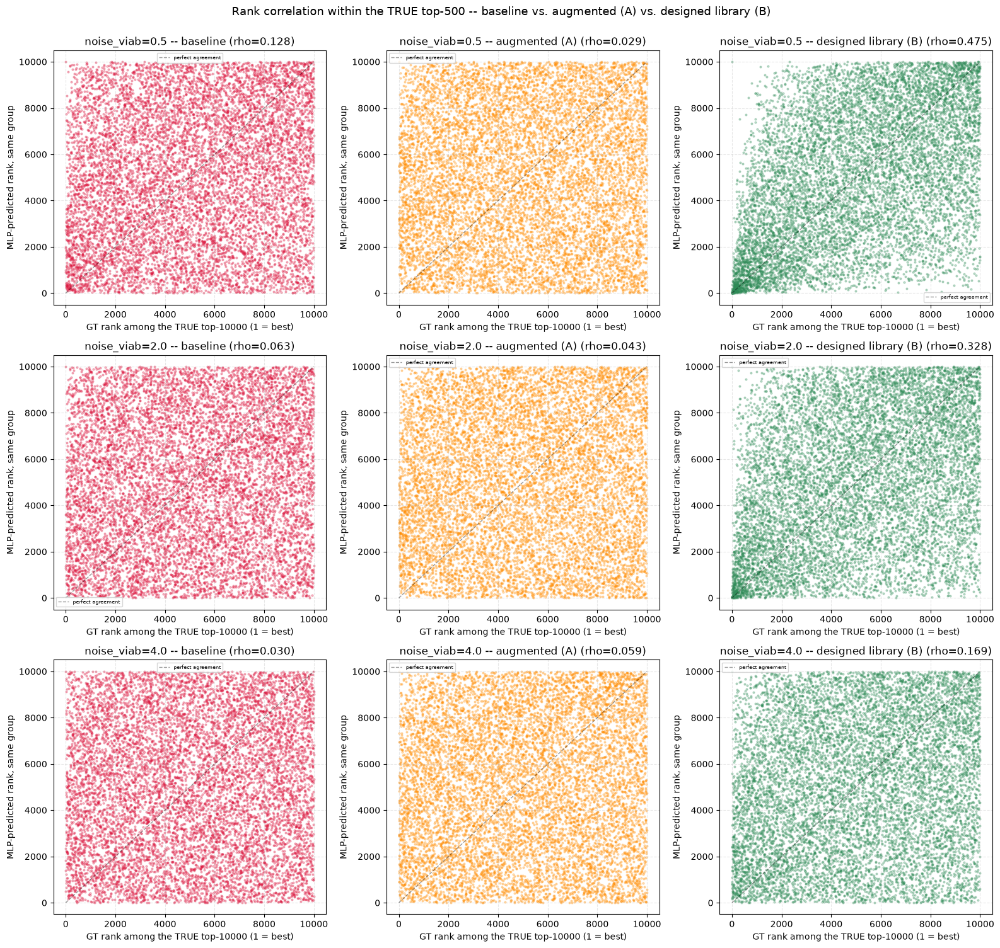

In [30]:
fig, axes = plt.subplots(len(NOISE_LEVELS_FOCUS), 3, figsize=(16, 5 * len(NOISE_LEVELS_FOCUS)))
for row, nv in enumerate(NOISE_LEVELS_FOCUS):
    panels = [
        (axes[row, 0], pred_best_baseline[nv],   "baseline",             "crimson"),
        (axes[row, 1], pred_best_A_by_noise[nv], "augmented (A)",        "darkorange"),
        (axes[row, 2], pred_best_B_by_noise[nv], "designed library (B)", "seagreen"),
    ]
    for ax, pred_best, name, color in panels:
        y_rank = mlp_rank(pred_best, ascending=False)
        rho = spearmanr(gt_rank, y_rank).statistic
        ax.scatter(gt_rank, y_rank, s=4, alpha=0.3, color=color)
        ax.plot([1, K_BEST], [1, K_BEST], "k--", alpha=0.4, lw=1, label="perfect agreement")
        ax.set_xlabel(f"GT rank among the TRUE top-{K_BEST} (1 = best)")
        ax.set_ylabel("MLP-predicted rank, same group")
        ax.set_title(f"noise_viab={nv} -- {name} (rho={rho:.3f})")
        ax.legend(fontsize=6)
        ax.grid(True, linestyle="--", alpha=0.3)
fig.suptitle("Rank correlation within the TRUE top-500 -- baseline vs. augmented (A) vs. designed library (B)",
             y=1.0, fontsize=13)
fig.tight_layout()
plt.show()


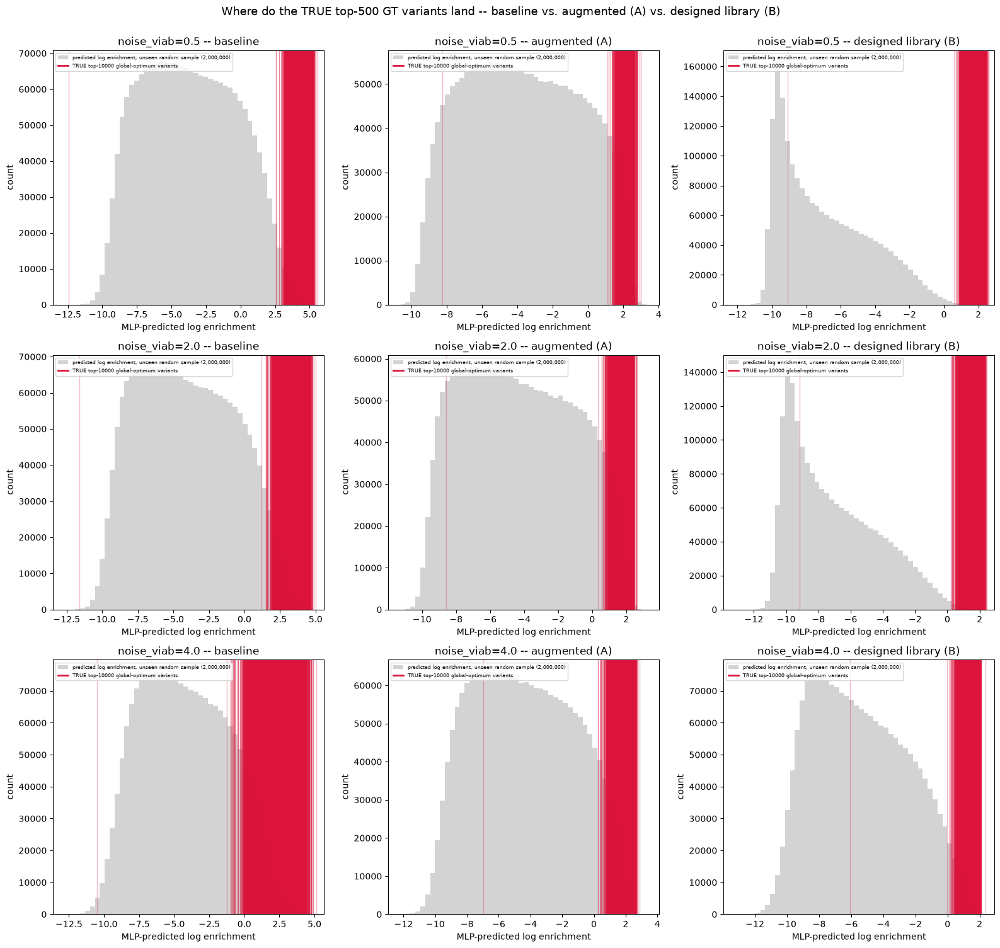

In [31]:
fig, axes = plt.subplots(len(NOISE_LEVELS_FOCUS), 3, figsize=(16, 5 * len(NOISE_LEVELS_FOCUS)))
for row, nv in enumerate(NOISE_LEVELS_FOCUS):
    panels = [
        (axes[row, 0], preds_big_by_noise[nv],   pred_best_baseline[nv],   "baseline"),
        (axes[row, 1], preds_big_A_by_noise[nv], pred_best_A_by_noise[nv], "augmented (A)"),
        (axes[row, 2], preds_big_B_by_noise[nv], pred_best_B_by_noise[nv], "designed library (B)"),
    ]
    for ax, pred_pop, pred_best, name in panels:
        ax.hist(pred_pop, bins=50, color="lightgray",
                label=f"predicted log enrichment, unseen random sample ({len(pred_pop):,})")
        for v in pred_best:
            ax.axvline(v, color="crimson", alpha=0.3, lw=1)
        ax.axvline(pred_best[0], color="crimson", lw=2, label=f"TRUE top-{K_BEST} global-optimum variants")
        ax.set_xlabel("MLP-predicted log enrichment")
        ax.set_ylabel("count")
        ax.set_title(f"noise_viab={nv} -- {name}")
        ax.legend(fontsize=6)
fig.suptitle("Where do the TRUE top-500 GT variants land -- baseline vs. augmented (A) vs. designed library (B)",
             y=1.0, fontsize=13)
fig.tight_layout()
plt.show()


## 12. Designed library C: rank-spanning training set

Model B (top-K_BEST only) separates the extreme group from the bulk well but barely orders it
internally -- plausibly because there is nothing in its training data BETWEEN the ordinary random
pool (clustered near the mean) and the extreme tip: a cliff, not a ramp. This tests the opposite
design: a library built from variants spread across the WHOLE score range -- every log-enrichment
"category" from worst to best -- so the model sees a graded ladder of examples at every level
instead of an isolated spike at one end.

**How the spanning set is built**: getting the sequence at an exact GLOBAL rank (e.g. rank
500,000,000 out of `20**7`) would need a full sort of all 1.28 billion sequences, far heavier than
the running top-k we've used everywhere else. Instead this approximates it: score the already-built
`sequences_big`/`X_big` (section 8's `N_BIG=2,000,000` unseen random sample -- `compute_score_array`
is plain F/J arithmetic, no network, so this is cheap even at this size), sort THAT sample, and take
`N_C=50,000` sequences at evenly-spaced positions in the sorted order -- i.e. a quantile-stratified
sample of the score distribution, approximating a rank-linspace without ever touching the full
`20**7` space. Realistic (NGS-simulated) labels, same convention as models A/B -- no noiseless-GT
cheating.

Caveat checked explicitly below: `sequences_big` is only 2,000,000 sequences out of 1.28 billion, so
its own extremes are NOT the true global best/worst (`best_seqs_viab[0]`/`worst_seqs_viab[0]`) --
just much better/worse than average. The gap is measured and printed, not assumed.


In [32]:
true_score_big = np.asarray(compute_score_array(jnp.asarray(sequences_big), F_viab, J_viab))
order_big = np.argsort(true_score_big)  # ascending: index 0 = worst of the 2M sample, -1 = best

N_C = 50_000  # matches this notebook's pool size / the linspace granularity discussed
quantile_positions = np.linspace(0, len(order_big) - 1, N_C).round().astype(int)
spanning_idx = order_big[quantile_positions]

sequences_spanning = np.asarray(sequences_big)[spanning_idx]
scores_spanning    = true_score_big[spanning_idx]

overlap_spanning = sum(tuple(row) in pool_set for row in sequences_spanning)
print(f"designed library C: {N_C:,} sequences at evenly-spaced rank quantiles of the "
      f"{N_BIG:,}-sample approximation")
print(f"overlap with the fixed {N:,}-sequence training/test pool: {overlap_spanning}")
print(f"score range covered: [{scores_spanning.min():.2f}, {scores_spanning.max():.2f}]")
print(f"TRUE global optimum: {best_scores_viab[0]:.2f}   TRUE global worst: {worst_scores_viab[0]:.2f}")
print(f"gap to TRUE best:  {best_scores_viab[0] - scores_spanning.max():.2f}")
print(f"gap to TRUE worst: {scores_spanning.min() - worst_scores_viab[0]:.2f}")


designed library C: 50,000 sequences at evenly-spaced rank quantiles of the 2,000,000-sample approximation
overlap with the fixed 50,000-sequence training/test pool: 2
score range covered: [-13.79, 9.29]
TRUE global optimum: 9.88   TRUE global worst: -15.23
gap to TRUE best:  0.59
gap to TRUE worst: 1.44


In [33]:
X_spanning_all = np.eye(NUM_AMINO_ACIDS, dtype=np.float32)[sequences_spanning].reshape(N_C, -1)
idx_train_c, idx_test_c = train_test_split(np.arange(N_C), test_size=0.5, random_state=0)
X_train_spanning_full, X_test_spanning = X_spanning_all[idx_train_c], X_spanning_all[idx_test_c]
print(f"spanning pool: {N_C:,}   train: {len(idx_train_c):,}   test: {len(idx_test_c):,}")


spanning pool: 50,000   train: 25,000   test: 25,000


In [34]:
models_C_by_noise, preds_big_C_by_noise = {}, {}
pred_best_C_by_noise, pred_worst_C_by_noise = {}, {}
recovery_c = []

for nv in NOISE_LEVELS_FOCUS:
    print(f"\n=== noise_viab = {nv} ===")

    protocol_spanning = ProtocolV3(N0=1_000_000_000, N1=500_000_000,
            dilution_factor=10, sequences=jnp.asarray(sequences_spanning), D=1e9,
            F_viab=F_viab, J_viab=J_viab, F_sel=F_viab, J_sel=J_viab,
            noise_viab=nv, noise_sel=0.5, T_sel=1, T_viab=1,
            )
    _bio_row, ngs_row = protocol_spanning.N_loop_DE(1)[0]
    lambda0p_c, lambda2p_c, _lambda3p_c = (np.asarray(x) for x in ngs_row)
    eps = 1.0
    y_all_spanning         = np.log((lambda2p_c + eps) / (lambda0p_c + eps))
    y_train_spanning_full  = y_all_spanning[idx_train_c]

    Xtr_C, ytr_C, Xva_C, yva_C = split_train_val(X_train_spanning_full, y_train_spanning_full,
                                                  val_frac=0.15, seed=0)
    model_C, _ = train_profile_mlp(Xtr_C, ytr_C, Xva_C, yva_C, seed=0, verbose=False)

    models_C_by_noise[nv]     = model_C
    preds_big_C_by_noise[nv]  = np.asarray(predict_log_enrichment(model_C, jnp.asarray(X_big)))
    pred_best_C_by_noise[nv]  = np.asarray(predict_log_enrichment(model_C, jnp.asarray(X_best_viab)))
    pred_worst_C_by_noise[nv] = np.asarray(predict_log_enrichment(model_C, jnp.asarray(X_worst_viab)))

    rec_c = recovery_rate(model_C)
    print(f"  recovery rate, designed library C (rank-spanning): {rec_c:.1%}")
    recovery_c.append(dict(noise_viab=nv, spanning_C=rec_c))



=== noise_viab = 0.5 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   0%|          | 6/1280 [00:00<00:21, 59.80it/s]

MLP brute-force scan:   1%|          | 12/1280 [00:00<00:22, 56.23it/s]

MLP brute-force scan:   1%|▏         | 18/1280 [00:00<00:23, 54.83it/s]

MLP brute-force scan:   2%|▏         | 24/1280 [00:00<00:23, 53.76it/s]

MLP brute-force scan:   2%|▏         | 30/1280 [00:00<00:23, 53.35it/s]

MLP brute-force scan:   3%|▎         | 36/1280 [00:00<00:23, 52.88it/s]

MLP brute-force scan:   3%|▎         | 42/1280 [00:00<00:23, 52.46it/s]

MLP brute-force scan:   4%|▍         | 48/1280 [00:00<00:23, 52.87it/s]

MLP brute-force scan:   4%|▍         | 54/1280 [00:01<00:23, 52.81it/s]

MLP brute-force scan:   5%|▍         | 60/1280 [00:01<00:22, 53.39it/s]

MLP brute-force scan:   5%|▌         | 66/1280 [00:01<00:22, 53.31it/s]

MLP brute-force scan:   6%|▌         | 72/1280 [00:01<00:22, 53.29it/s]

MLP brute-force scan:   6%|▌         | 78/1280 [00:01<00:22, 53.76it/s]

MLP brute-force scan:   7%|▋         | 84/1280 [00:01<00:22, 53.09it/s]

MLP brute-force scan:   7%|▋         | 90/1280 [00:01<00:22, 53.06it/s]

MLP brute-force scan:   8%|▊         | 96/1280 [00:01<00:22, 52.83it/s]

MLP brute-force scan:   8%|▊         | 102/1280 [00:01<00:22, 52.79it/s]

MLP brute-force scan:   8%|▊         | 108/1280 [00:02<00:22, 52.89it/s]

MLP brute-force scan:   9%|▉         | 114/1280 [00:02<00:21, 53.53it/s]

MLP brute-force scan:   9%|▉         | 120/1280 [00:02<00:21, 52.91it/s]

MLP brute-force scan:  10%|▉         | 126/1280 [00:02<00:21, 53.61it/s]

MLP brute-force scan:  10%|█         | 132/1280 [00:02<00:21, 53.47it/s]

MLP brute-force scan:  11%|█         | 138/1280 [00:02<00:21, 53.37it/s]

MLP brute-force scan:  11%|█▏        | 144/1280 [00:02<00:21, 53.62it/s]

MLP brute-force scan:  12%|█▏        | 150/1280 [00:02<00:21, 52.38it/s]

MLP brute-force scan:  12%|█▏        | 156/1280 [00:02<00:21, 52.91it/s]

MLP brute-force scan:  13%|█▎        | 162/1280 [00:03<00:21, 52.98it/s]

MLP brute-force scan:  13%|█▎        | 168/1280 [00:03<00:20, 53.32it/s]

MLP brute-force scan:  14%|█▎        | 174/1280 [00:03<00:20, 53.03it/s]

MLP brute-force scan:  14%|█▍        | 180/1280 [00:03<00:20, 52.78it/s]

MLP brute-force scan:  15%|█▍        | 186/1280 [00:03<00:20, 53.75it/s]

MLP brute-force scan:  15%|█▌        | 192/1280 [00:03<00:20, 52.74it/s]

MLP brute-force scan:  15%|█▌        | 198/1280 [00:03<00:20, 52.76it/s]

MLP brute-force scan:  16%|█▌        | 204/1280 [00:03<00:20, 52.59it/s]

MLP brute-force scan:  16%|█▋        | 210/1280 [00:03<00:20, 52.47it/s]

MLP brute-force scan:  17%|█▋        | 216/1280 [00:04<00:20, 51.85it/s]

MLP brute-force scan:  17%|█▋        | 222/1280 [00:04<00:19, 53.14it/s]

MLP brute-force scan:  18%|█▊        | 228/1280 [00:04<00:19, 52.85it/s]

MLP brute-force scan:  18%|█▊        | 234/1280 [00:04<00:19, 53.29it/s]

MLP brute-force scan:  19%|█▉        | 240/1280 [00:04<00:19, 53.45it/s]

MLP brute-force scan:  19%|█▉        | 246/1280 [00:04<00:19, 52.65it/s]

MLP brute-force scan:  20%|█▉        | 252/1280 [00:04<00:19, 52.42it/s]

MLP brute-force scan:  20%|██        | 258/1280 [00:04<00:19, 51.97it/s]

MLP brute-force scan:  21%|██        | 264/1280 [00:04<00:19, 52.28it/s]

MLP brute-force scan:  21%|██        | 270/1280 [00:05<00:19, 52.77it/s]

MLP brute-force scan:  22%|██▏       | 276/1280 [00:05<00:18, 53.39it/s]

MLP brute-force scan:  22%|██▏       | 282/1280 [00:05<00:18, 53.30it/s]

MLP brute-force scan:  22%|██▎       | 288/1280 [00:05<00:18, 53.43it/s]

MLP brute-force scan:  23%|██▎       | 294/1280 [00:05<00:18, 53.27it/s]

MLP brute-force scan:  23%|██▎       | 300/1280 [00:05<00:18, 52.46it/s]

MLP brute-force scan:  24%|██▍       | 306/1280 [00:05<00:18, 52.12it/s]

MLP brute-force scan:  24%|██▍       | 312/1280 [00:05<00:18, 52.01it/s]

MLP brute-force scan:  25%|██▍       | 318/1280 [00:05<00:18, 52.63it/s]

MLP brute-force scan:  25%|██▌       | 324/1280 [00:06<00:18, 52.91it/s]

MLP brute-force scan:  26%|██▌       | 330/1280 [00:06<00:17, 52.89it/s]

MLP brute-force scan:  26%|██▋       | 336/1280 [00:06<00:17, 53.38it/s]

MLP brute-force scan:  27%|██▋       | 342/1280 [00:06<00:17, 53.15it/s]

MLP brute-force scan:  27%|██▋       | 348/1280 [00:06<00:17, 52.56it/s]

MLP brute-force scan:  28%|██▊       | 354/1280 [00:06<00:17, 52.94it/s]

MLP brute-force scan:  28%|██▊       | 360/1280 [00:06<00:17, 52.38it/s]

MLP brute-force scan:  29%|██▊       | 366/1280 [00:06<00:17, 52.60it/s]

MLP brute-force scan:  29%|██▉       | 372/1280 [00:07<00:17, 52.06it/s]

MLP brute-force scan:  30%|██▉       | 378/1280 [00:07<00:17, 52.92it/s]

MLP brute-force scan:  30%|███       | 384/1280 [00:07<00:16, 52.89it/s]

MLP brute-force scan:  30%|███       | 390/1280 [00:07<00:16, 53.14it/s]

MLP brute-force scan:  31%|███       | 396/1280 [00:07<00:16, 53.18it/s]

MLP brute-force scan:  31%|███▏      | 402/1280 [00:07<00:16, 52.93it/s]

MLP brute-force scan:  32%|███▏      | 408/1280 [00:07<00:16, 53.09it/s]

MLP brute-force scan:  32%|███▏      | 414/1280 [00:07<00:16, 52.12it/s]

MLP brute-force scan:  33%|███▎      | 420/1280 [00:07<00:16, 52.06it/s]

MLP brute-force scan:  33%|███▎      | 426/1280 [00:08<00:16, 52.35it/s]

MLP brute-force scan:  34%|███▍      | 432/1280 [00:08<00:15, 53.05it/s]

MLP brute-force scan:  34%|███▍      | 438/1280 [00:08<00:16, 52.59it/s]

MLP brute-force scan:  35%|███▍      | 444/1280 [00:08<00:15, 53.06it/s]

MLP brute-force scan:  35%|███▌      | 450/1280 [00:08<00:15, 53.78it/s]

MLP brute-force scan:  36%|███▌      | 456/1280 [00:08<00:15, 51.70it/s]

MLP brute-force scan:  36%|███▌      | 462/1280 [00:08<00:15, 53.37it/s]

MLP brute-force scan:  37%|███▋      | 468/1280 [00:08<00:15, 52.88it/s]

MLP brute-force scan:  37%|███▋      | 474/1280 [00:08<00:15, 53.17it/s]

MLP brute-force scan:  38%|███▊      | 480/1280 [00:09<00:15, 53.22it/s]

MLP brute-force scan:  38%|███▊      | 486/1280 [00:09<00:14, 53.01it/s]

MLP brute-force scan:  38%|███▊      | 492/1280 [00:09<00:14, 53.04it/s]

MLP brute-force scan:  39%|███▉      | 498/1280 [00:09<00:14, 53.56it/s]

MLP brute-force scan:  39%|███▉      | 504/1280 [00:09<00:14, 53.88it/s]

MLP brute-force scan:  40%|███▉      | 510/1280 [00:09<00:14, 52.69it/s]

MLP brute-force scan:  40%|████      | 516/1280 [00:09<00:14, 52.99it/s]

MLP brute-force scan:  41%|████      | 522/1280 [00:09<00:14, 52.63it/s]

MLP brute-force scan:  41%|████▏     | 528/1280 [00:09<00:14, 52.51it/s]

MLP brute-force scan:  42%|████▏     | 534/1280 [00:10<00:14, 52.89it/s]

MLP brute-force scan:  42%|████▏     | 540/1280 [00:10<00:13, 53.45it/s]

MLP brute-force scan:  43%|████▎     | 546/1280 [00:10<00:13, 53.16it/s]

MLP brute-force scan:  43%|████▎     | 552/1280 [00:10<00:13, 53.72it/s]

MLP brute-force scan:  44%|████▎     | 558/1280 [00:10<00:13, 52.91it/s]

MLP brute-force scan:  44%|████▍     | 564/1280 [00:10<00:13, 52.96it/s]

MLP brute-force scan:  45%|████▍     | 570/1280 [00:10<00:13, 52.63it/s]

MLP brute-force scan:  45%|████▌     | 576/1280 [00:10<00:13, 52.67it/s]

MLP brute-force scan:  45%|████▌     | 582/1280 [00:10<00:13, 53.19it/s]

MLP brute-force scan:  46%|████▌     | 588/1280 [00:11<00:13, 52.86it/s]

MLP brute-force scan:  46%|████▋     | 594/1280 [00:11<00:12, 53.36it/s]

MLP brute-force scan:  47%|████▋     | 600/1280 [00:11<00:12, 53.43it/s]

MLP brute-force scan:  47%|████▋     | 606/1280 [00:11<00:12, 53.38it/s]

MLP brute-force scan:  48%|████▊     | 612/1280 [00:11<00:12, 52.62it/s]

MLP brute-force scan:  48%|████▊     | 618/1280 [00:11<00:12, 52.95it/s]

MLP brute-force scan:  49%|████▉     | 624/1280 [00:11<00:12, 52.85it/s]

MLP brute-force scan:  49%|████▉     | 630/1280 [00:11<00:12, 52.44it/s]

MLP brute-force scan:  50%|████▉     | 636/1280 [00:12<00:12, 52.71it/s]

MLP brute-force scan:  50%|█████     | 642/1280 [00:12<00:11, 53.19it/s]

MLP brute-force scan:  51%|█████     | 648/1280 [00:12<00:11, 53.35it/s]

MLP brute-force scan:  51%|█████     | 654/1280 [00:12<00:11, 53.29it/s]

MLP brute-force scan:  52%|█████▏    | 660/1280 [00:12<00:11, 53.14it/s]

MLP brute-force scan:  52%|█████▏    | 666/1280 [00:12<00:11, 52.87it/s]

MLP brute-force scan:  52%|█████▎    | 672/1280 [00:12<00:11, 52.99it/s]

MLP brute-force scan:  53%|█████▎    | 678/1280 [00:12<00:11, 52.67it/s]

MLP brute-force scan:  53%|█████▎    | 684/1280 [00:12<00:11, 52.28it/s]

MLP brute-force scan:  54%|█████▍    | 690/1280 [00:13<00:11, 52.42it/s]

MLP brute-force scan:  54%|█████▍    | 696/1280 [00:13<00:11, 53.01it/s]

MLP brute-force scan:  55%|█████▍    | 702/1280 [00:13<00:10, 52.83it/s]

MLP brute-force scan:  55%|█████▌    | 708/1280 [00:13<00:10, 53.92it/s]

MLP brute-force scan:  56%|█████▌    | 714/1280 [00:13<00:10, 53.34it/s]

MLP brute-force scan:  56%|█████▋    | 720/1280 [00:13<00:10, 53.13it/s]

MLP brute-force scan:  57%|█████▋    | 726/1280 [00:13<00:10, 52.90it/s]

MLP brute-force scan:  57%|█████▋    | 732/1280 [00:13<00:10, 52.46it/s]

MLP brute-force scan:  58%|█████▊    | 738/1280 [00:13<00:10, 52.15it/s]

MLP brute-force scan:  58%|█████▊    | 744/1280 [00:14<00:10, 52.64it/s]

MLP brute-force scan:  59%|█████▊    | 750/1280 [00:14<00:09, 53.08it/s]

MLP brute-force scan:  59%|█████▉    | 756/1280 [00:14<00:09, 52.44it/s]

MLP brute-force scan:  60%|█████▉    | 762/1280 [00:14<00:09, 53.43it/s]

MLP brute-force scan:  60%|██████    | 768/1280 [00:14<00:09, 53.27it/s]

MLP brute-force scan:  60%|██████    | 774/1280 [00:14<00:09, 52.98it/s]

MLP brute-force scan:  61%|██████    | 780/1280 [00:14<00:09, 52.75it/s]

MLP brute-force scan:  61%|██████▏   | 786/1280 [00:14<00:09, 52.74it/s]

MLP brute-force scan:  62%|██████▏   | 792/1280 [00:14<00:09, 52.20it/s]

MLP brute-force scan:  62%|██████▏   | 798/1280 [00:15<00:09, 52.82it/s]

MLP brute-force scan:  63%|██████▎   | 804/1280 [00:15<00:08, 53.50it/s]

MLP brute-force scan:  63%|██████▎   | 810/1280 [00:15<00:08, 53.68it/s]

MLP brute-force scan:  64%|██████▍   | 816/1280 [00:15<00:08, 53.82it/s]

MLP brute-force scan:  64%|██████▍   | 822/1280 [00:15<00:08, 53.64it/s]

MLP brute-force scan:  65%|██████▍   | 828/1280 [00:15<00:08, 52.83it/s]

MLP brute-force scan:  65%|██████▌   | 834/1280 [00:15<00:08, 52.96it/s]

MLP brute-force scan:  66%|██████▌   | 840/1280 [00:15<00:08, 52.11it/s]

MLP brute-force scan:  66%|██████▌   | 846/1280 [00:15<00:08, 53.04it/s]

MLP brute-force scan:  67%|██████▋   | 852/1280 [00:16<00:08, 53.30it/s]

MLP brute-force scan:  67%|██████▋   | 858/1280 [00:16<00:07, 53.39it/s]

MLP brute-force scan:  68%|██████▊   | 864/1280 [00:16<00:07, 53.70it/s]

MLP brute-force scan:  68%|██████▊   | 870/1280 [00:16<00:07, 53.50it/s]

MLP brute-force scan:  68%|██████▊   | 876/1280 [00:16<00:07, 53.45it/s]

MLP brute-force scan:  69%|██████▉   | 882/1280 [00:16<00:07, 52.83it/s]

MLP brute-force scan:  69%|██████▉   | 888/1280 [00:16<00:07, 52.86it/s]

MLP brute-force scan:  70%|██████▉   | 894/1280 [00:16<00:07, 52.59it/s]

MLP brute-force scan:  70%|███████   | 900/1280 [00:16<00:07, 52.90it/s]

MLP brute-force scan:  71%|███████   | 906/1280 [00:17<00:07, 52.79it/s]

MLP brute-force scan:  71%|███████▏  | 912/1280 [00:17<00:06, 53.06it/s]

MLP brute-force scan:  72%|███████▏  | 918/1280 [00:17<00:06, 53.39it/s]

MLP brute-force scan:  72%|███████▏  | 924/1280 [00:17<00:06, 53.75it/s]

MLP brute-force scan:  73%|███████▎  | 930/1280 [00:17<00:06, 52.69it/s]

MLP brute-force scan:  73%|███████▎  | 936/1280 [00:17<00:06, 52.73it/s]

MLP brute-force scan:  74%|███████▎  | 942/1280 [00:17<00:06, 52.71it/s]

MLP brute-force scan:  74%|███████▍  | 948/1280 [00:17<00:06, 52.18it/s]

MLP brute-force scan:  75%|███████▍  | 954/1280 [00:18<00:06, 53.21it/s]

MLP brute-force scan:  75%|███████▌  | 960/1280 [00:18<00:06, 52.58it/s]

MLP brute-force scan:  75%|███████▌  | 966/1280 [00:18<00:05, 53.14it/s]

MLP brute-force scan:  76%|███████▌  | 972/1280 [00:18<00:05, 53.11it/s]

MLP brute-force scan:  76%|███████▋  | 978/1280 [00:18<00:05, 53.72it/s]

MLP brute-force scan:  77%|███████▋  | 984/1280 [00:18<00:05, 52.65it/s]

MLP brute-force scan:  77%|███████▋  | 990/1280 [00:18<00:05, 53.06it/s]

MLP brute-force scan:  78%|███████▊  | 996/1280 [00:18<00:05, 52.55it/s]

MLP brute-force scan:  78%|███████▊  | 1002/1280 [00:18<00:05, 52.67it/s]

MLP brute-force scan:  79%|███████▉  | 1008/1280 [00:19<00:05, 53.04it/s]

MLP brute-force scan:  79%|███████▉  | 1014/1280 [00:19<00:05, 52.70it/s]

MLP brute-force scan:  80%|███████▉  | 1020/1280 [00:19<00:04, 52.73it/s]

MLP brute-force scan:  80%|████████  | 1026/1280 [00:19<00:04, 53.51it/s]

MLP brute-force scan:  81%|████████  | 1032/1280 [00:19<00:04, 53.43it/s]

MLP brute-force scan:  81%|████████  | 1038/1280 [00:19<00:04, 52.63it/s]

MLP brute-force scan:  82%|████████▏ | 1044/1280 [00:19<00:04, 52.61it/s]

MLP brute-force scan:  82%|████████▏ | 1050/1280 [00:19<00:04, 51.95it/s]

MLP brute-force scan:  82%|████████▎ | 1056/1280 [00:19<00:04, 52.65it/s]

MLP brute-force scan:  83%|████████▎ | 1062/1280 [00:20<00:04, 52.56it/s]

MLP brute-force scan:  83%|████████▎ | 1068/1280 [00:20<00:04, 52.57it/s]

MLP brute-force scan:  84%|████████▍ | 1074/1280 [00:20<00:03, 53.20it/s]

MLP brute-force scan:  84%|████████▍ | 1080/1280 [00:20<00:03, 53.23it/s]

MLP brute-force scan:  85%|████████▍ | 1086/1280 [00:20<00:03, 52.93it/s]

MLP brute-force scan:  85%|████████▌ | 1092/1280 [00:20<00:03, 52.57it/s]

MLP brute-force scan:  86%|████████▌ | 1098/1280 [00:20<00:03, 52.95it/s]

MLP brute-force scan:  86%|████████▋ | 1104/1280 [00:20<00:03, 52.13it/s]

MLP brute-force scan:  87%|████████▋ | 1110/1280 [00:20<00:03, 52.70it/s]

MLP brute-force scan:  87%|████████▋ | 1116/1280 [00:21<00:03, 53.12it/s]

MLP brute-force scan:  88%|████████▊ | 1122/1280 [00:21<00:02, 53.12it/s]

MLP brute-force scan:  88%|████████▊ | 1128/1280 [00:21<00:02, 53.25it/s]

MLP brute-force scan:  89%|████████▊ | 1134/1280 [00:21<00:02, 53.10it/s]

MLP brute-force scan:  89%|████████▉ | 1140/1280 [00:21<00:02, 53.07it/s]

MLP brute-force scan:  90%|████████▉ | 1146/1280 [00:21<00:02, 52.80it/s]

MLP brute-force scan:  90%|█████████ | 1152/1280 [00:21<00:02, 52.76it/s]

MLP brute-force scan:  90%|█████████ | 1158/1280 [00:21<00:02, 52.09it/s]

MLP brute-force scan:  91%|█████████ | 1164/1280 [00:21<00:02, 52.94it/s]

MLP brute-force scan:  91%|█████████▏| 1170/1280 [00:22<00:02, 52.58it/s]

MLP brute-force scan:  92%|█████████▏| 1176/1280 [00:22<00:01, 53.05it/s]

MLP brute-force scan:  92%|█████████▏| 1182/1280 [00:22<00:01, 53.16it/s]

MLP brute-force scan:  93%|█████████▎| 1188/1280 [00:22<00:01, 53.52it/s]

MLP brute-force scan:  93%|█████████▎| 1194/1280 [00:22<00:01, 53.46it/s]

MLP brute-force scan:  94%|█████████▍| 1200/1280 [00:22<00:01, 53.17it/s]

MLP brute-force scan:  94%|█████████▍| 1206/1280 [00:22<00:01, 52.72it/s]

MLP brute-force scan:  95%|█████████▍| 1212/1280 [00:22<00:01, 52.58it/s]

MLP brute-force scan:  95%|█████████▌| 1218/1280 [00:22<00:01, 53.25it/s]

MLP brute-force scan:  96%|█████████▌| 1224/1280 [00:23<00:01, 53.29it/s]

MLP brute-force scan:  96%|█████████▌| 1230/1280 [00:23<00:00, 53.16it/s]

MLP brute-force scan:  97%|█████████▋| 1236/1280 [00:23<00:00, 53.41it/s]

MLP brute-force scan:  97%|█████████▋| 1242/1280 [00:23<00:00, 53.72it/s]

MLP brute-force scan:  98%|█████████▊| 1248/1280 [00:23<00:00, 52.95it/s]

MLP brute-force scan:  98%|█████████▊| 1254/1280 [00:23<00:00, 53.07it/s]

MLP brute-force scan:  98%|█████████▊| 1260/1280 [00:23<00:00, 52.40it/s]

MLP brute-force scan:  99%|█████████▉| 1266/1280 [00:23<00:00, 52.58it/s]

MLP brute-force scan:  99%|█████████▉| 1272/1280 [00:24<00:00, 52.82it/s]

MLP brute-force scan: 100%|█████████▉| 1278/1280 [00:24<00:00, 52.91it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 52.97it/s]

  recovery rate, designed library C (rank-spanning): 12.0%

=== noise_viab = 2.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles: 100%|██████████| 40/40 [00:00<00:00, 395.69it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   0%|          | 6/1280 [00:00<00:21, 58.88it/s]

MLP brute-force scan:   1%|          | 12/1280 [00:00<00:22, 55.79it/s]

MLP brute-force scan:   1%|▏         | 18/1280 [00:00<00:23, 53.66it/s]

MLP brute-force scan:   2%|▏         | 24/1280 [00:00<00:23, 52.99it/s]

MLP brute-force scan:   2%|▏         | 30/1280 [00:00<00:23, 52.30it/s]

MLP brute-force scan:   3%|▎         | 36/1280 [00:00<00:23, 53.32it/s]

MLP brute-force scan:   3%|▎         | 42/1280 [00:00<00:23, 53.42it/s]

MLP brute-force scan:   4%|▍         | 48/1280 [00:00<00:23, 53.55it/s]

MLP brute-force scan:   4%|▍         | 54/1280 [00:01<00:23, 52.82it/s]

MLP brute-force scan:   5%|▍         | 60/1280 [00:01<00:22, 53.53it/s]

MLP brute-force scan:   5%|▌         | 66/1280 [00:01<00:22, 52.94it/s]

MLP brute-force scan:   6%|▌         | 72/1280 [00:01<00:22, 52.77it/s]

MLP brute-force scan:   6%|▌         | 78/1280 [00:01<00:22, 52.46it/s]

MLP brute-force scan:   7%|▋         | 84/1280 [00:01<00:22, 53.27it/s]

MLP brute-force scan:   7%|▋         | 90/1280 [00:01<00:22, 53.28it/s]

MLP brute-force scan:   8%|▊         | 96/1280 [00:01<00:22, 52.86it/s]

MLP brute-force scan:   8%|▊         | 102/1280 [00:01<00:22, 52.96it/s]

MLP brute-force scan:   8%|▊         | 108/1280 [00:02<00:21, 53.34it/s]

MLP brute-force scan:   9%|▉         | 114/1280 [00:02<00:21, 53.31it/s]

MLP brute-force scan:   9%|▉         | 120/1280 [00:02<00:21, 53.25it/s]

MLP brute-force scan:  10%|▉         | 126/1280 [00:02<00:21, 53.12it/s]

MLP brute-force scan:  10%|█         | 132/1280 [00:02<00:21, 52.46it/s]

MLP brute-force scan:  11%|█         | 138/1280 [00:02<00:21, 52.88it/s]

MLP brute-force scan:  11%|█▏        | 144/1280 [00:02<00:21, 53.15it/s]

MLP brute-force scan:  12%|█▏        | 150/1280 [00:02<00:21, 52.73it/s]

MLP brute-force scan:  12%|█▏        | 156/1280 [00:02<00:21, 53.14it/s]

MLP brute-force scan:  13%|█▎        | 162/1280 [00:03<00:21, 53.02it/s]

MLP brute-force scan:  13%|█▎        | 168/1280 [00:03<00:20, 52.98it/s]

MLP brute-force scan:  14%|█▎        | 174/1280 [00:03<00:20, 53.19it/s]

MLP brute-force scan:  14%|█▍        | 180/1280 [00:03<00:20, 53.24it/s]

MLP brute-force scan:  15%|█▍        | 186/1280 [00:03<00:20, 52.52it/s]

MLP brute-force scan:  15%|█▌        | 192/1280 [00:03<00:20, 52.48it/s]

MLP brute-force scan:  15%|█▌        | 198/1280 [00:03<00:20, 52.38it/s]

MLP brute-force scan:  16%|█▌        | 204/1280 [00:03<00:20, 52.24it/s]

MLP brute-force scan:  16%|█▋        | 210/1280 [00:03<00:20, 53.31it/s]

MLP brute-force scan:  17%|█▋        | 216/1280 [00:04<00:19, 53.20it/s]

MLP brute-force scan:  17%|█▋        | 222/1280 [00:04<00:19, 53.09it/s]

MLP brute-force scan:  18%|█▊        | 228/1280 [00:04<00:20, 52.28it/s]

MLP brute-force scan:  18%|█▊        | 234/1280 [00:04<00:19, 53.06it/s]

MLP brute-force scan:  19%|█▉        | 240/1280 [00:04<00:19, 52.42it/s]

MLP brute-force scan:  19%|█▉        | 246/1280 [00:04<00:19, 52.53it/s]

MLP brute-force scan:  20%|█▉        | 252/1280 [00:04<00:19, 52.62it/s]

MLP brute-force scan:  20%|██        | 258/1280 [00:04<00:19, 52.71it/s]

MLP brute-force scan:  21%|██        | 264/1280 [00:04<00:19, 53.08it/s]

MLP brute-force scan:  21%|██        | 270/1280 [00:05<00:18, 53.64it/s]

MLP brute-force scan:  22%|██▏       | 276/1280 [00:05<00:18, 53.59it/s]

MLP brute-force scan:  22%|██▏       | 282/1280 [00:05<00:18, 52.92it/s]

MLP brute-force scan:  22%|██▎       | 288/1280 [00:05<00:18, 52.86it/s]

MLP brute-force scan:  23%|██▎       | 294/1280 [00:05<00:18, 52.40it/s]

MLP brute-force scan:  23%|██▎       | 300/1280 [00:05<00:18, 52.40it/s]

MLP brute-force scan:  24%|██▍       | 306/1280 [00:05<00:18, 52.66it/s]

MLP brute-force scan:  24%|██▍       | 312/1280 [00:05<00:18, 52.88it/s]

MLP brute-force scan:  25%|██▍       | 318/1280 [00:05<00:17, 53.93it/s]

MLP brute-force scan:  25%|██▌       | 324/1280 [00:06<00:17, 53.44it/s]

MLP brute-force scan:  26%|██▌       | 330/1280 [00:06<00:17, 53.18it/s]

MLP brute-force scan:  26%|██▋       | 336/1280 [00:06<00:17, 53.27it/s]

MLP brute-force scan:  27%|██▋       | 342/1280 [00:06<00:17, 52.44it/s]

MLP brute-force scan:  27%|██▋       | 348/1280 [00:06<00:17, 53.01it/s]

MLP brute-force scan:  28%|██▊       | 354/1280 [00:06<00:17, 53.03it/s]

MLP brute-force scan:  28%|██▊       | 360/1280 [00:06<00:17, 53.30it/s]

MLP brute-force scan:  29%|██▊       | 366/1280 [00:06<00:17, 53.46it/s]

MLP brute-force scan:  29%|██▉       | 372/1280 [00:07<00:16, 53.61it/s]

MLP brute-force scan:  30%|██▉       | 378/1280 [00:07<00:16, 53.36it/s]

MLP brute-force scan:  30%|███       | 384/1280 [00:07<00:16, 52.85it/s]

MLP brute-force scan:  30%|███       | 390/1280 [00:07<00:16, 53.02it/s]

MLP brute-force scan:  31%|███       | 396/1280 [00:07<00:16, 52.67it/s]

MLP brute-force scan:  31%|███▏      | 402/1280 [00:07<00:16, 52.37it/s]

MLP brute-force scan:  32%|███▏      | 408/1280 [00:07<00:16, 52.77it/s]

MLP brute-force scan:  32%|███▏      | 414/1280 [00:07<00:16, 52.92it/s]

MLP brute-force scan:  33%|███▎      | 420/1280 [00:07<00:16, 52.95it/s]

MLP brute-force scan:  33%|███▎      | 426/1280 [00:08<00:16, 53.03it/s]

MLP brute-force scan:  34%|███▍      | 432/1280 [00:08<00:15, 53.15it/s]

MLP brute-force scan:  34%|███▍      | 438/1280 [00:08<00:15, 52.67it/s]

MLP brute-force scan:  35%|███▍      | 444/1280 [00:08<00:15, 52.85it/s]

MLP brute-force scan:  35%|███▌      | 450/1280 [00:08<00:15, 52.00it/s]

MLP brute-force scan:  36%|███▌      | 456/1280 [00:08<00:15, 52.45it/s]

MLP brute-force scan:  36%|███▌      | 462/1280 [00:08<00:15, 53.07it/s]

MLP brute-force scan:  37%|███▋      | 468/1280 [00:08<00:15, 52.86it/s]

MLP brute-force scan:  37%|███▋      | 474/1280 [00:08<00:15, 53.23it/s]

MLP brute-force scan:  38%|███▊      | 480/1280 [00:09<00:14, 53.61it/s]

MLP brute-force scan:  38%|███▊      | 486/1280 [00:09<00:14, 53.64it/s]

MLP brute-force scan:  38%|███▊      | 492/1280 [00:09<00:14, 52.98it/s]

MLP brute-force scan:  39%|███▉      | 498/1280 [00:09<00:14, 53.13it/s]

MLP brute-force scan:  39%|███▉      | 504/1280 [00:09<00:14, 52.11it/s]

MLP brute-force scan:  40%|███▉      | 510/1280 [00:09<00:14, 52.79it/s]

MLP brute-force scan:  40%|████      | 516/1280 [00:09<00:14, 52.48it/s]

MLP brute-force scan:  41%|████      | 522/1280 [00:09<00:14, 53.16it/s]

MLP brute-force scan:  41%|████▏     | 528/1280 [00:09<00:14, 53.24it/s]

MLP brute-force scan:  42%|████▏     | 534/1280 [00:10<00:13, 53.43it/s]

MLP brute-force scan:  42%|████▏     | 540/1280 [00:10<00:13, 54.08it/s]

MLP brute-force scan:  43%|████▎     | 546/1280 [00:10<00:13, 52.55it/s]

MLP brute-force scan:  43%|████▎     | 552/1280 [00:10<00:13, 53.48it/s]

MLP brute-force scan:  44%|████▎     | 558/1280 [00:10<00:13, 52.67it/s]

MLP brute-force scan:  44%|████▍     | 564/1280 [00:10<00:13, 53.14it/s]

MLP brute-force scan:  45%|████▍     | 570/1280 [00:10<00:13, 53.32it/s]

MLP brute-force scan:  45%|████▌     | 576/1280 [00:10<00:13, 52.86it/s]

MLP brute-force scan:  45%|████▌     | 582/1280 [00:10<00:13, 53.16it/s]

MLP brute-force scan:  46%|████▌     | 588/1280 [00:11<00:12, 53.60it/s]

MLP brute-force scan:  46%|████▋     | 594/1280 [00:11<00:12, 53.46it/s]

MLP brute-force scan:  47%|████▋     | 600/1280 [00:11<00:12, 52.81it/s]

MLP brute-force scan:  47%|████▋     | 606/1280 [00:11<00:12, 52.82it/s]

MLP brute-force scan:  48%|████▊     | 612/1280 [00:11<00:12, 52.91it/s]

MLP brute-force scan:  48%|████▊     | 618/1280 [00:11<00:12, 53.06it/s]

MLP brute-force scan:  49%|████▉     | 624/1280 [00:11<00:12, 53.14it/s]

MLP brute-force scan:  49%|████▉     | 630/1280 [00:11<00:12, 53.49it/s]

MLP brute-force scan:  50%|████▉     | 636/1280 [00:11<00:12, 53.11it/s]

MLP brute-force scan:  50%|█████     | 642/1280 [00:12<00:11, 53.20it/s]

MLP brute-force scan:  51%|█████     | 648/1280 [00:12<00:11, 53.51it/s]

MLP brute-force scan:  51%|█████     | 654/1280 [00:12<00:11, 52.87it/s]

MLP brute-force scan:  52%|█████▏    | 660/1280 [00:12<00:11, 52.54it/s]

MLP brute-force scan:  52%|█████▏    | 666/1280 [00:12<00:11, 52.27it/s]

MLP brute-force scan:  52%|█████▎    | 672/1280 [00:12<00:11, 52.96it/s]

MLP brute-force scan:  53%|█████▎    | 678/1280 [00:12<00:11, 52.55it/s]

MLP brute-force scan:  53%|█████▎    | 684/1280 [00:12<00:11, 53.28it/s]

MLP brute-force scan:  54%|█████▍    | 690/1280 [00:13<00:11, 53.58it/s]

MLP brute-force scan:  54%|█████▍    | 696/1280 [00:13<00:10, 53.15it/s]

MLP brute-force scan:  55%|█████▍    | 702/1280 [00:13<00:10, 53.32it/s]

MLP brute-force scan:  55%|█████▌    | 708/1280 [00:13<00:10, 52.61it/s]

MLP brute-force scan:  56%|█████▌    | 714/1280 [00:13<00:10, 52.62it/s]

MLP brute-force scan:  56%|█████▋    | 720/1280 [00:13<00:10, 52.67it/s]

MLP brute-force scan:  57%|█████▋    | 726/1280 [00:13<00:10, 53.26it/s]

MLP brute-force scan:  57%|█████▋    | 732/1280 [00:13<00:10, 53.13it/s]

MLP brute-force scan:  58%|█████▊    | 738/1280 [00:13<00:10, 52.60it/s]

MLP brute-force scan:  58%|█████▊    | 744/1280 [00:14<00:10, 53.40it/s]

MLP brute-force scan:  59%|█████▊    | 750/1280 [00:14<00:09, 53.48it/s]

MLP brute-force scan:  59%|█████▉    | 756/1280 [00:14<00:10, 52.38it/s]

MLP brute-force scan:  60%|█████▉    | 762/1280 [00:14<00:09, 52.66it/s]

MLP brute-force scan:  60%|██████    | 768/1280 [00:14<00:09, 52.15it/s]

MLP brute-force scan:  60%|██████    | 774/1280 [00:14<00:09, 52.36it/s]

MLP brute-force scan:  61%|██████    | 780/1280 [00:14<00:09, 52.47it/s]

MLP brute-force scan:  61%|██████▏   | 786/1280 [00:14<00:09, 52.74it/s]

MLP brute-force scan:  62%|██████▏   | 792/1280 [00:14<00:09, 53.33it/s]

MLP brute-force scan:  62%|██████▏   | 798/1280 [00:15<00:09, 53.40it/s]

MLP brute-force scan:  63%|██████▎   | 804/1280 [00:15<00:08, 53.64it/s]

MLP brute-force scan:  63%|██████▎   | 810/1280 [00:15<00:08, 52.52it/s]

MLP brute-force scan:  64%|██████▍   | 816/1280 [00:15<00:08, 52.59it/s]

MLP brute-force scan:  64%|██████▍   | 822/1280 [00:15<00:08, 52.09it/s]

MLP brute-force scan:  65%|██████▍   | 828/1280 [00:15<00:08, 52.11it/s]

MLP brute-force scan:  65%|██████▌   | 834/1280 [00:15<00:08, 52.33it/s]

MLP brute-force scan:  66%|██████▌   | 840/1280 [00:15<00:08, 52.78it/s]

MLP brute-force scan:  66%|██████▌   | 846/1280 [00:15<00:08, 52.75it/s]

MLP brute-force scan:  67%|██████▋   | 852/1280 [00:16<00:08, 52.93it/s]

MLP brute-force scan:  67%|██████▋   | 858/1280 [00:16<00:07, 53.03it/s]

MLP brute-force scan:  68%|██████▊   | 864/1280 [00:16<00:07, 52.30it/s]

MLP brute-force scan:  68%|██████▊   | 870/1280 [00:16<00:07, 52.82it/s]

MLP brute-force scan:  68%|██████▊   | 876/1280 [00:16<00:07, 52.32it/s]

MLP brute-force scan:  69%|██████▉   | 882/1280 [00:16<00:07, 52.60it/s]

MLP brute-force scan:  69%|██████▉   | 888/1280 [00:16<00:07, 52.74it/s]

MLP brute-force scan:  70%|██████▉   | 894/1280 [00:16<00:07, 53.15it/s]

MLP brute-force scan:  70%|███████   | 900/1280 [00:16<00:07, 53.23it/s]

MLP brute-force scan:  71%|███████   | 906/1280 [00:17<00:07, 53.08it/s]

MLP brute-force scan:  71%|███████▏  | 912/1280 [00:17<00:06, 53.06it/s]

MLP brute-force scan:  72%|███████▏  | 918/1280 [00:17<00:06, 52.59it/s]

MLP brute-force scan:  72%|███████▏  | 924/1280 [00:17<00:06, 52.75it/s]

MLP brute-force scan:  73%|███████▎  | 930/1280 [00:17<00:06, 52.55it/s]

MLP brute-force scan:  73%|███████▎  | 936/1280 [00:17<00:06, 53.13it/s]

MLP brute-force scan:  74%|███████▎  | 942/1280 [00:17<00:06, 52.59it/s]

MLP brute-force scan:  74%|███████▍  | 948/1280 [00:17<00:06, 53.07it/s]

MLP brute-force scan:  75%|███████▍  | 954/1280 [00:18<00:06, 52.98it/s]

MLP brute-force scan:  75%|███████▌  | 960/1280 [00:18<00:05, 53.39it/s]

MLP brute-force scan:  75%|███████▌  | 966/1280 [00:18<00:05, 52.84it/s]

MLP brute-force scan:  76%|███████▌  | 972/1280 [00:18<00:05, 53.08it/s]

MLP brute-force scan:  76%|███████▋  | 978/1280 [00:18<00:05, 52.36it/s]

MLP brute-force scan:  77%|███████▋  | 984/1280 [00:18<00:05, 52.71it/s]

MLP brute-force scan:  77%|███████▋  | 990/1280 [00:18<00:05, 52.37it/s]

MLP brute-force scan:  78%|███████▊  | 996/1280 [00:18<00:05, 53.23it/s]

MLP brute-force scan:  78%|███████▊  | 1002/1280 [00:18<00:05, 53.28it/s]

MLP brute-force scan:  79%|███████▉  | 1008/1280 [00:19<00:05, 53.04it/s]

MLP brute-force scan:  79%|███████▉  | 1014/1280 [00:19<00:04, 53.35it/s]

MLP brute-force scan:  80%|███████▉  | 1020/1280 [00:19<00:04, 53.16it/s]

MLP brute-force scan:  80%|████████  | 1026/1280 [00:19<00:04, 52.91it/s]

MLP brute-force scan:  81%|████████  | 1032/1280 [00:19<00:04, 52.40it/s]

MLP brute-force scan:  81%|████████  | 1038/1280 [00:19<00:04, 53.07it/s]

MLP brute-force scan:  82%|████████▏ | 1044/1280 [00:19<00:04, 52.58it/s]

MLP brute-force scan:  82%|████████▏ | 1050/1280 [00:19<00:04, 53.49it/s]

MLP brute-force scan:  82%|████████▎ | 1056/1280 [00:19<00:04, 53.56it/s]

MLP brute-force scan:  83%|████████▎ | 1062/1280 [00:20<00:04, 53.55it/s]

MLP brute-force scan:  83%|████████▎ | 1068/1280 [00:20<00:03, 53.55it/s]

MLP brute-force scan:  84%|████████▍ | 1074/1280 [00:20<00:03, 52.99it/s]

MLP brute-force scan:  84%|████████▍ | 1080/1280 [00:20<00:03, 53.19it/s]

MLP brute-force scan:  85%|████████▍ | 1086/1280 [00:20<00:03, 52.48it/s]

MLP brute-force scan:  85%|████████▌ | 1092/1280 [00:20<00:03, 52.51it/s]

MLP brute-force scan:  86%|████████▌ | 1098/1280 [00:20<00:03, 52.80it/s]

MLP brute-force scan:  86%|████████▋ | 1104/1280 [00:20<00:03, 52.74it/s]

MLP brute-force scan:  87%|████████▋ | 1110/1280 [00:20<00:03, 53.33it/s]

MLP brute-force scan:  87%|████████▋ | 1116/1280 [00:21<00:03, 53.57it/s]

MLP brute-force scan:  88%|████████▊ | 1122/1280 [00:21<00:02, 54.09it/s]

MLP brute-force scan:  88%|████████▊ | 1128/1280 [00:21<00:02, 52.21it/s]

MLP brute-force scan:  89%|████████▊ | 1134/1280 [00:21<00:02, 53.53it/s]

MLP brute-force scan:  89%|████████▉ | 1140/1280 [00:21<00:02, 52.72it/s]

MLP brute-force scan:  90%|████████▉ | 1146/1280 [00:21<00:02, 52.56it/s]

MLP brute-force scan:  90%|█████████ | 1152/1280 [00:21<00:02, 52.93it/s]

MLP brute-force scan:  90%|█████████ | 1158/1280 [00:21<00:02, 53.30it/s]

MLP brute-force scan:  91%|█████████ | 1164/1280 [00:21<00:02, 53.17it/s]

MLP brute-force scan:  91%|█████████▏| 1170/1280 [00:22<00:02, 53.80it/s]

MLP brute-force scan:  92%|█████████▏| 1176/1280 [00:22<00:01, 53.57it/s]

MLP brute-force scan:  92%|█████████▏| 1182/1280 [00:22<00:01, 53.05it/s]

MLP brute-force scan:  93%|█████████▎| 1188/1280 [00:22<00:01, 53.04it/s]

MLP brute-force scan:  93%|█████████▎| 1194/1280 [00:22<00:01, 52.20it/s]

MLP brute-force scan:  94%|█████████▍| 1200/1280 [00:22<00:01, 52.79it/s]

MLP brute-force scan:  94%|█████████▍| 1206/1280 [00:22<00:01, 52.38it/s]

MLP brute-force scan:  95%|█████████▍| 1212/1280 [00:22<00:01, 53.18it/s]

MLP brute-force scan:  95%|█████████▌| 1218/1280 [00:22<00:01, 53.16it/s]

MLP brute-force scan:  96%|█████████▌| 1224/1280 [00:23<00:01, 52.38it/s]

MLP brute-force scan:  96%|█████████▌| 1230/1280 [00:23<00:00, 53.40it/s]

MLP brute-force scan:  97%|█████████▋| 1236/1280 [00:23<00:00, 52.55it/s]

MLP brute-force scan:  97%|█████████▋| 1242/1280 [00:23<00:00, 52.22it/s]

MLP brute-force scan:  98%|█████████▊| 1248/1280 [00:23<00:00, 52.49it/s]

MLP brute-force scan:  98%|█████████▊| 1254/1280 [00:23<00:00, 52.33it/s]

MLP brute-force scan:  98%|█████████▊| 1260/1280 [00:23<00:00, 53.01it/s]

MLP brute-force scan:  99%|█████████▉| 1266/1280 [00:23<00:00, 53.20it/s]

MLP brute-force scan:  99%|█████████▉| 1272/1280 [00:24<00:00, 52.93it/s]

MLP brute-force scan: 100%|█████████▉| 1278/1280 [00:24<00:00, 53.12it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 52.97it/s]

  recovery rate, designed library C (rank-spanning): 4.7%

=== noise_viab = 4.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  90%|█████████ | 36/40 [00:00<00:00, 355.59it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  88%|████████▊ | 35/40 [00:00<00:00, 343.30it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

MLP brute-force scan:   0%|          | 0/1280 [00:00<?, ?it/s]

MLP brute-force scan:   0%|          | 6/1280 [00:00<00:22, 57.77it/s]

MLP brute-force scan:   1%|          | 12/1280 [00:00<00:23, 53.76it/s]

MLP brute-force scan:   1%|▏         | 18/1280 [00:00<00:23, 54.51it/s]

MLP brute-force scan:   2%|▏         | 24/1280 [00:00<00:23, 53.95it/s]

MLP brute-force scan:   2%|▏         | 30/1280 [00:00<00:23, 53.37it/s]

MLP brute-force scan:   3%|▎         | 36/1280 [00:00<00:23, 53.81it/s]

MLP brute-force scan:   3%|▎         | 42/1280 [00:00<00:22, 53.98it/s]

MLP brute-force scan:   4%|▍         | 48/1280 [00:00<00:23, 52.97it/s]

MLP brute-force scan:   4%|▍         | 54/1280 [00:01<00:23, 52.64it/s]

MLP brute-force scan:   5%|▍         | 60/1280 [00:01<00:23, 52.42it/s]

MLP brute-force scan:   5%|▌         | 66/1280 [00:01<00:23, 52.15it/s]

MLP brute-force scan:   6%|▌         | 72/1280 [00:01<00:22, 52.64it/s]

MLP brute-force scan:   6%|▌         | 78/1280 [00:01<00:22, 53.05it/s]

MLP brute-force scan:   7%|▋         | 84/1280 [00:01<00:22, 52.98it/s]

MLP brute-force scan:   7%|▋         | 90/1280 [00:01<00:22, 53.53it/s]

MLP brute-force scan:   8%|▊         | 96/1280 [00:01<00:22, 52.89it/s]

MLP brute-force scan:   8%|▊         | 102/1280 [00:01<00:22, 52.84it/s]

MLP brute-force scan:   8%|▊         | 108/1280 [00:02<00:22, 52.91it/s]

MLP brute-force scan:   9%|▉         | 114/1280 [00:02<00:22, 51.71it/s]

MLP brute-force scan:   9%|▉         | 120/1280 [00:02<00:22, 52.16it/s]

MLP brute-force scan:  10%|▉         | 126/1280 [00:02<00:21, 52.84it/s]

MLP brute-force scan:  10%|█         | 132/1280 [00:02<00:21, 52.58it/s]

MLP brute-force scan:  11%|█         | 138/1280 [00:02<00:21, 52.70it/s]

MLP brute-force scan:  11%|█▏        | 144/1280 [00:02<00:21, 53.13it/s]

MLP brute-force scan:  12%|█▏        | 150/1280 [00:02<00:21, 53.27it/s]

MLP brute-force scan:  12%|█▏        | 156/1280 [00:02<00:21, 52.33it/s]

MLP brute-force scan:  13%|█▎        | 162/1280 [00:03<00:21, 52.99it/s]

MLP brute-force scan:  13%|█▎        | 168/1280 [00:03<00:21, 52.33it/s]

MLP brute-force scan:  14%|█▎        | 174/1280 [00:03<00:21, 52.49it/s]

MLP brute-force scan:  14%|█▍        | 180/1280 [00:03<00:20, 52.89it/s]

MLP brute-force scan:  15%|█▍        | 186/1280 [00:03<00:20, 52.43it/s]

MLP brute-force scan:  15%|█▌        | 192/1280 [00:03<00:20, 52.99it/s]

MLP brute-force scan:  15%|█▌        | 198/1280 [00:03<00:20, 52.88it/s]

MLP brute-force scan:  16%|█▌        | 204/1280 [00:03<00:20, 52.69it/s]

MLP brute-force scan:  16%|█▋        | 210/1280 [00:03<00:20, 52.62it/s]

MLP brute-force scan:  17%|█▋        | 216/1280 [00:04<00:20, 52.28it/s]

MLP brute-force scan:  17%|█▋        | 222/1280 [00:04<00:20, 52.38it/s]

MLP brute-force scan:  18%|█▊        | 228/1280 [00:04<00:19, 53.03it/s]

MLP brute-force scan:  18%|█▊        | 234/1280 [00:04<00:19, 53.08it/s]

MLP brute-force scan:  19%|█▉        | 240/1280 [00:04<00:19, 53.36it/s]

MLP brute-force scan:  19%|█▉        | 246/1280 [00:04<00:19, 52.97it/s]

MLP brute-force scan:  20%|█▉        | 252/1280 [00:04<00:19, 53.54it/s]

MLP brute-force scan:  20%|██        | 258/1280 [00:04<00:19, 52.75it/s]

MLP brute-force scan:  21%|██        | 264/1280 [00:04<00:19, 52.76it/s]

MLP brute-force scan:  21%|██        | 270/1280 [00:05<00:19, 52.17it/s]

MLP brute-force scan:  22%|██▏       | 276/1280 [00:05<00:19, 52.25it/s]

MLP brute-force scan:  22%|██▏       | 282/1280 [00:05<00:18, 52.56it/s]

MLP brute-force scan:  22%|██▎       | 288/1280 [00:05<00:18, 52.53it/s]

MLP brute-force scan:  23%|██▎       | 294/1280 [00:05<00:18, 52.83it/s]

MLP brute-force scan:  23%|██▎       | 300/1280 [00:05<00:18, 53.04it/s]

MLP brute-force scan:  24%|██▍       | 306/1280 [00:05<00:18, 53.44it/s]

MLP brute-force scan:  24%|██▍       | 312/1280 [00:05<00:18, 52.50it/s]

MLP brute-force scan:  25%|██▍       | 318/1280 [00:06<00:18, 53.12it/s]

MLP brute-force scan:  25%|██▌       | 324/1280 [00:06<00:18, 52.41it/s]

MLP brute-force scan:  26%|██▌       | 330/1280 [00:06<00:18, 52.30it/s]

MLP brute-force scan:  26%|██▋       | 336/1280 [00:06<00:17, 52.81it/s]

MLP brute-force scan:  27%|██▋       | 342/1280 [00:06<00:17, 53.35it/s]

MLP brute-force scan:  27%|██▋       | 348/1280 [00:06<00:17, 53.42it/s]

MLP brute-force scan:  28%|██▊       | 354/1280 [00:06<00:17, 53.44it/s]

MLP brute-force scan:  28%|██▊       | 360/1280 [00:06<00:17, 53.84it/s]

MLP brute-force scan:  29%|██▊       | 366/1280 [00:06<00:17, 52.97it/s]

MLP brute-force scan:  29%|██▉       | 372/1280 [00:07<00:17, 53.04it/s]

MLP brute-force scan:  30%|██▉       | 378/1280 [00:07<00:17, 52.08it/s]

MLP brute-force scan:  30%|███       | 384/1280 [00:07<00:16, 53.04it/s]

MLP brute-force scan:  30%|███       | 390/1280 [00:07<00:16, 53.17it/s]

MLP brute-force scan:  31%|███       | 396/1280 [00:07<00:16, 53.05it/s]

MLP brute-force scan:  31%|███▏      | 402/1280 [00:07<00:16, 53.09it/s]

MLP brute-force scan:  32%|███▏      | 408/1280 [00:07<00:16, 53.47it/s]

MLP brute-force scan:  32%|███▏      | 414/1280 [00:07<00:16, 53.93it/s]

MLP brute-force scan:  33%|███▎      | 420/1280 [00:07<00:16, 52.39it/s]

MLP brute-force scan:  33%|███▎      | 426/1280 [00:08<00:16, 53.30it/s]

MLP brute-force scan:  34%|███▍      | 432/1280 [00:08<00:16, 52.46it/s]

MLP brute-force scan:  34%|███▍      | 438/1280 [00:08<00:15, 52.96it/s]

MLP brute-force scan:  35%|███▍      | 444/1280 [00:08<00:15, 53.11it/s]

MLP brute-force scan:  35%|███▌      | 450/1280 [00:08<00:15, 52.98it/s]

MLP brute-force scan:  36%|███▌      | 456/1280 [00:08<00:15, 53.02it/s]

MLP brute-force scan:  36%|███▌      | 462/1280 [00:08<00:15, 53.72it/s]

MLP brute-force scan:  37%|███▋      | 468/1280 [00:08<00:15, 53.56it/s]

MLP brute-force scan:  37%|███▋      | 474/1280 [00:08<00:15, 52.60it/s]

MLP brute-force scan:  38%|███▊      | 480/1280 [00:09<00:15, 52.56it/s]

MLP brute-force scan:  38%|███▊      | 486/1280 [00:09<00:15, 52.88it/s]

MLP brute-force scan:  38%|███▊      | 492/1280 [00:09<00:14, 52.92it/s]

MLP brute-force scan:  39%|███▉      | 498/1280 [00:09<00:14, 52.97it/s]

MLP brute-force scan:  39%|███▉      | 504/1280 [00:09<00:14, 53.06it/s]

MLP brute-force scan:  40%|███▉      | 510/1280 [00:09<00:14, 53.24it/s]

MLP brute-force scan:  40%|████      | 516/1280 [00:09<00:14, 53.24it/s]

MLP brute-force scan:  41%|████      | 522/1280 [00:09<00:14, 53.41it/s]

MLP brute-force scan:  41%|████▏     | 528/1280 [00:09<00:14, 52.69it/s]

MLP brute-force scan:  42%|████▏     | 534/1280 [00:10<00:14, 52.62it/s]

MLP brute-force scan:  42%|████▏     | 540/1280 [00:10<00:13, 53.09it/s]

MLP brute-force scan:  43%|████▎     | 546/1280 [00:10<00:13, 53.30it/s]

MLP brute-force scan:  43%|████▎     | 552/1280 [00:10<00:13, 53.42it/s]

MLP brute-force scan:  44%|████▎     | 558/1280 [00:10<00:13, 53.61it/s]

MLP brute-force scan:  44%|████▍     | 564/1280 [00:10<00:13, 52.97it/s]

MLP brute-force scan:  45%|████▍     | 570/1280 [00:10<00:13, 53.07it/s]

MLP brute-force scan:  45%|████▌     | 576/1280 [00:10<00:13, 53.16it/s]

MLP brute-force scan:  45%|████▌     | 582/1280 [00:10<00:13, 53.21it/s]

MLP brute-force scan:  46%|████▌     | 588/1280 [00:11<00:13, 52.67it/s]

MLP brute-force scan:  46%|████▋     | 594/1280 [00:11<00:13, 52.30it/s]

MLP brute-force scan:  47%|████▋     | 600/1280 [00:11<00:12, 52.58it/s]

MLP brute-force scan:  47%|████▋     | 606/1280 [00:11<00:12, 52.83it/s]

MLP brute-force scan:  48%|████▊     | 612/1280 [00:11<00:12, 52.90it/s]

MLP brute-force scan:  48%|████▊     | 618/1280 [00:11<00:12, 53.74it/s]

MLP brute-force scan:  49%|████▉     | 624/1280 [00:11<00:12, 53.08it/s]

MLP brute-force scan:  49%|████▉     | 630/1280 [00:11<00:12, 53.26it/s]

MLP brute-force scan:  50%|████▉     | 636/1280 [00:12<00:12, 53.01it/s]

MLP brute-force scan:  50%|█████     | 642/1280 [00:12<00:12, 52.29it/s]

MLP brute-force scan:  51%|█████     | 648/1280 [00:12<00:12, 52.54it/s]

MLP brute-force scan:  51%|█████     | 654/1280 [00:12<00:11, 52.67it/s]

MLP brute-force scan:  52%|█████▏    | 660/1280 [00:12<00:11, 52.70it/s]

MLP brute-force scan:  52%|█████▏    | 666/1280 [00:12<00:11, 52.48it/s]

MLP brute-force scan:  52%|█████▎    | 672/1280 [00:12<00:11, 53.36it/s]

MLP brute-force scan:  53%|█████▎    | 678/1280 [00:12<00:11, 53.20it/s]

MLP brute-force scan:  53%|█████▎    | 684/1280 [00:12<00:11, 52.31it/s]

MLP brute-force scan:  54%|█████▍    | 690/1280 [00:13<00:11, 52.92it/s]

MLP brute-force scan:  54%|█████▍    | 696/1280 [00:13<00:11, 52.45it/s]

MLP brute-force scan:  55%|█████▍    | 702/1280 [00:13<00:11, 52.52it/s]

MLP brute-force scan:  55%|█████▌    | 708/1280 [00:13<00:10, 52.88it/s]

MLP brute-force scan:  56%|█████▌    | 714/1280 [00:13<00:10, 52.81it/s]

MLP brute-force scan:  56%|█████▋    | 720/1280 [00:13<00:10, 52.75it/s]

MLP brute-force scan:  57%|█████▋    | 726/1280 [00:13<00:10, 53.10it/s]

MLP brute-force scan:  57%|█████▋    | 732/1280 [00:13<00:10, 53.23it/s]

MLP brute-force scan:  58%|█████▊    | 738/1280 [00:13<00:10, 52.07it/s]

MLP brute-force scan:  58%|█████▊    | 744/1280 [00:14<00:10, 52.67it/s]

MLP brute-force scan:  59%|█████▊    | 750/1280 [00:14<00:10, 52.25it/s]

MLP brute-force scan:  59%|█████▉    | 756/1280 [00:14<00:10, 52.00it/s]

MLP brute-force scan:  60%|█████▉    | 762/1280 [00:14<00:09, 52.84it/s]

MLP brute-force scan:  60%|██████    | 768/1280 [00:14<00:09, 52.74it/s]

MLP brute-force scan:  60%|██████    | 774/1280 [00:14<00:09, 53.05it/s]

MLP brute-force scan:  61%|██████    | 780/1280 [00:14<00:09, 53.41it/s]

MLP brute-force scan:  61%|██████▏   | 786/1280 [00:14<00:09, 53.40it/s]

MLP brute-force scan:  62%|██████▏   | 792/1280 [00:14<00:09, 52.49it/s]

MLP brute-force scan:  62%|██████▏   | 798/1280 [00:15<00:09, 52.14it/s]

MLP brute-force scan:  63%|██████▎   | 804/1280 [00:15<00:09, 52.03it/s]

MLP brute-force scan:  63%|██████▎   | 810/1280 [00:15<00:08, 52.80it/s]

MLP brute-force scan:  64%|██████▍   | 816/1280 [00:15<00:08, 53.17it/s]

MLP brute-force scan:  64%|██████▍   | 822/1280 [00:15<00:08, 53.00it/s]

MLP brute-force scan:  65%|██████▍   | 828/1280 [00:15<00:08, 53.53it/s]

MLP brute-force scan:  65%|██████▌   | 834/1280 [00:15<00:08, 53.47it/s]

MLP brute-force scan:  66%|██████▌   | 840/1280 [00:15<00:08, 52.67it/s]

MLP brute-force scan:  66%|██████▌   | 846/1280 [00:15<00:08, 52.77it/s]

MLP brute-force scan:  67%|██████▋   | 852/1280 [00:16<00:08, 52.61it/s]

MLP brute-force scan:  67%|██████▋   | 858/1280 [00:16<00:08, 52.41it/s]

MLP brute-force scan:  68%|██████▊   | 864/1280 [00:16<00:07, 52.87it/s]

MLP brute-force scan:  68%|██████▊   | 870/1280 [00:16<00:07, 53.02it/s]

MLP brute-force scan:  68%|██████▊   | 876/1280 [00:16<00:07, 53.08it/s]

MLP brute-force scan:  69%|██████▉   | 882/1280 [00:16<00:07, 53.21it/s]

MLP brute-force scan:  69%|██████▉   | 888/1280 [00:16<00:07, 53.72it/s]

MLP brute-force scan:  70%|██████▉   | 894/1280 [00:16<00:07, 52.98it/s]

MLP brute-force scan:  70%|███████   | 900/1280 [00:17<00:07, 52.66it/s]

MLP brute-force scan:  71%|███████   | 906/1280 [00:17<00:07, 52.29it/s]

MLP brute-force scan:  71%|███████▏  | 912/1280 [00:17<00:07, 52.30it/s]

MLP brute-force scan:  72%|███████▏  | 918/1280 [00:17<00:06, 52.41it/s]

MLP brute-force scan:  72%|███████▏  | 924/1280 [00:17<00:06, 52.61it/s]

MLP brute-force scan:  73%|███████▎  | 930/1280 [00:17<00:06, 52.46it/s]

MLP brute-force scan:  73%|███████▎  | 936/1280 [00:17<00:06, 52.65it/s]

MLP brute-force scan:  74%|███████▎  | 942/1280 [00:17<00:06, 53.60it/s]

MLP brute-force scan:  74%|███████▍  | 948/1280 [00:17<00:06, 52.88it/s]

MLP brute-force scan:  75%|███████▍  | 954/1280 [00:18<00:06, 52.26it/s]

MLP brute-force scan:  75%|███████▌  | 960/1280 [00:18<00:06, 52.16it/s]

MLP brute-force scan:  75%|███████▌  | 966/1280 [00:18<00:05, 52.75it/s]

MLP brute-force scan:  76%|███████▌  | 972/1280 [00:18<00:05, 53.13it/s]

MLP brute-force scan:  76%|███████▋  | 978/1280 [00:18<00:05, 52.49it/s]

MLP brute-force scan:  77%|███████▋  | 984/1280 [00:18<00:05, 52.92it/s]

MLP brute-force scan:  77%|███████▋  | 990/1280 [00:18<00:05, 53.09it/s]

MLP brute-force scan:  78%|███████▊  | 996/1280 [00:18<00:05, 53.53it/s]

MLP brute-force scan:  78%|███████▊  | 1002/1280 [00:18<00:05, 52.72it/s]

MLP brute-force scan:  79%|███████▉  | 1008/1280 [00:19<00:05, 52.69it/s]

MLP brute-force scan:  79%|███████▉  | 1014/1280 [00:19<00:05, 51.87it/s]

MLP brute-force scan:  80%|███████▉  | 1020/1280 [00:19<00:04, 52.35it/s]

MLP brute-force scan:  80%|████████  | 1026/1280 [00:19<00:04, 52.72it/s]

MLP brute-force scan:  81%|████████  | 1032/1280 [00:19<00:04, 52.87it/s]

MLP brute-force scan:  81%|████████  | 1038/1280 [00:19<00:04, 52.54it/s]

MLP brute-force scan:  82%|████████▏ | 1044/1280 [00:19<00:04, 53.55it/s]

MLP brute-force scan:  82%|████████▏ | 1050/1280 [00:19<00:04, 53.05it/s]

MLP brute-force scan:  82%|████████▎ | 1056/1280 [00:19<00:04, 52.67it/s]

MLP brute-force scan:  83%|████████▎ | 1062/1280 [00:20<00:04, 51.87it/s]

MLP brute-force scan:  83%|████████▎ | 1068/1280 [00:20<00:04, 51.91it/s]

MLP brute-force scan:  84%|████████▍ | 1074/1280 [00:20<00:03, 52.51it/s]

MLP brute-force scan:  84%|████████▍ | 1080/1280 [00:20<00:03, 52.71it/s]

MLP brute-force scan:  85%|████████▍ | 1086/1280 [00:20<00:03, 53.35it/s]

MLP brute-force scan:  85%|████████▌ | 1092/1280 [00:20<00:03, 53.16it/s]

MLP brute-force scan:  86%|████████▌ | 1098/1280 [00:20<00:03, 52.81it/s]

MLP brute-force scan:  86%|████████▋ | 1104/1280 [00:20<00:03, 52.68it/s]

MLP brute-force scan:  87%|████████▋ | 1110/1280 [00:20<00:03, 52.57it/s]

MLP brute-force scan:  87%|████████▋ | 1116/1280 [00:21<00:03, 51.96it/s]

MLP brute-force scan:  88%|████████▊ | 1122/1280 [00:21<00:03, 51.72it/s]

MLP brute-force scan:  88%|████████▊ | 1128/1280 [00:21<00:02, 52.49it/s]

MLP brute-force scan:  89%|████████▊ | 1134/1280 [00:21<00:02, 52.63it/s]

MLP brute-force scan:  89%|████████▉ | 1140/1280 [00:21<00:02, 53.23it/s]

MLP brute-force scan:  90%|████████▉ | 1146/1280 [00:21<00:02, 53.69it/s]

MLP brute-force scan:  90%|█████████ | 1152/1280 [00:21<00:02, 53.63it/s]

MLP brute-force scan:  90%|█████████ | 1158/1280 [00:21<00:02, 53.00it/s]

MLP brute-force scan:  91%|█████████ | 1164/1280 [00:22<00:02, 53.06it/s]

MLP brute-force scan:  91%|█████████▏| 1170/1280 [00:22<00:02, 52.55it/s]

MLP brute-force scan:  92%|█████████▏| 1176/1280 [00:22<00:01, 52.56it/s]

MLP brute-force scan:  92%|█████████▏| 1182/1280 [00:22<00:01, 52.57it/s]

MLP brute-force scan:  93%|█████████▎| 1188/1280 [00:22<00:01, 53.36it/s]

MLP brute-force scan:  93%|█████████▎| 1194/1280 [00:22<00:01, 53.14it/s]

MLP brute-force scan:  94%|█████████▍| 1200/1280 [00:22<00:01, 53.19it/s]

MLP brute-force scan:  94%|█████████▍| 1206/1280 [00:22<00:01, 53.73it/s]

MLP brute-force scan:  95%|█████████▍| 1212/1280 [00:22<00:01, 52.65it/s]

MLP brute-force scan:  95%|█████████▌| 1218/1280 [00:23<00:01, 53.42it/s]

MLP brute-force scan:  96%|█████████▌| 1224/1280 [00:23<00:01, 52.78it/s]

MLP brute-force scan:  96%|█████████▌| 1230/1280 [00:23<00:00, 52.81it/s]

MLP brute-force scan:  97%|█████████▋| 1236/1280 [00:23<00:00, 53.22it/s]

MLP brute-force scan:  97%|█████████▋| 1242/1280 [00:23<00:00, 53.14it/s]

MLP brute-force scan:  98%|█████████▊| 1248/1280 [00:23<00:00, 53.39it/s]

MLP brute-force scan:  98%|█████████▊| 1254/1280 [00:23<00:00, 53.12it/s]

MLP brute-force scan:  98%|█████████▊| 1260/1280 [00:23<00:00, 53.59it/s]

MLP brute-force scan:  99%|█████████▉| 1266/1280 [00:23<00:00, 52.31it/s]

MLP brute-force scan:  99%|█████████▉| 1272/1280 [00:24<00:00, 52.86it/s]

MLP brute-force scan: 100%|█████████▉| 1278/1280 [00:24<00:00, 52.12it/s]

MLP brute-force scan: 100%|██████████| 1280/1280 [00:24<00:00, 52.87it/s]

  recovery rate, designed library C (rank-spanning): 0.5%


### Combined comparison: baseline vs. A (augmented) vs. B (top-K only) vs. C (rank-spanning)

In [35]:
print(f"{'noise_viab':>10}  |  {'recovery: base':>14} {'A':>7} {'B':>7} {'C':>7}  |  "
      f"{'rho(top): base':>15} {'A':>7} {'B':>7} {'C':>7}  |  {'rho(worst) C':>13}")
for i, nv in enumerate(NOISE_LEVELS_FOCUS):
    rec_row = recovery[i]
    rec_c   = recovery_c[i]["spanning_C"]

    rho_baseline = spearmanr(gt_rank, mlp_rank(pred_best_baseline[nv],   ascending=False)).statistic
    rho_A        = spearmanr(gt_rank, mlp_rank(pred_best_A_by_noise[nv], ascending=False)).statistic
    rho_B        = spearmanr(gt_rank, mlp_rank(pred_best_B_by_noise[nv], ascending=False)).statistic
    rho_C        = spearmanr(gt_rank, mlp_rank(pred_best_C_by_noise[nv], ascending=False)).statistic
    rho_C_worst  = spearmanr(gt_rank, mlp_rank(pred_worst_C_by_noise[nv], ascending=True)).statistic

    print(f"{nv:>10}  |  {rec_row['baseline']:>13.1%} {rec_row['augmented_A']:>6.1%} "
          f"{rec_row['designed_B']:>6.1%} {rec_c:>6.1%}  |  "
          f"{rho_baseline:>15.3f} {rho_A:>7.3f} {rho_B:>7.3f} {rho_C:>7.3f}  |  {rho_C_worst:>13.3f}")


noise_viab  |  recovery: base       A       B       C  |   rho(top): base       A       B       C  |   rho(worst) C
       0.5  |           7.7%   0.0%  43.6%  12.0%  |            0.128   0.029   0.475   0.162  |          0.295
       2.0  |           3.5%   0.0%  25.0%   4.7%  |            0.063   0.043   0.328   0.131  |          0.158
       4.0  |           0.9%   0.0%   0.5%   0.5%  |            0.030   0.059   0.169   0.036  |          0.119


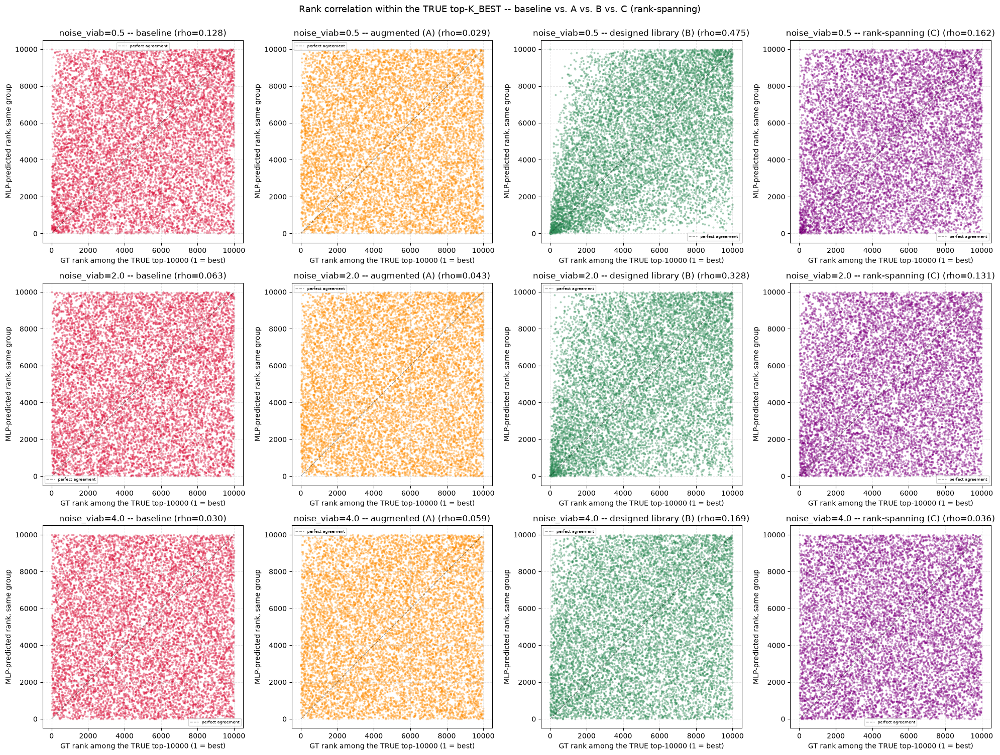

In [36]:
fig, axes = plt.subplots(len(NOISE_LEVELS_FOCUS), 4, figsize=(20, 5 * len(NOISE_LEVELS_FOCUS)))
for row, nv in enumerate(NOISE_LEVELS_FOCUS):
    panels = [
        (axes[row, 0], pred_best_baseline[nv],   "baseline",             "crimson"),
        (axes[row, 1], pred_best_A_by_noise[nv], "augmented (A)",        "darkorange"),
        (axes[row, 2], pred_best_B_by_noise[nv], "designed library (B)", "seagreen"),
        (axes[row, 3], pred_best_C_by_noise[nv], "rank-spanning (C)",    "purple"),
    ]
    for ax, pred_best, name, color in panels:
        y_rank = mlp_rank(pred_best, ascending=False)
        rho = spearmanr(gt_rank, y_rank).statistic
        ax.scatter(gt_rank, y_rank, s=4, alpha=0.3, color=color)
        ax.plot([1, K_BEST], [1, K_BEST], "k--", alpha=0.4, lw=1, label="perfect agreement")
        ax.set_xlabel(f"GT rank among the TRUE top-{K_BEST} (1 = best)")
        ax.set_ylabel("MLP-predicted rank, same group")
        ax.set_title(f"noise_viab={nv} -- {name} (rho={rho:.3f})")
        ax.legend(fontsize=6)
        ax.grid(True, linestyle="--", alpha=0.3)
fig.suptitle("Rank correlation within the TRUE top-K_BEST -- baseline vs. A vs. B vs. C (rank-spanning)",
             y=1.0, fontsize=13)
fig.tight_layout()
plt.show()


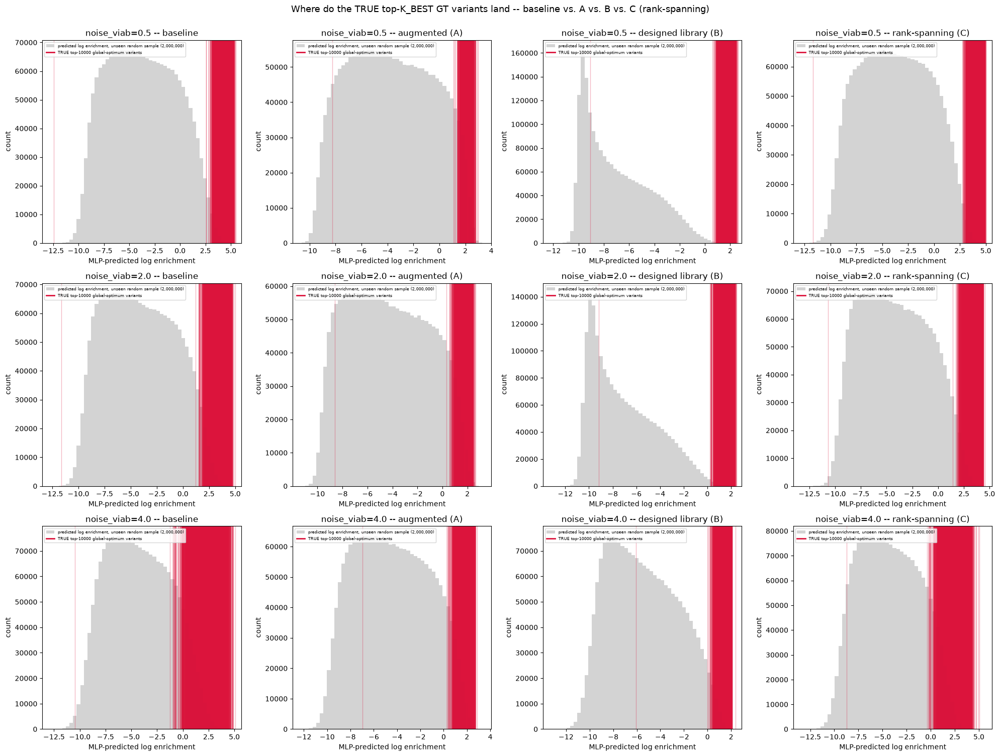

In [37]:
fig, axes = plt.subplots(len(NOISE_LEVELS_FOCUS), 4, figsize=(20, 5 * len(NOISE_LEVELS_FOCUS)))
for row, nv in enumerate(NOISE_LEVELS_FOCUS):
    panels = [
        (axes[row, 0], preds_big_by_noise[nv],   pred_best_baseline[nv],   "baseline"),
        (axes[row, 1], preds_big_A_by_noise[nv], pred_best_A_by_noise[nv], "augmented (A)"),
        (axes[row, 2], preds_big_B_by_noise[nv], pred_best_B_by_noise[nv], "designed library (B)"),
        (axes[row, 3], preds_big_C_by_noise[nv], pred_best_C_by_noise[nv], "rank-spanning (C)"),
    ]
    for ax, pred_pop, pred_best, name in panels:
        ax.hist(pred_pop, bins=50, color="lightgray",
                label=f"predicted log enrichment, unseen random sample ({len(pred_pop):,})")
        for v in pred_best:
            ax.axvline(v, color="crimson", alpha=0.3, lw=1)
        ax.axvline(pred_best[0], color="crimson", lw=2, label=f"TRUE top-{K_BEST} global-optimum variants")
        ax.set_xlabel("MLP-predicted log enrichment")
        ax.set_ylabel("count")
        ax.set_title(f"noise_viab={nv} -- {name}")
        ax.legend(fontsize=6)
fig.suptitle("Where do the TRUE top-K_BEST GT variants land -- baseline vs. A vs. B vs. C (rank-spanning)",
             y=1.0, fontsize=13)
fig.tight_layout()
plt.show()


## 13. Large-scale test: 1,000,000 sequences, evaluated against REAL protocol-simulated log enrichment

Every check so far either (a) used real NGS-simulated labels but on a modest held-out fold
(10,000-25,000 sequences, sections 5-7), or (b) used a big unseen sample (`X_big`, 2,000,000) but
only looked at the model's OWN predicted distribution -- no real label, since no simulation was run
on it (sections 8/12). This closes that gap: ONE fresh, unseen 1,000,000-sequence pool, actually run
through `ProtocolV3` (real dilution/PCR/NGS noise) to get REAL `target1`, then every model
(baseline/A/B/C) scored against that SAME real label at proper scale -- the most realistic and
statistically stable comparison in this notebook. Also reports r against the noiseless TRUE score
for reference, same as sections 5-7.


In [38]:
N_TEST_BIG = 1_000_000
key_test_big = jax.random.key(777)
sequences_test_big = jax.random.randint(key_test_big, shape=(N_TEST_BIG, NUM_POSITIONS),
                                         minval=0, maxval=NUM_AMINO_ACIDS)
X_test_big = np.eye(NUM_AMINO_ACIDS, dtype=np.float32)[np.asarray(sequences_test_big)].reshape(N_TEST_BIG, -1)
true_score_test_big = np.asarray(compute_score_array(sequences_test_big, F_viab, J_viab))

overlap_test_big = sum(tuple(row) in pool_set for row in np.asarray(sequences_test_big))
print(f"X_test_big: {X_test_big.shape}   overlap with the fixed {N:,}-sequence training/test pool: "
      f"{overlap_test_big}")


X_test_big: (1000000, 140)   overlap with the fixed 50,000-sequence training/test pool: 31


In [39]:
big_test_results = {}

for nv in NOISE_LEVELS_FOCUS:
    print(f"\n=== noise_viab = {nv} ===")

    protocol_bigtest = ProtocolV3(N0=1_000_000_000, N1=500_000_000,
            dilution_factor=10, sequences=sequences_test_big, D=1e9,
            F_viab=F_viab, J_viab=J_viab, F_sel=F_viab, J_sel=J_viab,
            noise_viab=nv, noise_sel=0.5, T_sel=1, T_viab=1,
            )
    _bio_row, ngs_row = protocol_bigtest.N_loop_DE(1)[0]
    lambda0p_bt, lambda2p_bt, _lambda3p_bt = (np.asarray(x) for x in ngs_row)
    eps = 1.0
    y_test_big = np.log((lambda2p_bt + eps) / (lambda0p_bt + eps))

    models_this_level = {
        "baseline":           models_by_noise[nv],
        "augmented (A)":      models_A_by_noise[nv],
        "designed (B)":       models_B_by_noise[nv],
        "rank-spanning (C)":  models_C_by_noise[nv],
    }
    for name, model in models_this_level.items():
        pred = np.asarray(predict_log_enrichment(model, jnp.asarray(X_test_big)))
        r_protocol = pearson(pred, y_test_big)
        r_true     = pearson(pred, true_score_test_big)
        print(f"  {name:20s}  r(pred, REAL protocol log-enrichment) = {r_protocol:.3f}   "
              f"r(pred, TRUE noiseless score) = {r_true:.3f}")
        big_test_results[(nv, name)] = dict(noise_viab=nv, model=name,
                                             r_protocol=r_protocol, r_true=r_true)

big_test_df = pd.DataFrame(big_test_results.values())
big_test_df



=== noise_viab = 0.5 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:   2%|▎         | 1/40 [00:00<00:34,  1.13it/s]

PCR cycles:  82%|████████▎ | 33/40 [00:00<00:00, 45.30it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  68%|██████▊   | 27/40 [00:00<00:00, 265.61it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  65%|██████▌   | 26/40 [00:00<00:00, 253.86it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:05<00:00,  5.04s/it]

Directed evolution rounds: 100%|██████████| 1/1 [00:05<00:00,  5.04s/it]

  baseline              r(pred, REAL protocol log-enrichment) = 0.409   r(pred, TRUE noiseless score) = 0.985
  augmented (A)         r(pred, REAL protocol log-enrichment) = 0.408   r(pred, TRUE noiseless score) = 0.983
  designed (B)          r(pred, REAL protocol log-enrichment) = 0.406   r(pred, TRUE noiseless score) = 0.950
  rank-spanning (C)     r(pred, REAL protocol log-enrichment) = 0.408   r(pred, TRUE noiseless score) = 0.985

=== noise_viab = 2.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  68%|██████▊   | 27/40 [00:00<00:00, 268.32it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  62%|██████▎   | 25/40 [00:00<00:00, 241.82it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  75%|███████▌  | 30/40 [00:00<00:00, 287.78it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

  baseline              r(pred, REAL protocol log-enrichment) = 0.389   r(pred, TRUE noiseless score) = 0.970
  augmented (A)         r(pred, REAL protocol log-enrichment) = 0.390   r(pred, TRUE noiseless score) = 0.973
  designed (B)          r(pred, REAL protocol log-enrichment) = 0.394   r(pred, TRUE noiseless score) = 0.938
  rank-spanning (C)     r(pred, REAL protocol log-enrichment) = 0.390   r(pred, TRUE noiseless score) = 0.972

=== noise_viab = 4.0 ===


Directed evolution rounds:   0%|          | 0/1 [00:00<?, ?it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  72%|███████▎  | 29/40 [00:00<00:00, 285.81it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  65%|██████▌   | 26/40 [00:00<00:00, 254.88it/s]

PCR cycles:   0%|          | 0/40 [00:00<?, ?it/s]

PCR cycles:  75%|███████▌  | 30/40 [00:00<00:00, 292.91it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

Directed evolution rounds: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

  baseline              r(pred, REAL protocol log-enrichment) = 0.285   r(pred, TRUE noiseless score) = 0.933
  augmented (A)         r(pred, REAL protocol log-enrichment) = 0.288   r(pred, TRUE noiseless score) = 0.943
  designed (B)          r(pred, REAL protocol log-enrichment) = 0.288   r(pred, TRUE noiseless score) = 0.925
  rank-spanning (C)     r(pred, REAL protocol log-enrichment) = 0.286   r(pred, TRUE noiseless score) = 0.936


,noise_viab,model,r_protocol,r_true
0,0.5,baseline,0.408875,0.984662
1,0.5,augmented (A),0.408462,0.983492
2,0.5,designed (B),0.406109,0.949583
3,0.5,rank-spanning (C),0.408431,0.985116
4,2.0,baseline,0.389466,0.970296
5,2.0,augmented (A),0.390372,0.972824
6,2.0,designed (B),0.394001,0.938035
7,2.0,rank-spanning (C),0.390370,0.972239
8,4.0,baseline,0.285479,0.933209
9,4.0,augmented (A),0.287766,0.943349


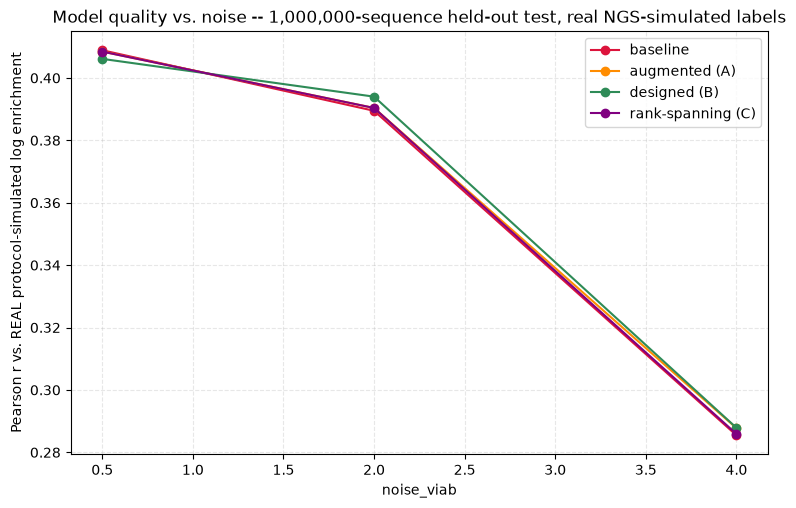

In [40]:
fig, ax = plt.subplots(figsize=(9, 5.5))
colors = {"baseline": "crimson", "augmented (A)": "darkorange",
          "designed (B)": "seagreen", "rank-spanning (C)": "purple"}
for name, color in colors.items():
    sub = big_test_df[big_test_df["model"] == name].sort_values("noise_viab")
    ax.plot(sub["noise_viab"], sub["r_protocol"], "o-", color=color, label=name)
ax.set_xlabel("noise_viab")
ax.set_ylabel("Pearson r vs. REAL protocol-simulated log enrichment")
ax.set_title(f"Model quality vs. noise -- {N_TEST_BIG:,}-sequence held-out test, real NGS-simulated labels")
ax.legend()
ax.grid(True, linestyle="--", alpha=0.3)
plt.show()


## How to read this

- If `r_model` (crimson, left plot of section 5) stays clearly ABOVE `r_raw` (gray) as `noise_viab`
  grows, the MLP is genuinely denoising -- averaging over the training pool's redundancy to recover
  a signal cleaner than any single noisy measurement.
- If `r_model` tracks `r_raw` closely and both collapse together, the model is just memorizing/
  mirroring whatever noisy label it was handed, with no real denoising benefit -- at that point more
  `noise_viab` simply destroys the learnable signal, full stop.
- The section-6 scatter plots make the same point visually: a denoising model should keep looking
  like a (noisy but centered) diagonal line as noise grows, not degenerate into a flat blob.



noise_viab	recouvrement 20K (base/A/B)	recouvrement 50K (base/A/B)
0.5	9.0/0.0/32.5%	7.7/0.0/44.0%
2.0	6.0/0.0/10.9%	3.5/0.0/25.2%
4.0	0.2/0.0/0.0%	0.8/0.0/0.5%